<a href="https://colab.research.google.com/github/DavidEmeryUofC/CDS_Project_Restaurant_Rev_Prediction/blob/main/CDSproject2_RestaurantRevenueNew.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

---
<center> <h1> <span style='color:#292D78'> CREWES Data Science Training </span> </h1> </center>

<center> <h2> <span style='color:#DF7F00'> Project: Restaurant Revenue Prediction </span> </h2> </center>

---

This [Jupyter Notebook](https://jupyter.org/install) is for analysing the data in the [Kaggle Project](https://www.kaggle.com/code/akouaorsot/restaurant-revenue-s-predictions) for estimation of Restaurant Revenue.  

Project members are: [David Emery](https://www.linkedin.com/in/david-emery-54659a3a/), [Nazhat Shirin Rashid](https://www.linkedin.com/in/nazhatrashid/), [Stephanie Misailidis](https://www.linkedin.com/in/stephanie-jimenez-misailidis-54a6b3b1/?originalSubdomain=ca), and [Reginaldo Moriera](https://www.linkedin.com/in/reginaldo-moreira-70a016b3/)

In [1]:
# Core utilities
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(rc={'figure.figsize': (10,7)}) # default figure size set for Powerpoint

# print plots
%matplotlib inline 

# To supress warnings and deprecated messages
import warnings
warnings.filterwarnings("ignore")

## Import data
2 csv files one for training and one for testing

In [2]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


### Data fields
Id : Restaurant id.   
Open Date : opening date for a restaurant  
City : City that the restaurant is in. Note that there are unicode in the names.   
City Group: Type of the city. Big cities, or Other.   
Type: Type of the restaurant. FC: Food Court, IL: Inline, DT: Drive Thru, MB: Mobile  
P1, P2 - P37: There are three categories of these obfuscated data.   
- Demographic data are gathered from third party providers with GIS systems. These include population in any given area, age and gender distribution, development scales.  
- Real estate data mainly relate to the m2 of the location, front facade of the location, car park availability.  
- Commercial data mainly include the existence of points of interest including schools, banks, other QSR operators.  

Revenue: The revenue column indicates a (transformed) revenue of the restaurant in a given year and is the target of predictive analysis. Please note that the values are transformed so they don't mean real dollar values. 

In [3]:
filepath = '/content/drive/MyDrive/CDS_Course/project'
filename = filepath + '/test.csv'
print(filename)
df_test = pd.read_csv(filename)
df_test.head()

/content/drive/MyDrive/CDS_Course/project/test.csv


,Id,Open Date,City,City Group,Type,P1,P2,P3,P4,P5,...,P28,P29,P30,P31,P32,P33,P34,P35,P36,P37
0,0,01/22/2011,Niğde,Other,FC,1,4.0,4.0,4.0,1,...,2.0,3.0,0,0,0,0,0,0,0,0
1,1,03/18/2011,Konya,Other,IL,3,4.0,4.0,4.0,2,...,1.0,3.0,0,0,0,0,0,0,0,0
2,2,10/30/2013,Ankara,Big Cities,FC,3,4.0,4.0,4.0,2,...,2.0,3.0,0,0,0,0,0,0,0,0
3,3,05/06/2013,Kocaeli,Other,IL,2,4.0,4.0,4.0,2,...,2.0,3.0,0,4,0,0,0,0,0,0
4,4,07/31/2013,Afyonkarahisar,Other,FC,2,4.0,4.0,4.0,1,...,5.0,3.0,0,0,0,0,0,0,0,0


In [4]:
df_test.shape

(100000, 42)

In [5]:
filepath = '/content/drive/MyDrive/CDS_Course/project'
filename = filepath + '/train.csv'
print(filename)
df_train = pd.read_csv(filename)
df_train.head()

/content/drive/MyDrive/CDS_Course/project/train.csv


,Id,Open Date,City,City Group,Type,P1,P2,P3,P4,P5,...,P29,P30,P31,P32,P33,P34,P35,P36,P37,revenue
0,0,07/17/1999,İstanbul,Big Cities,IL,4,5.0,4.0,4.0,2,...,3.0,5,3,4,5,5,4,3,4,5653753.0
1,1,02/14/2008,Ankara,Big Cities,FC,4,5.0,4.0,4.0,1,...,3.0,0,0,0,0,0,0,0,0,6923131.0
2,2,03/09/2013,Diyarbakır,Other,IL,2,4.0,2.0,5.0,2,...,3.0,0,0,0,0,0,0,0,0,2055379.0
3,3,02/02/2012,Tokat,Other,IL,6,4.5,6.0,6.0,4,...,7.5,25,12,10,6,18,12,12,6,2675511.0
4,4,05/09/2009,Gaziantep,Other,IL,3,4.0,3.0,4.0,2,...,3.0,5,1,3,2,3,4,3,3,4316715.0


In [6]:
df_train.shape

(137, 43)

The number of restaurant in the training data (137) significantly less than found in the test data. The next is to check for duplicates & nan and evaluate attributes.

In [7]:
features = list(df_test.drop(columns=['Id']))
print("Duplication in numerical columns in test data",df_test[features].duplicated().sum())
print("Duplication in numerical columns in train data",df_train[features].duplicated().sum())
print("Test for nan's in test data",df_test[features].isna().sum().sum())
print("Test for nan's in train data",df_train[features].isna().sum().sum())

Duplication in numerical columns in test data 2290
Duplication in numerical columns in train data 0
Test for nan's in test data 0
Test for nan's in train data 0


No nan and no duplicates in the training data but 2290 in the test data. As the contest requires an estimate for each of the 100000 points and this represents less than 2.5% of the data, choose to leave the duplicates within the data.


Lets take a quick look at the attribute statisics.

In [8]:
features = list(df_test.drop(columns=['Id','Open Date']))
print("Duplication dropping Open Date and Revenue on the test data",df_test[features].duplicated().sum())

Duplication dropping Open Date and Revenue on the test data 2569


In [9]:
df_test[df_test[features].duplicated()]

,Id,Open Date,City,City Group,Type,P1,P2,P3,P4,P5,...,P28,P29,P30,P31,P32,P33,P34,P35,P36,P37
1174,1174,09/09/2010,Hatay,Other,FC,3,4.0,4.0,4.0,2,...,1.0,3.0,0,0,0,0,0,0,0,0
1957,1957,09/07/2010,İstanbul,Big Cities,FC,4,5.0,4.0,5.0,1,...,5.0,1.0,0,0,0,0,0,0,0,0
2181,2181,10/18/2012,İstanbul,Big Cities,FC,4,5.0,4.0,5.0,1,...,5.0,1.0,0,0,0,0,0,0,0,0
2847,2847,10/18/2012,İstanbul,Big Cities,FC,4,5.0,4.0,5.0,1,...,5.0,1.0,0,0,0,0,0,0,0,0
2866,2866,03/16/2007,İstanbul,Big Cities,FC,4,4.0,2.0,4.0,3,...,2.0,3.0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99797,99797,11/19/2009,İstanbul,Big Cities,IL,3,1.5,4.5,4.5,4,...,2.5,7.5,0,0,0,0,0,0,0,0
99807,99807,06/08/2000,Kocaeli,Other,FC,3,4.0,4.0,4.0,2,...,2.0,3.0,0,0,0,0,0,0,0,0
99833,99833,11/22/2012,İstanbul,Big Cities,IL,2,3.0,4.0,4.0,2,...,2.0,3.0,3,2,3,4,3,5,3,3
99851,99851,10/12/2013,İstanbul,Big Cities,IL,12,7.5,6.0,6.0,4,...,5.0,7.5,0,0,0,0,0,0,0,0


The duplicates appear to be dominated when there is a lot of zero in the Ps Columns.

In [10]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137 entries, 0 to 136
Data columns (total 43 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Id          137 non-null    int64  
 1   Open Date   137 non-null    object 
 2   City        137 non-null    object 
 3   City Group  137 non-null    object 
 4   Type        137 non-null    object 
 5   P1          137 non-null    int64  
 6   P2          137 non-null    float64
 7   P3          137 non-null    float64
 8   P4          137 non-null    float64
 9   P5          137 non-null    int64  
 10  P6          137 non-null    int64  
 11  P7          137 non-null    int64  
 12  P8          137 non-null    int64  
 13  P9          137 non-null    int64  
 14  P10         137 non-null    int64  
 15  P11         137 non-null    int64  
 16  P12         137 non-null    int64  
 17  P13         137 non-null    float64
 18  P14         137 non-null    int64  
 19  P15         137 non-null    i

Four objects and the rest either int64 or float64. The Open Date shouldn't be an object and convered into a [date](https://pandas.pydata.org/docs/reference/api/pandas.to_datetime.html). 

In [11]:
df_train["ODate"] = pd.to_datetime(df_train["Open Date"], format = "%m/%d/%Y", utc = False)
df_test["ODate"] = pd.to_datetime(df_test["Open Date"], format = "%m/%d/%Y", utc = False)

firstopenT = pd.to_datetime(df_test["ODate"].min(), format='%Y-%m-%d', utc = False)
lastopenT = pd.to_datetime(df_test["ODate"].max(), format='%Y-%m-%d', utc = False)
print("test data",firstopenT,lastopenT)

firstopen = pd.to_datetime(df_train["ODate"].min(), format='%Y-%m-%d', utc = False)
lastopen = pd.to_datetime(df_train["ODate"].max(), format='%Y-%m-%d', utc = False)
print("train data",firstopen,lastopen)

df_train["DOpen"] = (lastopen - df_train["ODate"])/ pd.offsets.Day(1)
df_test["DOpen"] = (lastopenT - df_test["ODate"])/ pd.offsets.Day(1)

test data 1995-05-08 00:00:00 2014-01-04 00:00:00
train data 1996-05-08 00:00:00 2014-01-25 00:00:00


In [12]:
df_train.drop(columns=['Open Date'],inplace=True)
df_test.drop(columns=['Open Date'],inplace=True)

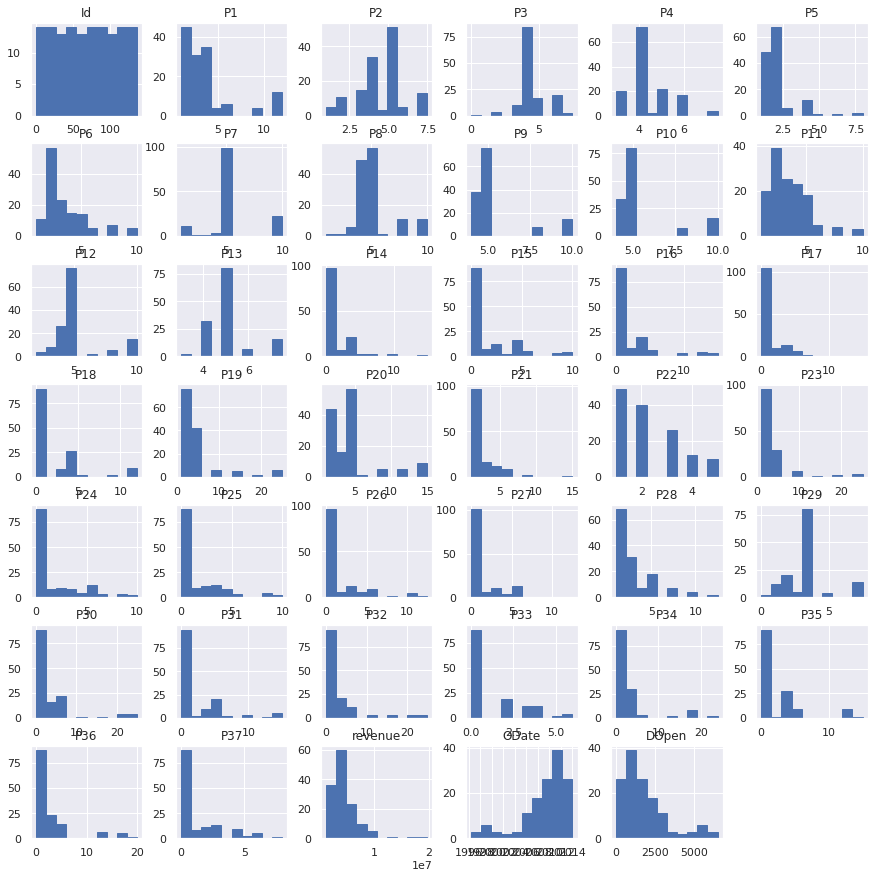

In [13]:
df_train.hist(figsize=(15,15),edgecolor='b');

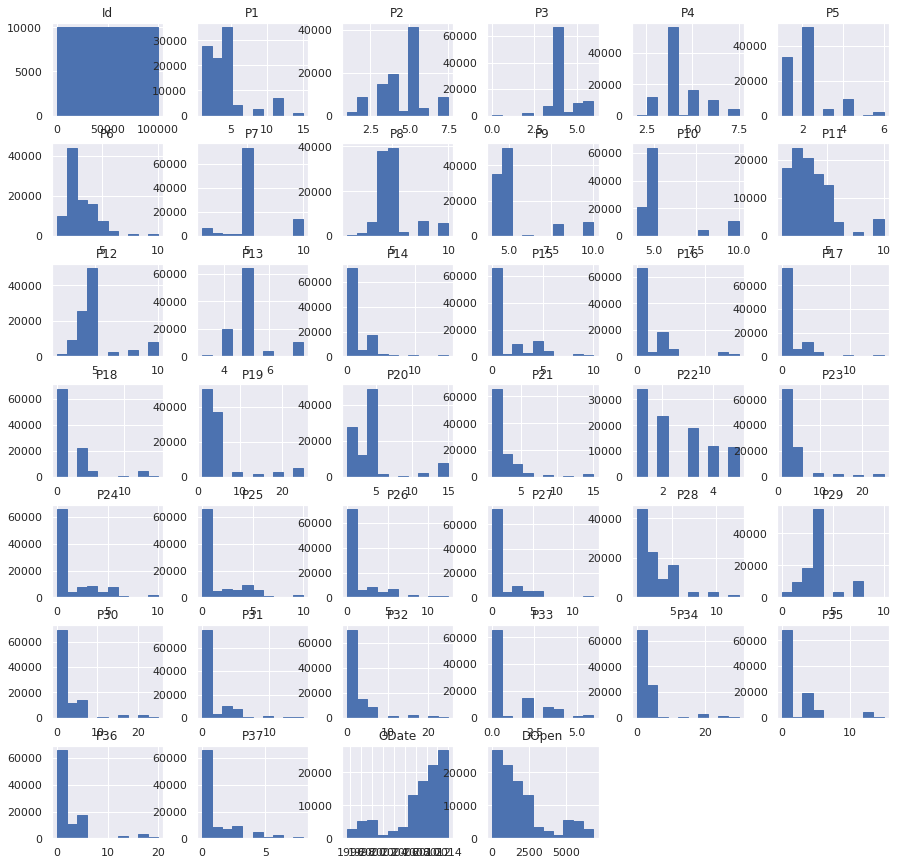

In [14]:
df_test.hist(figsize=(15,15),edgecolor='b');

There appears to be 2 problem: first a high number of zero, and second the 137 training dataset having different statisical distribution than the test data. 

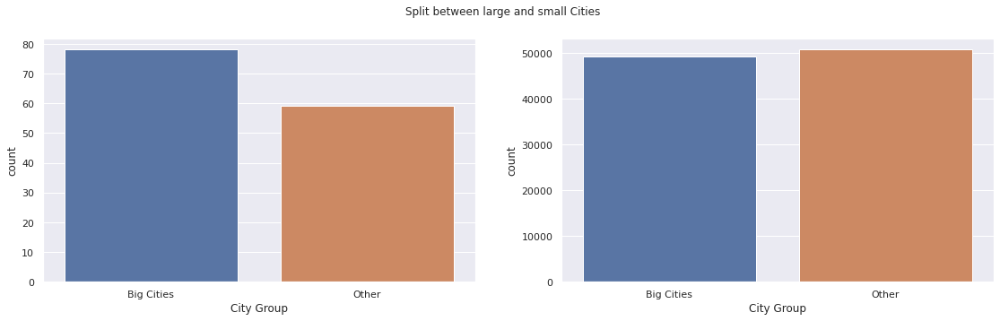

In [15]:
fig, ax = plt.subplots(1,2, figsize=(19, 5))
horder = ['Big Cities','Other']
g1 = sns.countplot(data = df_train, x = "City Group", order = horder, ax= ax[0])
g2 = sns.countplot(data = df_test, x = "City Group", order = horder, ax= ax[1])
plt.suptitle('Split between large and small Cities',fontsize=12);

Test data balance between Big Cities and Others, not the same in the training data

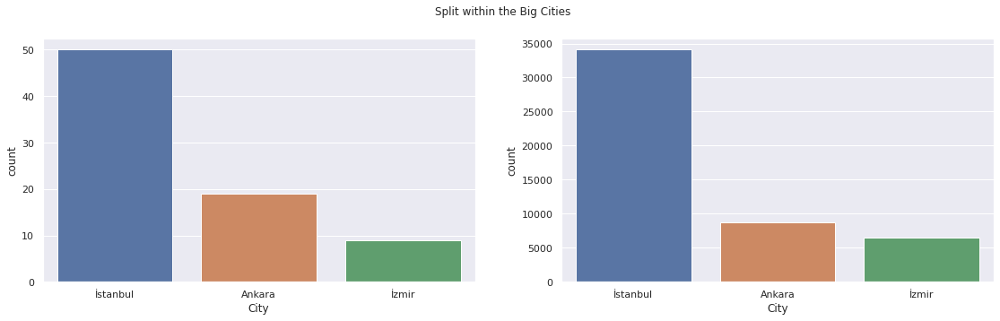

In [16]:
fig, ax = plt.subplots(1,2, figsize=(19, 5))
large_cityOrder = df_test[df_test["City Group"] == 'Big Cities'].groupby('City').size().sort_values().index[::-1]
sns.countplot(data = df_train[df_train["City Group"] == 'Big Cities'], x = "City", order=large_cityOrder, ax = ax[0]);
sns.countplot(data = df_test[df_test["City Group"] == 'Big Cities'], x = "City", order=large_cityOrder, ax = ax[1])
plt.suptitle('Split within the Big Cities',fontsize=12);

Only 3 cities in the Big City object with the majority of the restaurant being in Istanbul. Again uneven distribution between training and testing datasets.

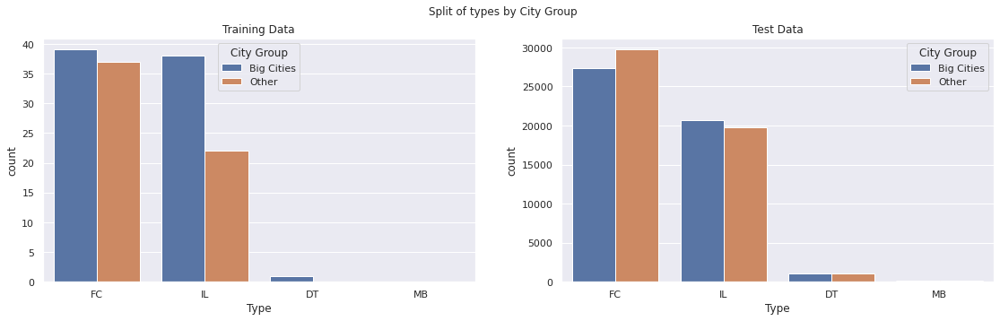

In [17]:
fig, ax = plt.subplots(1,2, figsize=(19, 5))
porder = ['FC','IL','DT','MB']
horder = ['Big Cities','Other']
sns.countplot(data = df_train, x = "Type",  hue="City Group",order=porder, hue_order=horder, ax = ax[0]).set(title='Training Data')
sns.countplot(data = df_test, x = "Type",  hue="City Group", order=porder, hue_order=horder, ax = ax[1]).set(title='Test Data')
plt.suptitle('Split of types by City Group',fontsize=12);

Likewise the balance of restaurant type is different between the train and test datasets.

###Checking for the meaning of the zeros

In [18]:
# Extracting names of numerical and categorical features
cols_num = list(df_train.drop(columns = ["Id","revenue"]).select_dtypes(include = ["int64", "float64"]))
cols_cat = list(df_train.drop(columns = ["Id"]).select_dtypes(include = ["object", "category", "bool"]))

In [19]:
print("The percentage of zero in the train dataframe\n")
print((df_train[cols_num] == 0).sum()*100/df_train.shape[0])
print("The percentage of zero in the test dataframe\n")
print((df_test[cols_num] == 0).sum()*100/df_test.shape[0])

The percentage of zero in the train dataframe

P1        0.000000
P2        0.000000
P3        0.729927
P4        0.000000
P5        0.000000
P6        0.000000
P7        0.000000
P8        0.000000
P9        0.000000
P10       0.000000
P11       0.000000
P12       0.000000
P13       0.000000
P14      64.233577
P15      64.233577
P16      64.233577
P17      64.233577
P18      64.233577
P19       0.000000
P20       0.000000
P21       0.000000
P22       0.000000
P23       0.000000
P24      64.233577
P25      64.233577
P26      64.233577
P27      64.963504
P28       0.000000
P29       1.459854
P30      64.233577
P31      64.233577
P32      64.233577
P33      64.233577
P34      64.233577
P35      64.233577
P36      64.233577
P37      64.233577
DOpen     0.729927
dtype: float64
The percentage of zero in the test dataframe

P1        0.000
P2        0.000
P3        0.318
P4        0.000
P5        0.000
P6        0.000
P7        0.000
P8        0.000
P9        0.000
P10       0.000
P11       

The documentation states that the zero may actually represent nan.  The concern is where are the zero real as like in P3 & P29 and potential nan as in P14-P18, P24-P27 & P30-37. 

In [20]:
PsZeros = ['P14','P15','P16','P17','P18','P24','P25','P26','P27','P30','P31','P32','P33','P34','P35','P36','P37']

In [21]:
df_train['Zeros'] = 0
df_test['Zeros'] = 0
for i in PsZeros:
  df_train['Zeros'] += df_train[i]
  df_test['Zeros'] += df_test[i]
print("The percentage of all zero \n")
print("for the training data",(df_train['Zeros'] == 0).sum()*100/df_train.shape[0] )
print("for the testing data",(df_test['Zeros'] == 0).sum()*100/df_test.shape[0] )

The percentage of all zero 

for the training data 64.23357664233576
for the testing data 35.131


Do the zero represents a data type

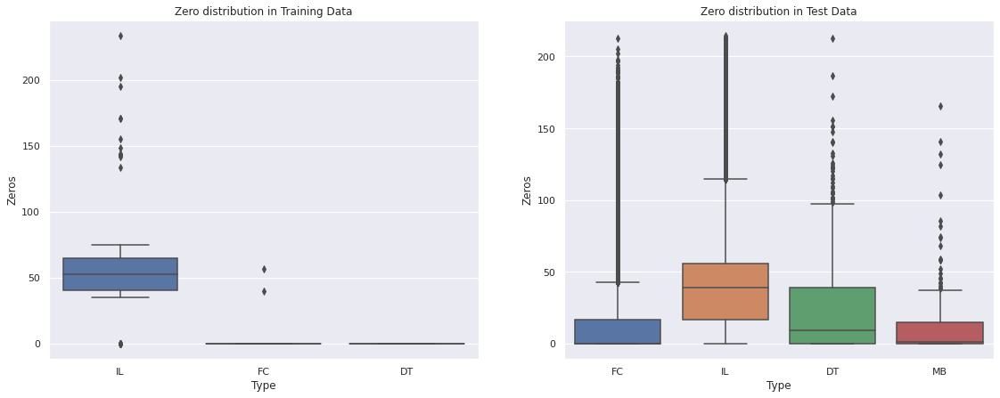

In [22]:
fig, ax = plt.subplots(1,2, figsize = (19,7))
sns.boxplot(data = df_train, x='Type', y='Zeros',ax = ax[0]).set(title='Zero distribution in Training Data')
sns.boxplot(data = df_test, x='Type', y='Zeros',ax = ax[1]).set(title='Zero distribution in Test Data')
plt.show();

The zero appears to be concentrated on the FC & DT data types.  This makes sense as food courts (FC) and drive thru (DT) wouldn't have certain stats such as parking spaces. The absence of mobile (MB) in the training set and the different in distribution between the train & test data may also present a future problem when estimating revenue on the test dat.

In [23]:
df_train.drop(columns=['Zeros'],inplace=True)
df_test.drop(columns=['Zeros'],inplace=True)

## Evaluate Columns using [distplot](https://seaborn.pydata.org/generated/seaborn.distplot.html)

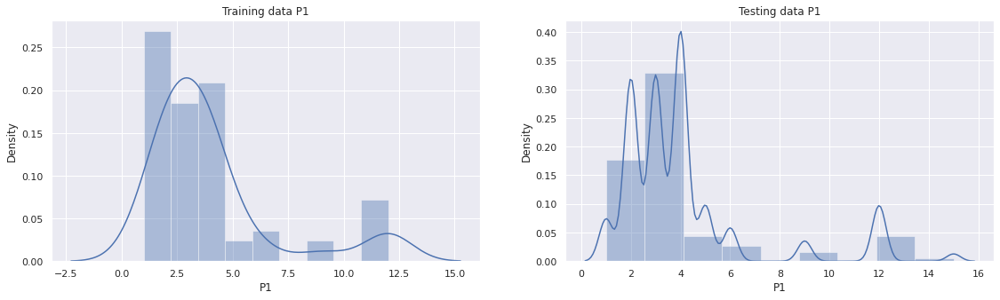

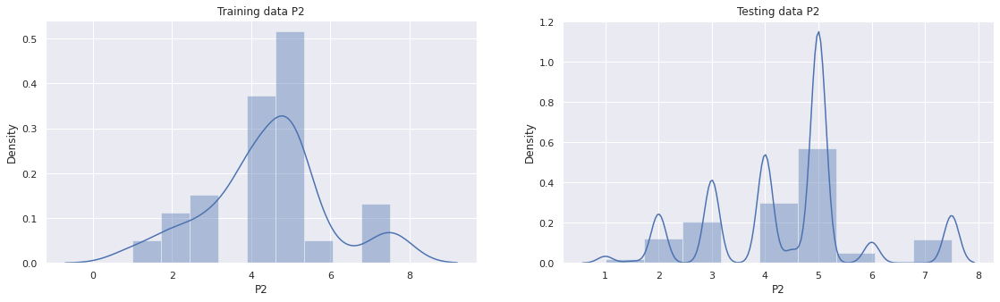

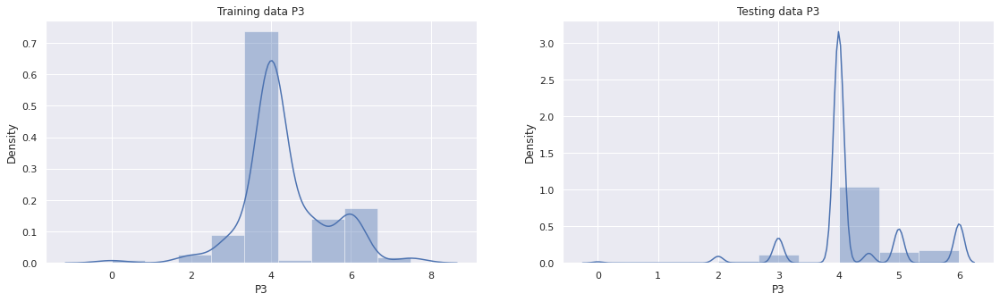

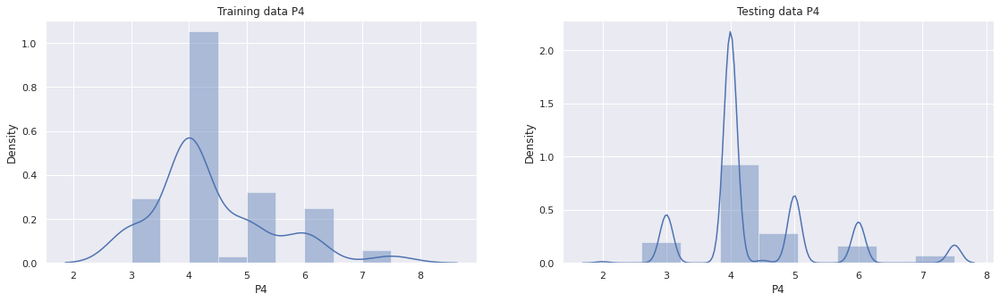

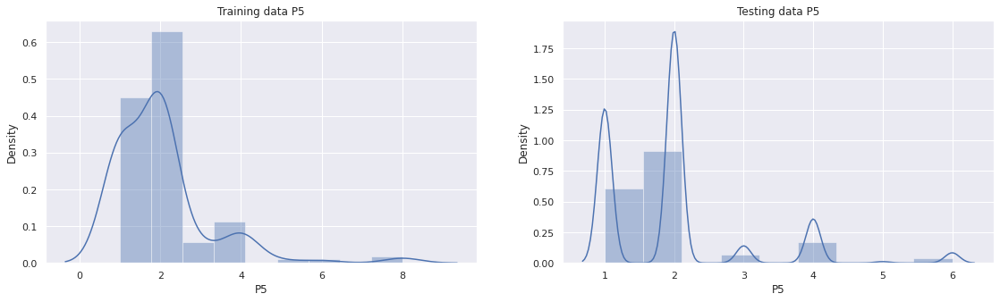

...

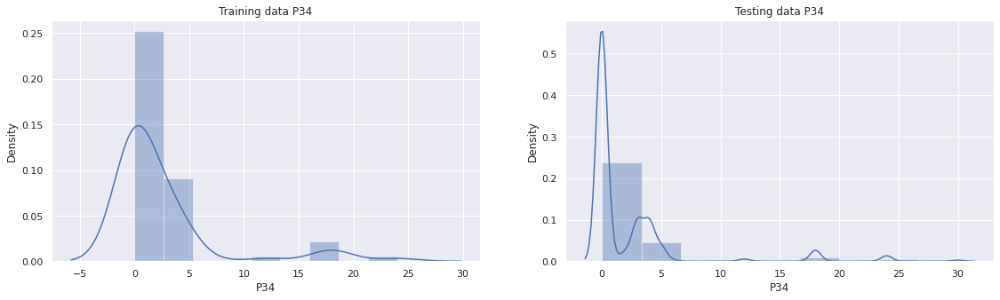

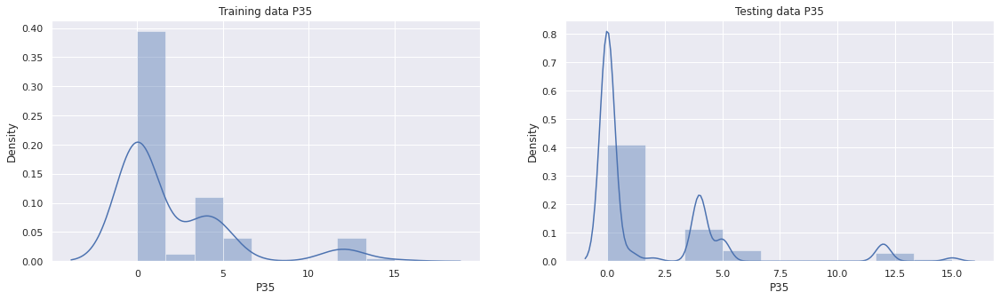

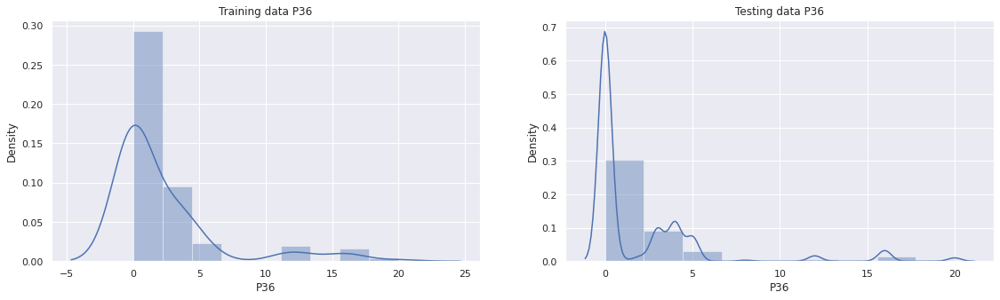

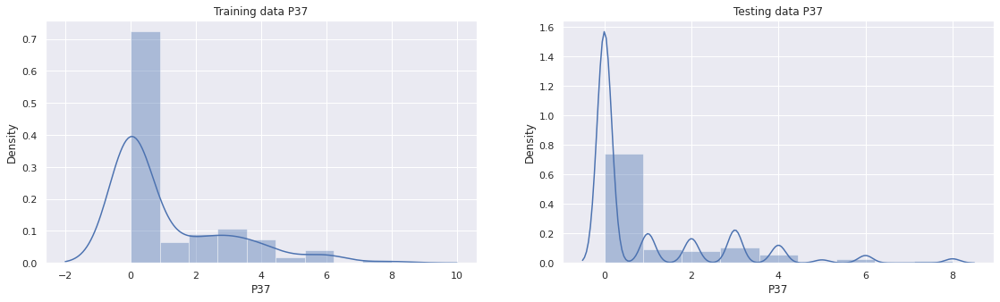

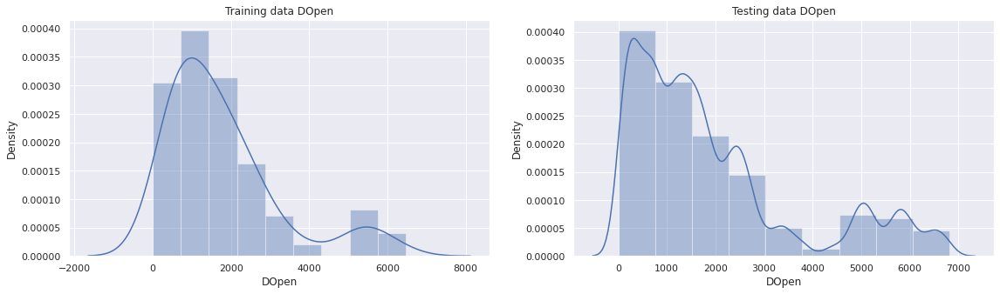

In [24]:
plt.rc('figure', max_open_warning = 0)
for i in cols_num:
    fig, ax = plt.subplots(1,2, figsize=(19, 5))
    g1 = sns.distplot(df_train[i], ax=ax[0], bins = 9).set(title='Training data ' + i)#, kde=False);
    g2 = sns.distplot(df_test[i], ax=ax[1], bins = 9).set(title='Testing data ' + i)#, kde=False);
    fig.show()

Same plot but now dropping the zero 

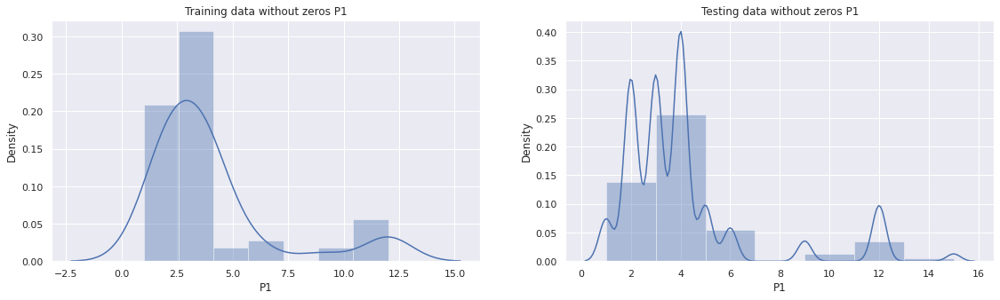

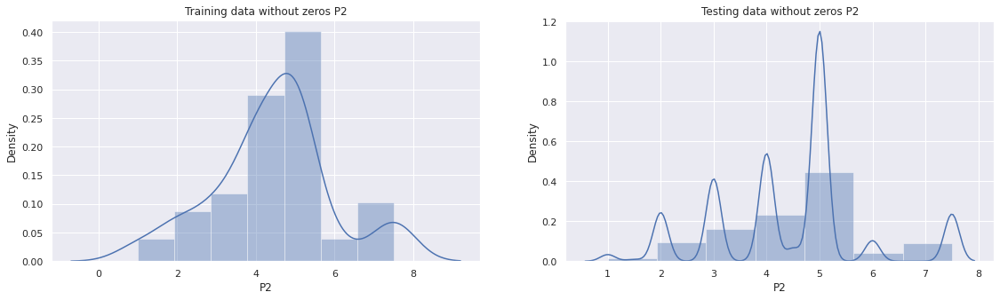

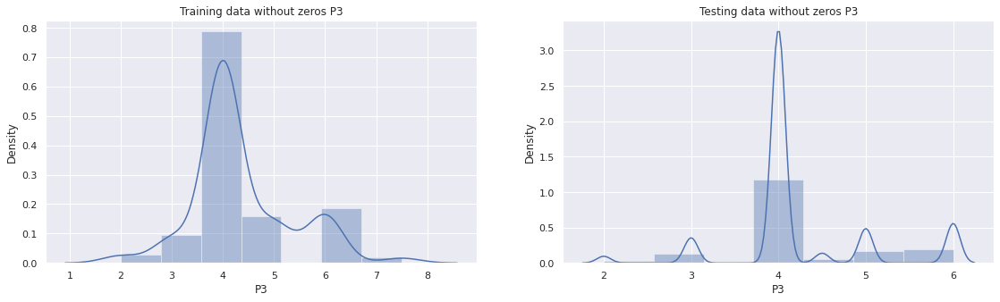

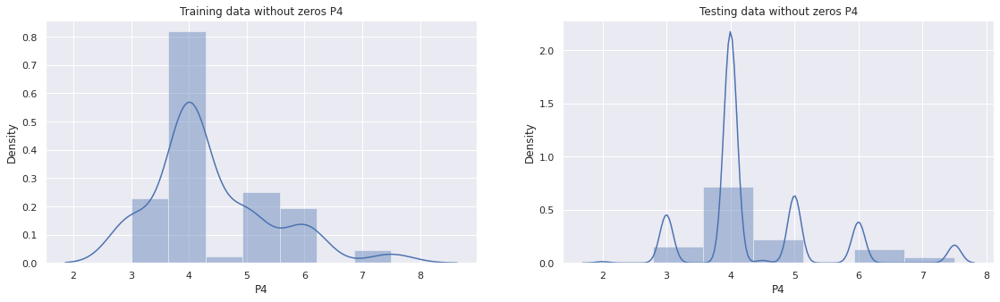

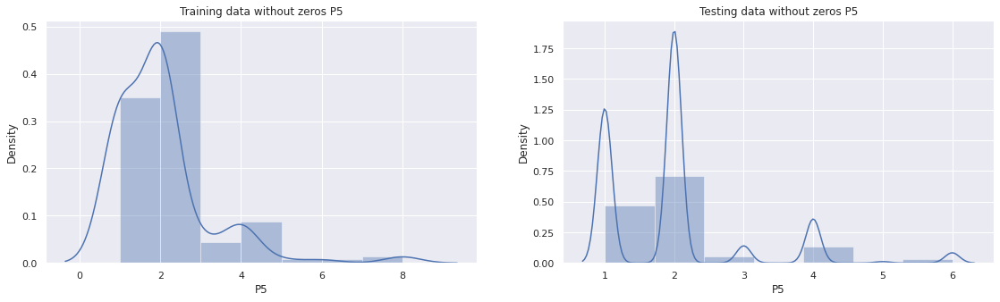

...

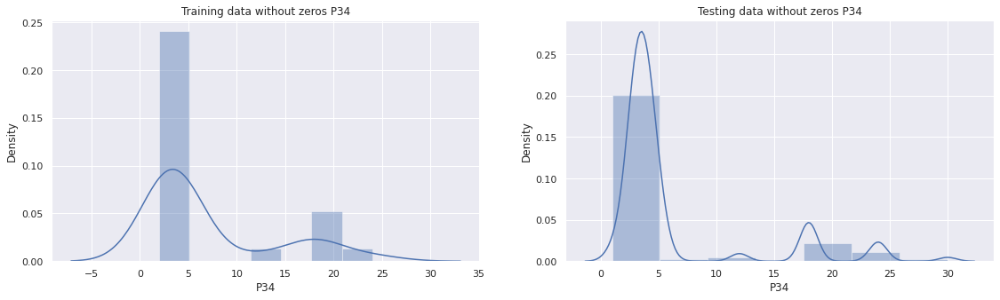

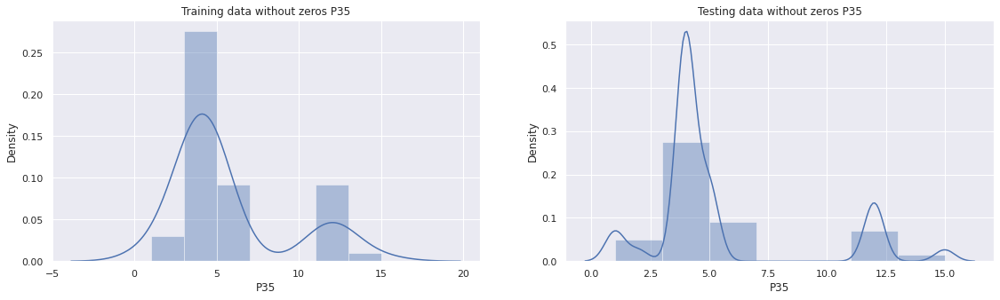

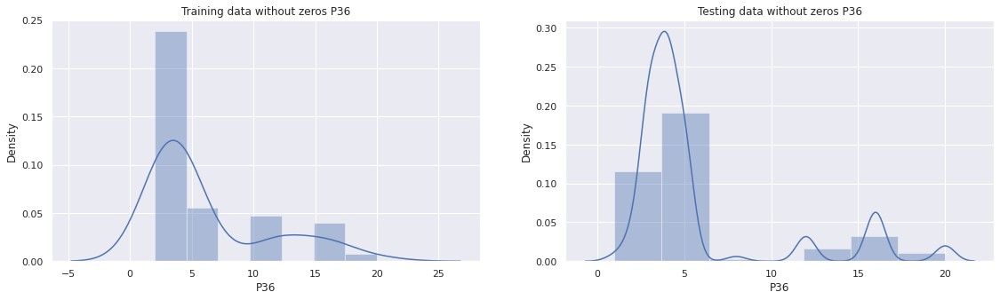

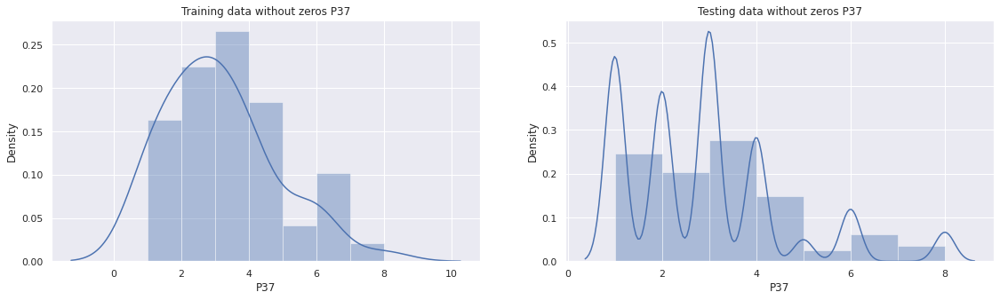

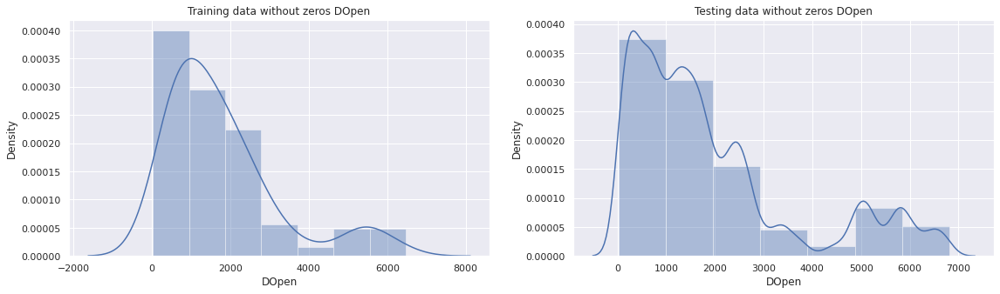

In [25]:
plt.rc('figure', max_open_warning = 0)
for i in cols_num:
    fig, ax = plt.subplots(1,2, figsize=(19, 5))
    g1 = sns.distplot(df_train[i][df_train[i] != 0], ax=ax[0], bins = 7).set(title='Training data without zeros ' + i)#, kde=False);
    g2 = sns.distplot(df_test[i][df_test[i] != 0], ax=ax[1], bins = 7).set(title='Testing data without zeros ' + i)#, kde=False);
    fig.show()

Check theIL data type that appear to be mostly zeros

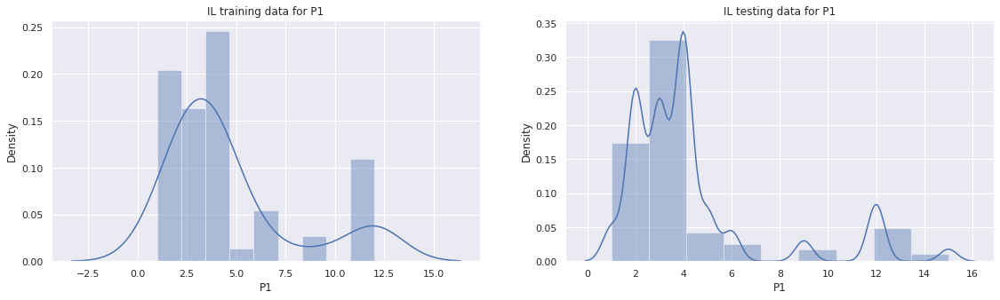

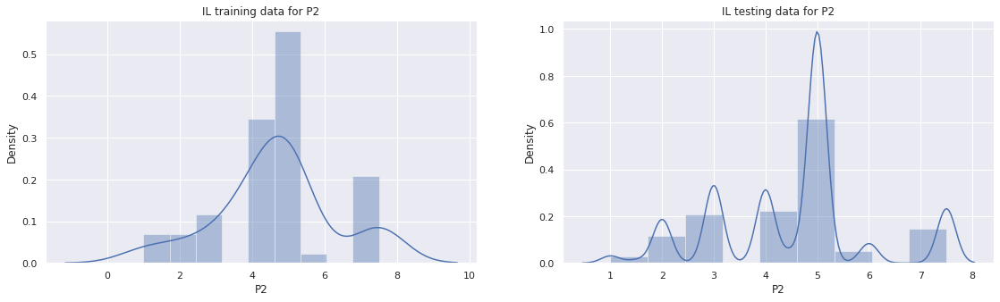

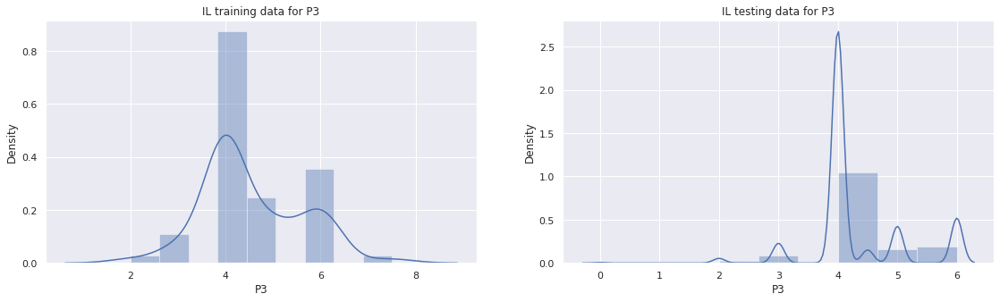

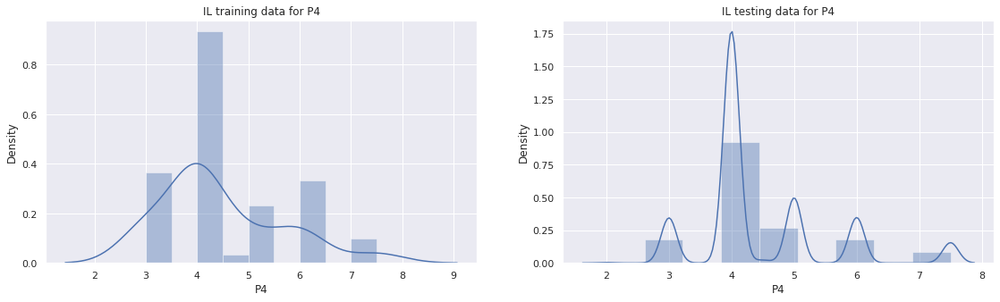

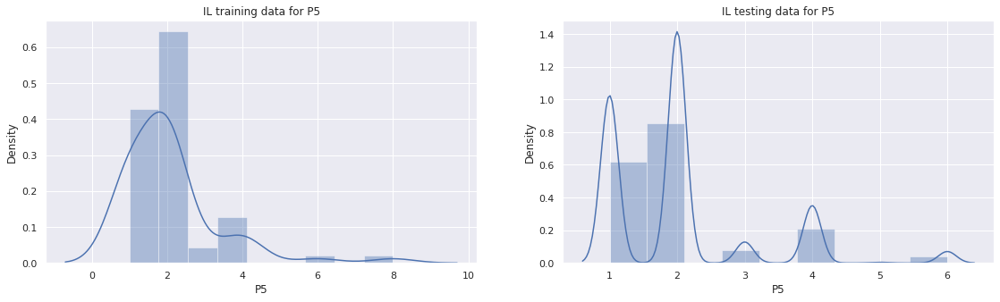

...

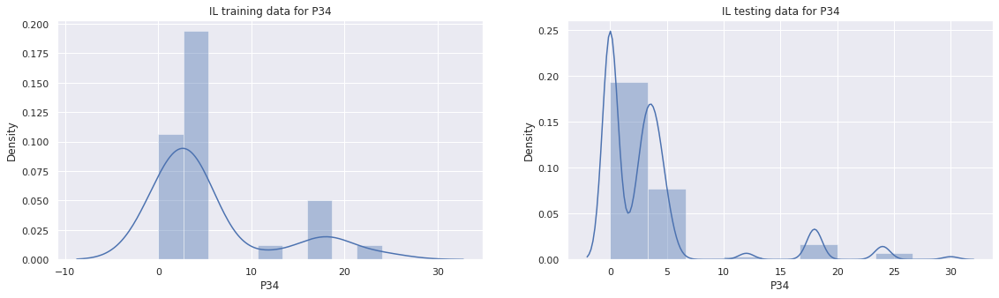

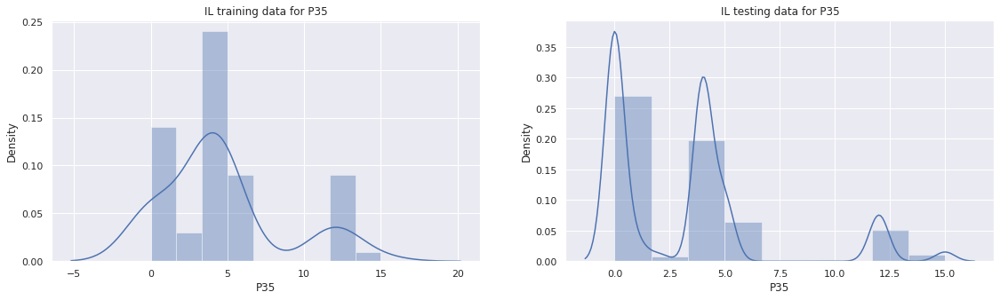

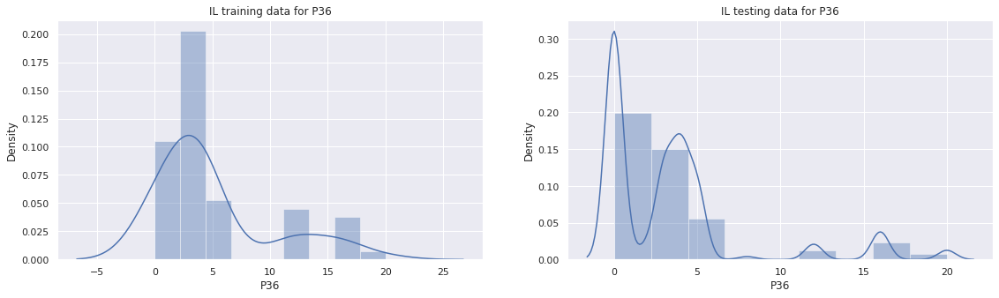

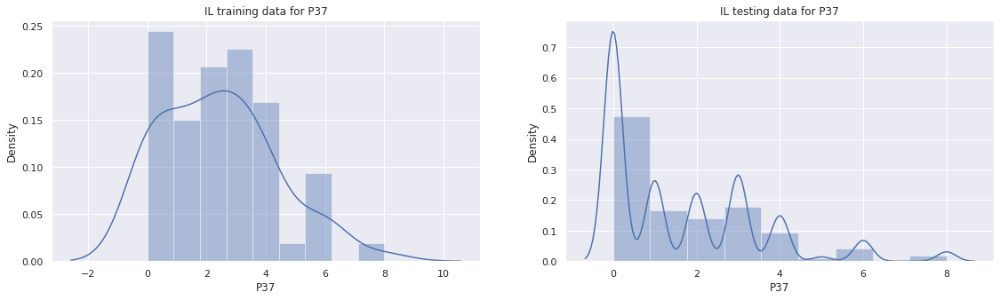

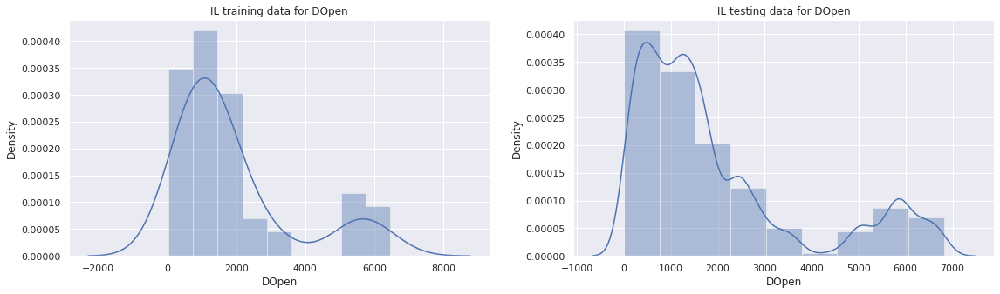

In [26]:
for i in cols_num:
    fig, ax = plt.subplots(1,2, figsize=(19, 5))
    g1 = sns.distplot(df_train[i][df_train['Type'] == 'IL'], ax=ax[0], bins = 9).set(title = 'IL training data for '+ i)
    g2 = sns.distplot(df_test[i][df_test['Type'] == 'IL'], ax=ax[1], bins = 9).set(title = 'IL testing data for '+ i)
    fig.show()

The test data even for the IL restaurant also contains zero and demonstrate variation from the training data. As we hope to use standard scaling to aid the regression analysis, solution selected is to merge the train and test datasets for scaling and resplit for analysis.

### Evalute target (revenue)

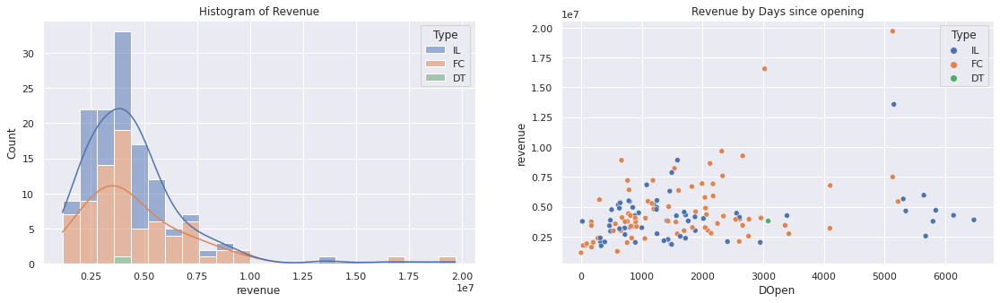

In [27]:
fig, ax = plt.subplots(1,2, figsize=(19, 5))
g1 = sns.histplot(data=df_train, x="revenue", hue="Type", multiple="stack", kde=True, ax = ax[0]).set(title='Histogram of Revenue');
g2 = sns.scatterplot(data=df_train,x="DOpen",y="revenue", hue="Type", ax = ax[1]).set(title='Revenue by Days since opening');
fig.show();

Revenue appears to be highly right-hand scud with 3 outliers

In [28]:
print(df_train[df_train.revenue > 12500000])

    Id      City  City Group Type  P1   P2   P3   P4  P5  P6  ...  P31  P32  \
16  16  İstanbul  Big Cities   FC   3  5.0  4.0  4.0   2   5  ...    0    0   
75  75  İstanbul  Big Cities   FC   5  5.0  4.0  5.0   1   4  ...    0    0   
99  99  İstanbul  Big Cities   IL   4  5.0  4.0  4.0   2   4  ...    5    4   

    P33  P34  P35  P36  P37     revenue      ODate   DOpen  
16    0    0    0    0    0  19696939.0 2000-01-07  5132.0  
75    0    0    0    0    0  16549064.0 2005-10-15  3024.0  
99    2    5    5    5    3  13575224.0 1999-12-18  5152.0  

[3 rows x 44 columns]


The 3 outliers are all in Istanbul with the 2 highest values both type FC (food court). These 2 will also be hampered by the missing Ps values.

In [29]:
df_train[cols_num][df_train.revenue > 12500000].describe().T

,count,mean,std,min,25%,50%,75%,max
P1,3.0,4.000000,1.000000,3.0,3.5,4.0,4.5,5.0
P2,3.0,5.000000,0.000000,5.0,5.0,5.0,5.0,5.0
P3,3.0,4.000000,0.000000,4.0,4.0,4.0,4.0,4.0
P4,3.0,4.333333,0.577350,4.0,4.0,4.0,4.5,5.0
P5,3.0,1.666667,0.577350,1.0,1.5,2.0,2.0,2.0
P6,3.0,4.333333,0.577350,4.0,4.0,4.0,4.5,5.0
P7,3.0,5.000000,0.000000,5.0,5.0,5.0,5.0,5.0
P8,3.0,3.666667,0.577350,3.0,3.5,4.0,4.0,4.0
P9,3.0,4.333333,0.577350,4.0,4.0,4.0,4.5,5.0
P10,3.0,4.000000,0.000000,4.0,4.0,4.0,4.0,4.0


5 Ps columns are consistent with these 3 high revenue point (P2, P3, P7, P10 & P13).

The revenue appears to be right-hand skewed and a log normalization may be appropriate,

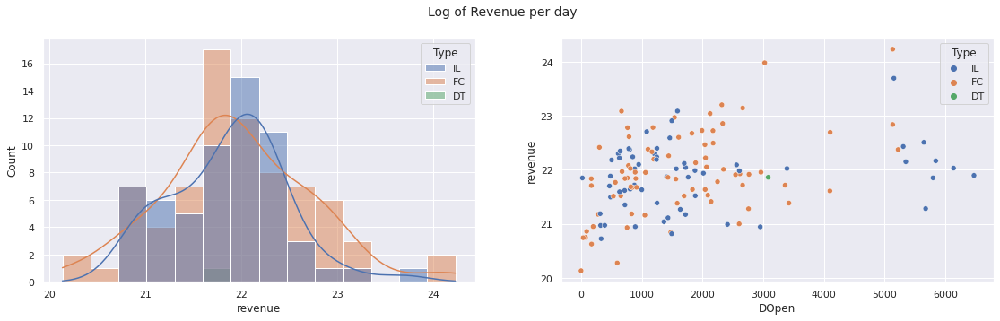

In [30]:
fig, ax = plt.subplots(1,2, figsize=(19, 5))
g1 = sns.histplot(x=np.log2(df_train['revenue']),hue=df_train["Type"], kde=True, ax=ax[0]);
g2 = sns.scatterplot(x=df_train['DOpen'],y=np.log2(df_train['revenue']),hue=df_train["Type"], ax=ax[1]);
plt.suptitle('Log of Revenue per day',fontsize=14)
fig.show();

Log2 normalization appears appropriate but there also appears a relationship with the number of years open.

In [31]:
df_train['revenue_log'] = np.log2(df_train['revenue'])

Detail analysis to determine if any attributes need log scaling prior to normalization.  First lets looking at the target (revenue), second the object columns, and finally the Ps columns.

Before conducting the z transform of the target ('revenue_log') preserve the mean and the std.

In [32]:
target_mean = np.mean(df_train['revenue'])
target_std = np.std(df_train['revenue'])
Ltarget_mean = np.mean(df_train['revenue_log'])
Ltarget_std = np.std(df_train['revenue_log'])
print(target_mean,target_std,Ltarget_mean,Ltarget_std)

4453532.613138686 2566652.6552286986 21.910487445442932 0.6909798611250181


In [33]:
from sklearn.linear_model import LinearRegression

# Creating the model
model_lr = LinearRegression()

df_train['DOpen2'] = np.power(df_train['DOpen'],2)

# Linear model on the train data
features = ['DOpen']
model_lr.fit(df_train[features], df_train['revenue'])
DOpenInt = model_lr.intercept_
DOpen1 = model_lr.coef_
print('Intercept is ', DOpenInt,' +', DOpen1[0],' days open')

# Training second order model on the train data
features = ['DOpen','DOpen2']
model_lr.fit(df_train[features], df_train['revenue'])
df_train.drop(columns = ['DOpen2'], inplace=True)
DOpenInt2 = model_lr.intercept_
DOpen2 = model_lr.coef_
print('Intercept is ', DOpenInt2,' +', DOpen2[0],' days open +', DOpen2[1], 'days open^2')

Intercept is  3443613.254943925  + 570.4912136129003  days open
Intercept is  2814603.5535074137  + 1319.5897601002264  days open + -0.13195921500491015 days open^2


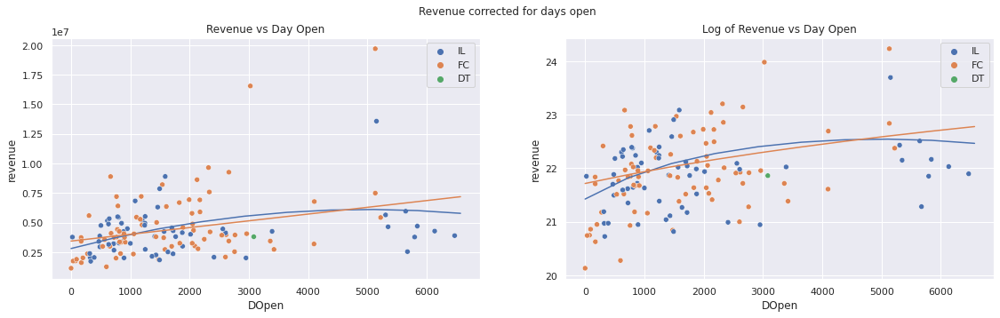

In [34]:
DayRange = np.arange(np.min(df_train['DOpen']),np.max(df_train['DOpen']+500), 365*2)

RevDOpen1 = DOpenInt + (DOpen1[0] * DayRange)
RevDOpen = DOpenInt2 + (DOpen2[0] * DayRange) + (DOpen2[1] * np.power(DayRange,2))

fig, ax = plt.subplots(1, 2, figsize=(19,5))
g1 = sns.scatterplot(data=df_train,x="DOpen",y="revenue", hue="Type", ax = ax[0]).set(title = 'Revenue vs Day Open')
g1 = sns.lineplot(x=DayRange, y=RevDOpen, ax = ax[0]);
g1 = sns.lineplot(x=DayRange, y=RevDOpen1, ax = ax[0]);
g2 = sns.scatterplot(x = df_train["DOpen"],y = np.log2(df_train["revenue"]), hue=df_train["Type"], ax = ax[1]).set(title = 'Log of Revenue vs Day Open')
g2 = sns.lineplot(x=DayRange, y=np.log2(RevDOpen), ax = ax[1]);
g2 = sns.lineplot(x=DayRange, y=np.log2(RevDOpen1), ax = ax[1]);
plt.suptitle('Revenue corrected for days open');

Revenue increase with time makes sense as underperforming restaurants would likely be closed and well managed restaurants would remain.  The contest intent was to use the Demographic, Real estate and Commercial data to estimate revenue.   I have tested dropping DOpen but this appears to reduce the overall performance when doing a submission to the Kaggle contest. An additional target of removing this time dependance was also created.

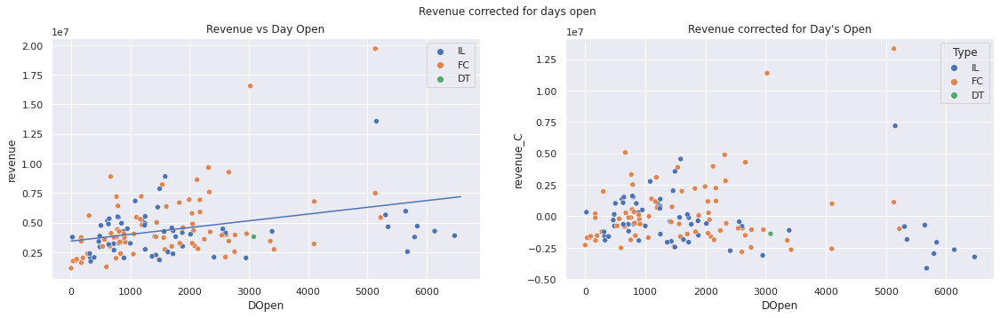

In [35]:
df_train['revenue_C'] = df_train['revenue'] -( DOpenInt + (DOpen1[0] * df_train['DOpen']))

fig, ax = plt.subplots(1, 2, figsize=(19,5))
g1 = sns.scatterplot(data=df_train,x="DOpen",y="revenue", hue="Type", ax = ax[0]).set(title = 'Revenue vs Day Open')
g1 = sns.lineplot(x=DayRange, y=RevDOpen1, ax = ax[0]);
g2 = sns.scatterplot(x = df_train["DOpen"],y = df_train["revenue_C"], hue=df_train["Type"], ax = ax[1]).set(title = 'Revenue corrected for Day\'s Open')
plt.suptitle('Revenue corrected for days open');

The next item is to check the city and add a population estimate, to do this we will first concatenate the training and testing data.  

### merge files using [concat](https://pandas.pydata.org/docs/reference/api/pandas.concat.html)

In [36]:
df_merged = pd.concat([df_test, df_train], axis=0, ignore_index=True).copy()
df_merged.shape

(100137, 46)

### City Analysis

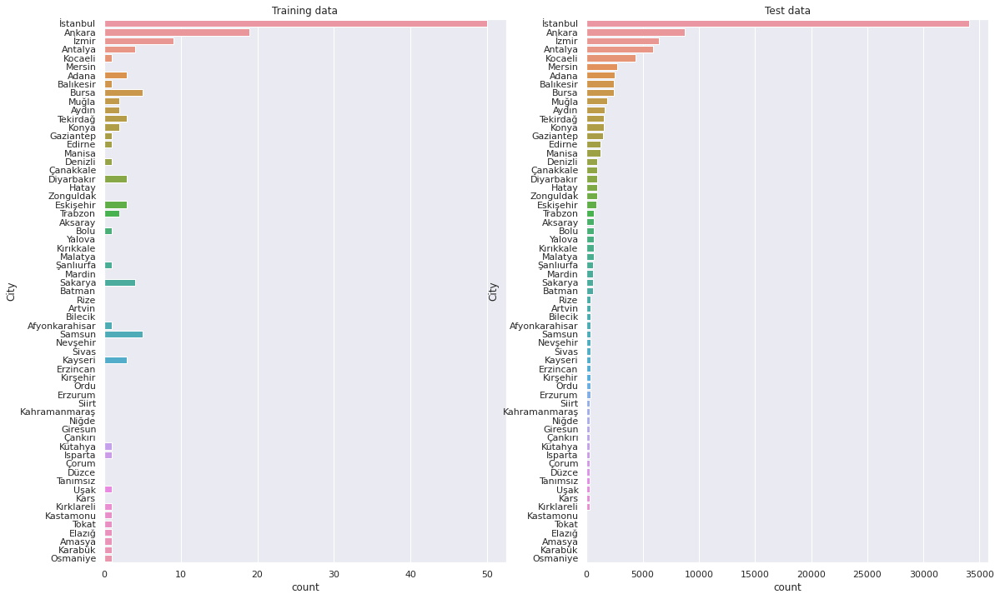

In [37]:
fig, ax = plt.subplots(1,2, figsize=(19, 12))
large_to_small = df_merged.groupby('City').size().sort_values().index[::-1]
g1 = sns.countplot(data = df_train, y = "City", order=large_to_small, ax=ax[0]).set(title='Training data')
g2 = sns.countplot(data = df_test, y = "City",order=large_to_small, ax=ax[1]).set(title='Test data')
fig.show()

In [38]:
print("Unique cities in training set", df_train['City'].nunique(), "and in the test set", df_test['City'].nunique(),'\n')
cities = df_test['City'].unique()
cities

Unique cities in training set 34 and in the test set 57 



array(['Niğde', 'Konya', 'Ankara', 'Kocaeli', 'Afyonkarahisar',
       'Eskişehir', 'Rize', 'İstanbul', 'Trabzon', 'Antalya', 'Muğla',
       'Düzce', 'Adana', 'Bursa', 'Aydın', 'Hatay', 'Denizli', 'İzmir',
       'Gaziantep', 'Samsun', 'Erzurum', 'Edirne', 'Balıkesir', 'Mersin',
       'Zonguldak', 'Malatya', 'Çanakkale', 'Kars', 'Bolu', 'Batman',
       'Bilecik', 'Giresun', 'Tekirdağ', 'Sivas', 'Kırıkkale', 'Mardin',
       'Erzincan', 'Manisa', 'Diyarbakır', 'Kahramanmaraş', 'Yalova',
       'Tanımsız', 'Sakarya', 'Kırşehir', 'Aksaray', 'Kayseri',
       'Nevşehir', 'Çorum', 'Ordu', 'Kırklareli', 'Şanlıurfa', 'Artvin',
       'Uşak', 'Kütahya', 'Siirt', 'Çankırı', 'Isparta'], dtype=object)

Significantly more cities in the test data than the train dataset along with a variation in the sampling of the smaller (other) cities.

Remove the unicode from the City names and replace with standard English.

In [39]:
s = pd.Series(df_merged['City'])

df_merged['CityEN'] = s.str.normalize('NFKD')\
       .str.encode('ascii', errors='ignore')\
       .str.decode('utf-8')

citiesEN = df_merged['CityEN'].unique()

In [40]:
print("The number of cities in the merged file ",df_merged['CityEN'].nunique())

The number of cities in the merged file  63


The final number of cites would indicate some of the smaller cities only exist in the training data. Next item is to import csv with Turkey city population source worldpopulationreview.com

In [41]:
filename = filepath + '/CityPopulation.csv'
print(filename)
df_city = pd.read_csv(filename)
df_city.head()

/content/drive/MyDrive/CDS_Course/project/CityPopulation.csv


,City,Population
0,Istanbul,14804116
1,Ankara,3517182
2,Izmir,2500603
3,Bursa,1412701
4,Adana,1248988


In [42]:
cityD = pd.Series(df_city.Population.values,index=df_city.City).to_dict()

Populate a column with the city populations

In [43]:
df_merged['City_Pop'] = df_merged['CityEN'].map(cityD) 
df_merged['City_Pop'][df_merged['City_Pop'] == 0] = np.nan
print("The number of cities that we don't have population",df_merged['City_Pop'].isna().sum().sum())

The number of cities that we don't have population 13708


To estimate population to the missing cities, check if the number of restaurant in a city can be used as an estimater.

In [44]:
resCount = df_merged.groupby(['CityEN'])['CityEN'].count()
resC = pd.Series(resCount).to_dict()
df_merged['resC'] = df_merged['CityEN'].map(resC) 

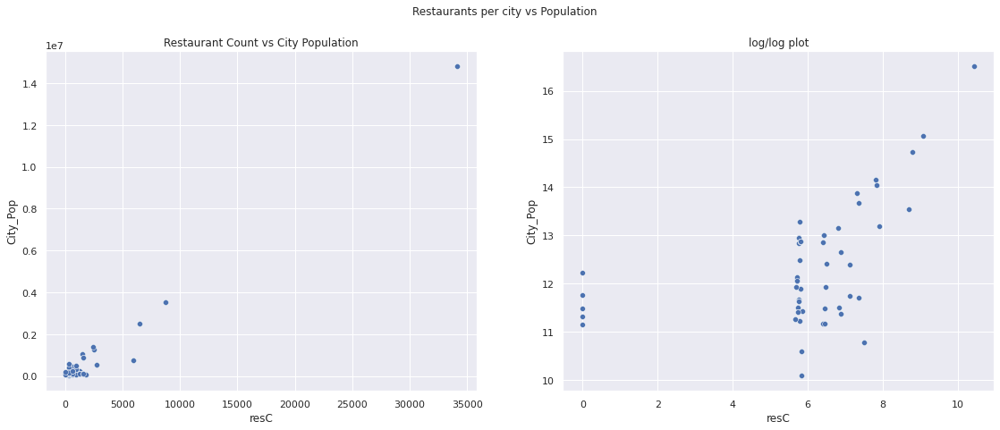

In [45]:
fig, ax = plt.subplots(1,2, figsize=(19, 7))
g1 = sns.scatterplot((df_merged["resC"]),(df_merged["City_Pop"]),ax=ax[0]).set(title='Restaurant Count vs City Population')
g2 = sns.scatterplot(np.log(df_merged["resC"]),np.log(df_merged["City_Pop"]),ax=ax[1]).set(title='log/log plot')
plt.suptitle('Restaurants per city vs Population');

Determine the relationship between number of restaurants and city size. Assume the best estimate is for zero restaurant to equate to zero population.

In [46]:
model_lr_rP = LinearRegression(fit_intercept=False)

# need to remove nan
df = pd.DataFrame({"X":df_merged['resC'],"Y":df_merged['City_Pop']})
df.dropna(inplace=True)

X = df.X.to_numpy()
X = X.reshape(-1,1)
Y = df.Y.to_numpy()
Y = Y.reshape(-1,1)

model_lr_rP.fit(X, Y)
rPSlope = model_lr_rP.coef_
print(model_lr_rP.intercept_,model_lr_rP.coef_)

0.0 [[431.15994563]]


This analysis indicate 431 individuals per restraunt. This number appears high if this analysis represents a single restaurant franchies but must include different restaurant styles (chinese, mcDonalds, etc).

In [47]:
from numpy.ma.core import arange
resL = arange(1,np.nanmax(df_merged['resC']),np.nanmax(df_merged['resC'])/50)
popL = resL * 431

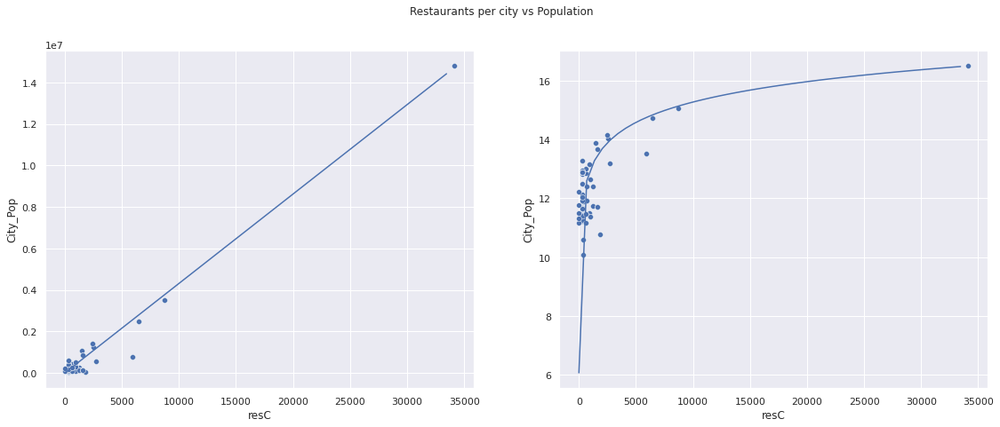

In [48]:
fig, ax = plt.subplots(1,2, figsize=(19, 7))
g1 = sns.scatterplot((df_merged["resC"]),(df_merged["City_Pop"]),ax=ax[0])
g1 = sns.lineplot((resL),(popL), ax= ax[0])
g2 = sns.scatterplot((df_merged["resC"]),np.log(df_merged["City_Pop"]),ax=ax[1])
g2 = sns.lineplot((resL),np.log(popL), ax = ax[1])
plt.suptitle('Restaurants per city vs Population');

Add an estimated population to each city that presently is nan

In [49]:
df_merged['City_Pop'] = df_merged['City_Pop'].fillna(df_merged['resC']*431)
print("The number of cities that now don't have a population estimate is",df_merged['City_Pop'].isna().sum().sum())

The number of cities that now don't have a population estimate is 0


As the restaurant and population are highly byses to Istanbul create the log of the city population to hope to create a better distribution.

In [50]:
df_merged['City_Pop_log'] = np.log(df_merged['City_Pop'])

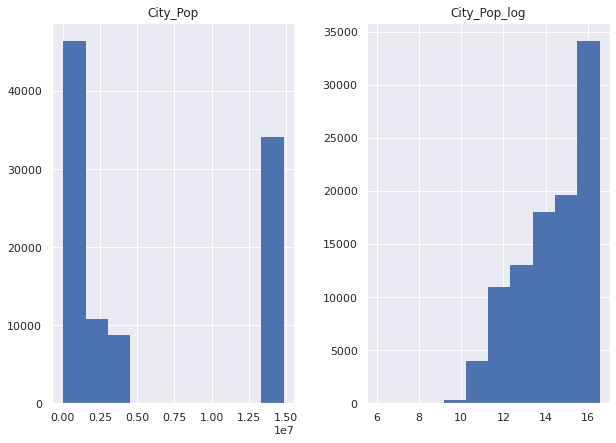

In [51]:
fplot = ['City_Pop','City_Pop_log']
df_merged[fplot].hist(figsize=(10,7),edgecolor='b');

City population bysed by the high proportion of restaurant in Istanbul 

### Ps column analysis

Using the merged data and split by restaurant type

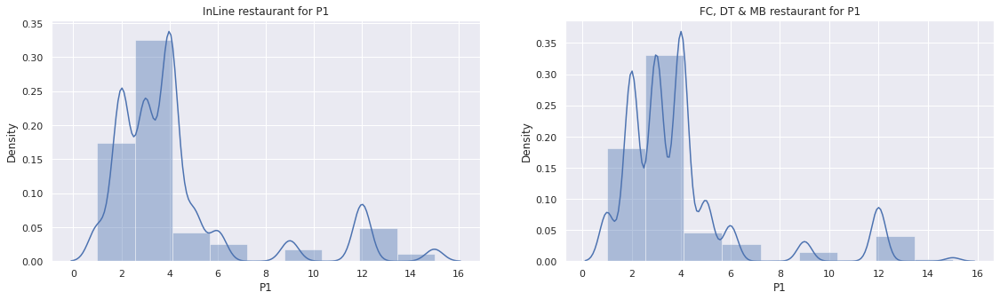

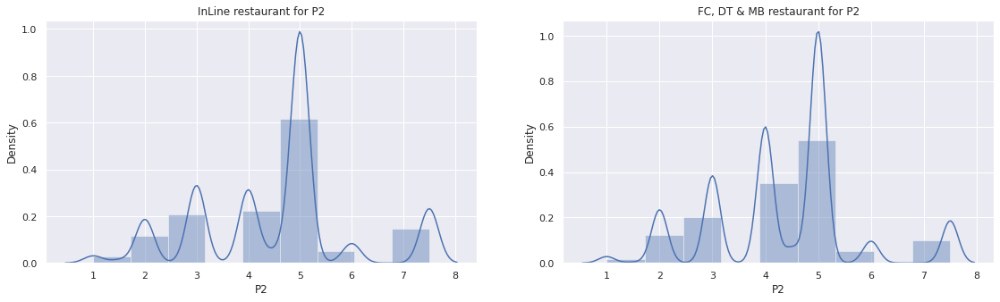

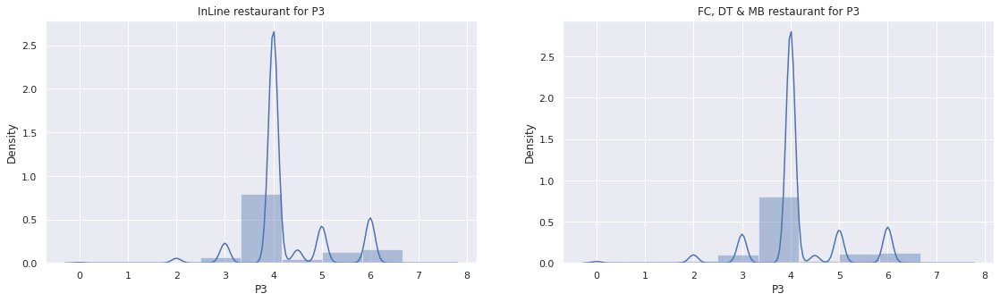

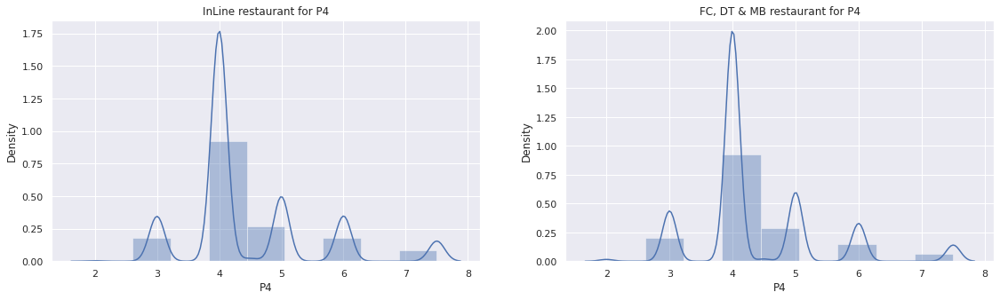

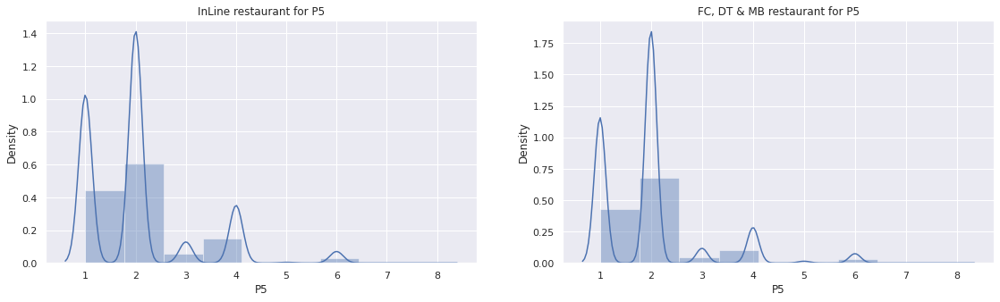

...

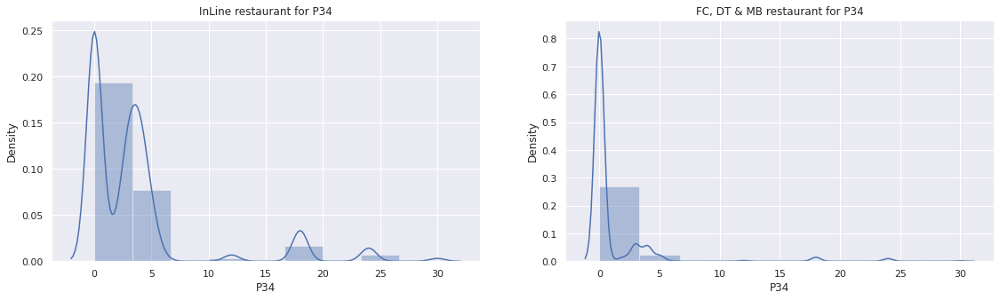

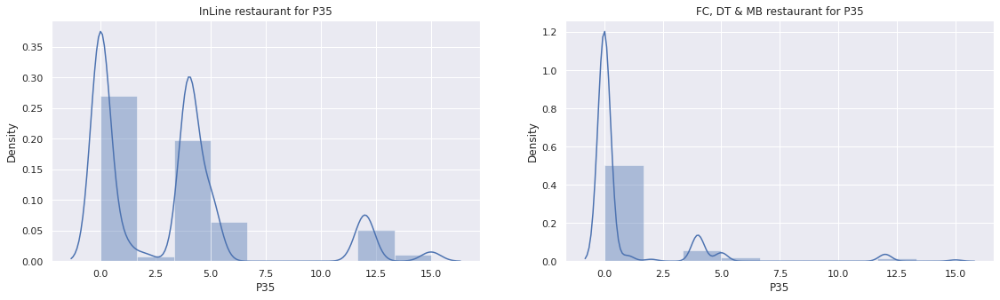

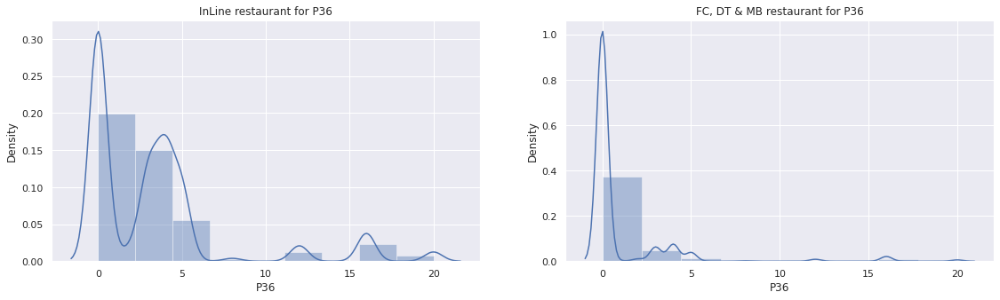

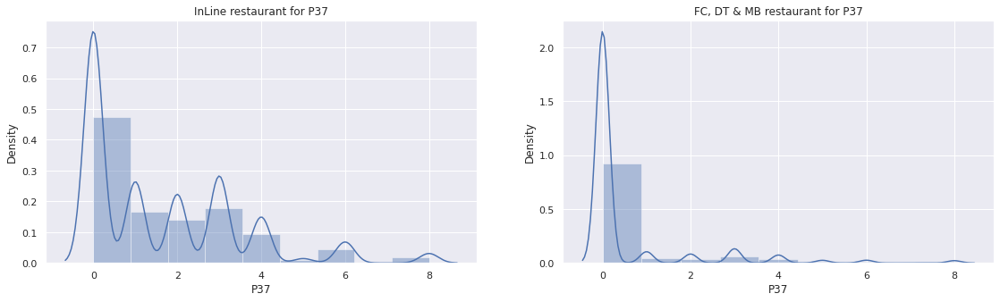

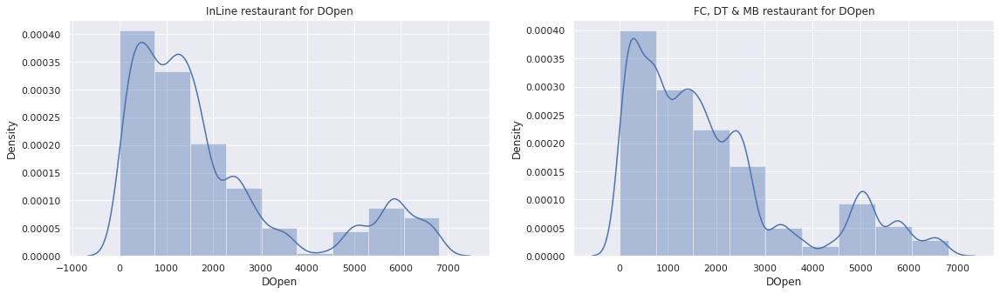

In [52]:
for i in cols_num:
    fig, ax = plt.subplots(1,2, figsize=(19, 5))
    g1 = sns.distplot(df_merged[i][df_merged['Type'] == 'IL'], ax=ax[0], bins = 9).set(title='InLine restaurant for ' + i)
    g2 = sns.distplot(df_merged[i][df_merged['Type'] != 'IL'], ax=ax[1], bins = 9).set(title='FC, DT & MB restaurant for ' + i)
    fig.show();

Ps are common between IL and the others for P1-12, P18-22, P28-29 & P37 but different for P13-17, P23-P27 & P30-36. Likewise P1, P5-6, P14-18, P21-28 and P30-37 all look right-hand skewed and might benifit by log normalization.

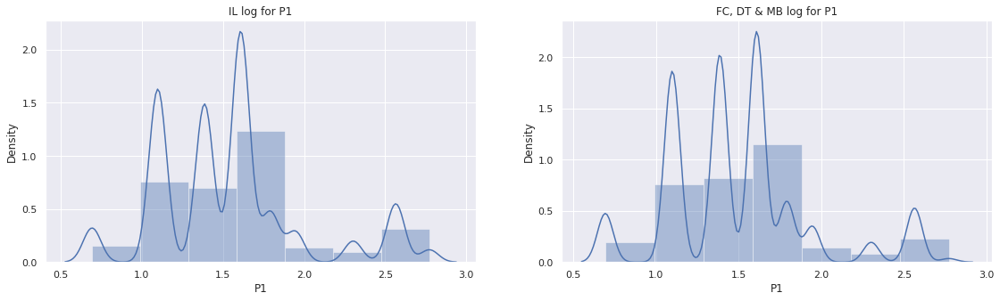

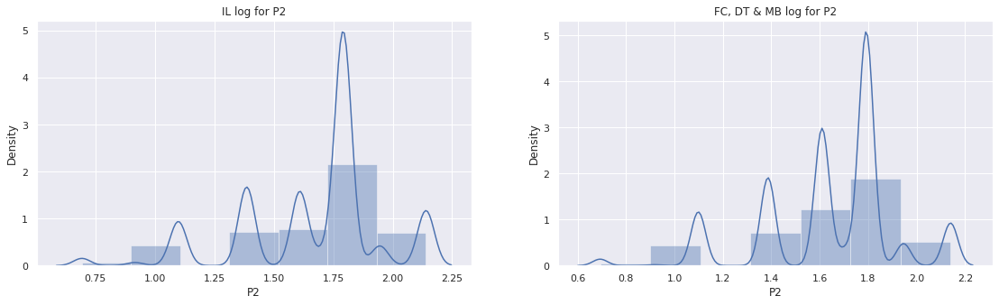

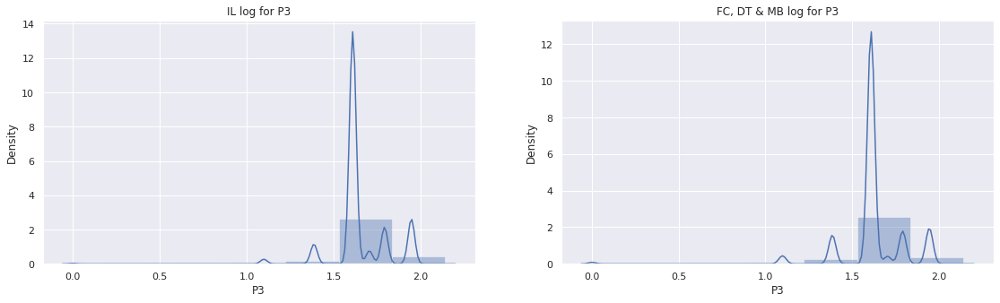

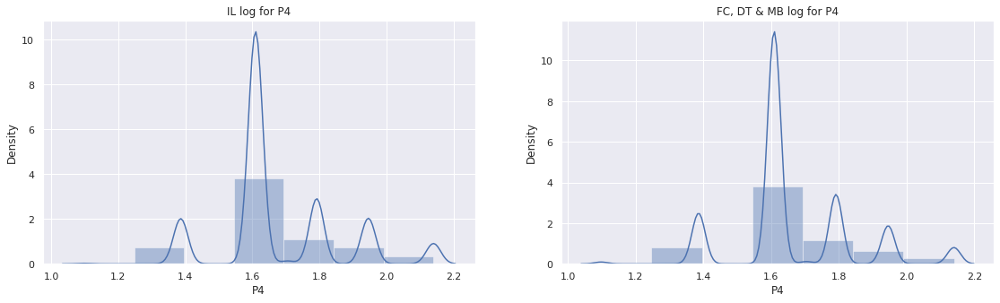

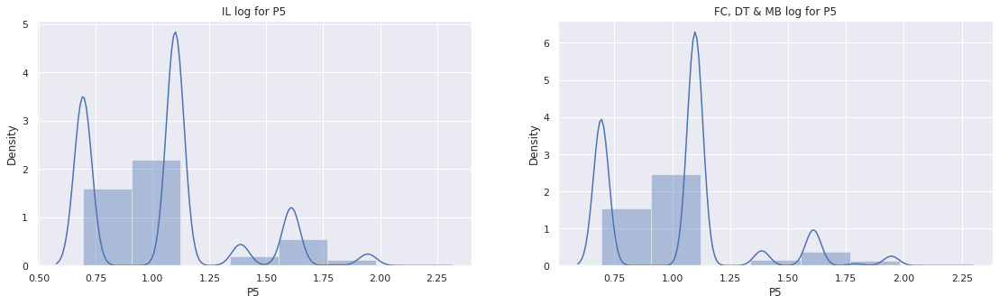

...

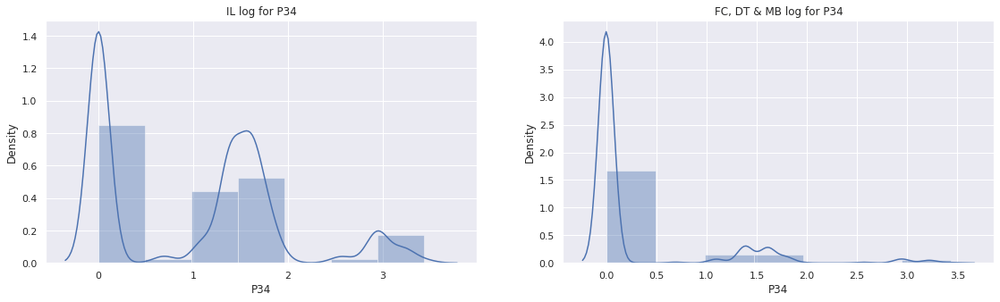

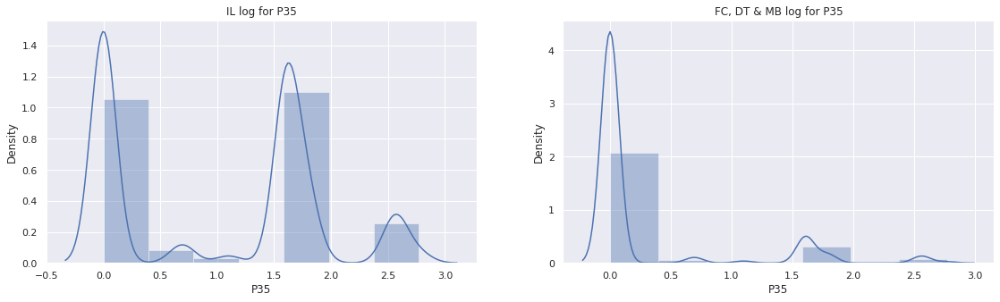

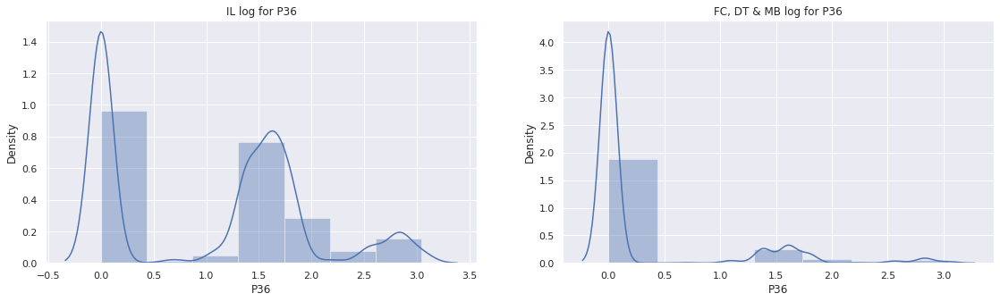

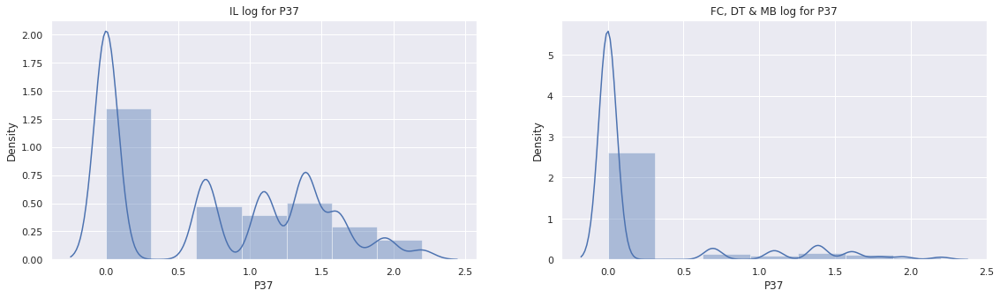

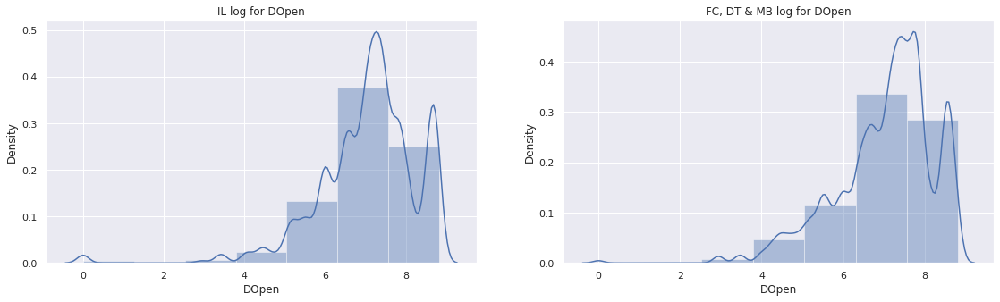

In [53]:
for i in cols_num:
    fig, ax = plt.subplots(1,2, figsize=(19, 5))
    g1 = sns.distplot(np.log(df_merged[i][df_merged['Type'] == 'IL'] + 1), ax=ax[0], bins = 7).set(title='IL log for ' + i)
    g2 = sns.distplot(np.log(df_merged[i][df_merged['Type'] != 'IL'] + 1), ax=ax[1], bins = 7).set(title='FC, DT & MB log for ' + i)
    fig.show();

The zero still look like nan values instead of real values.

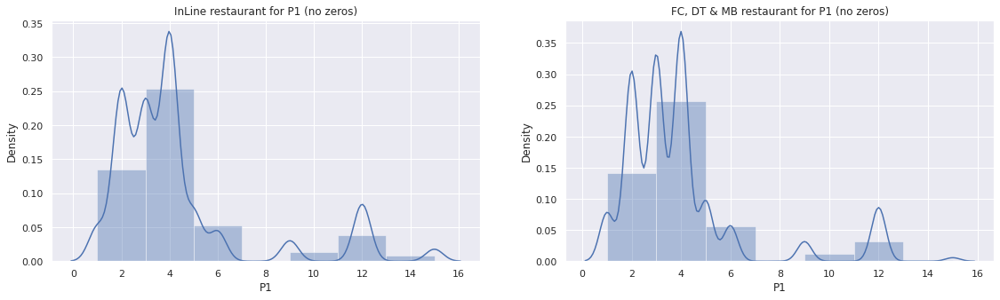

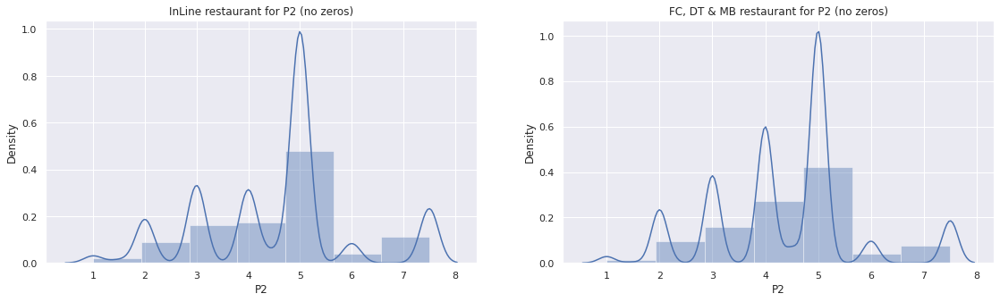

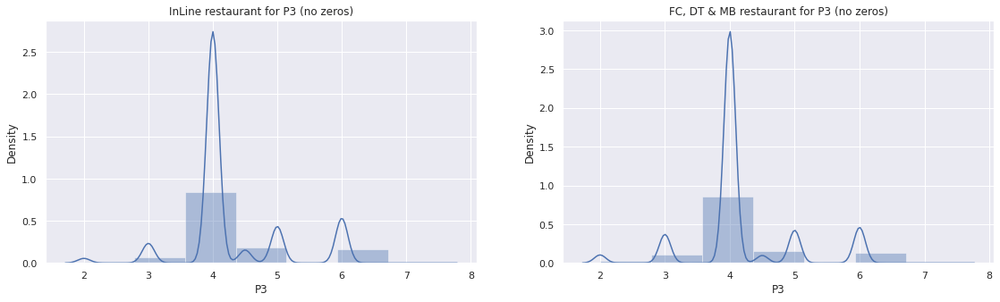

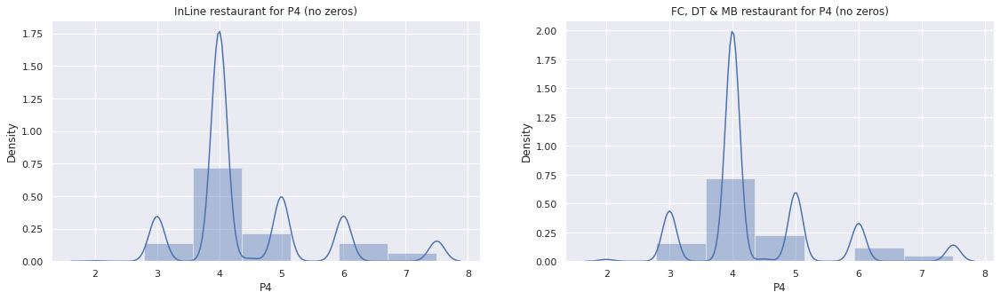

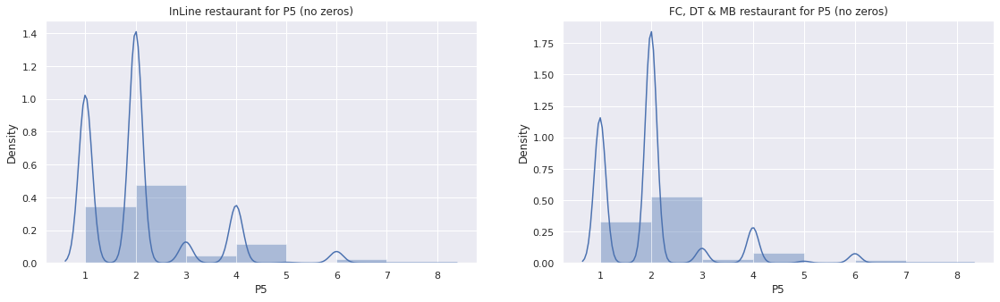

...

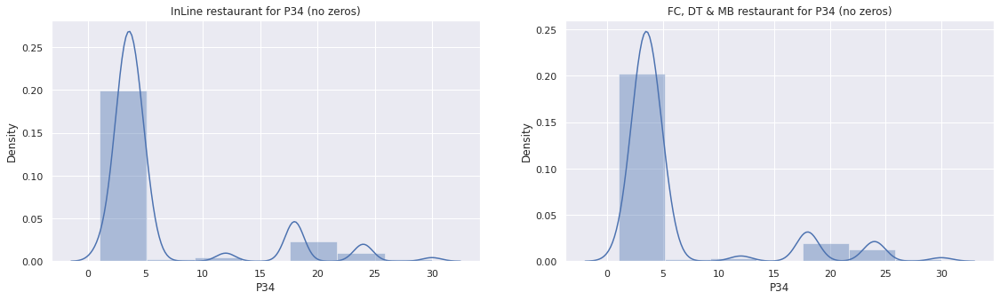

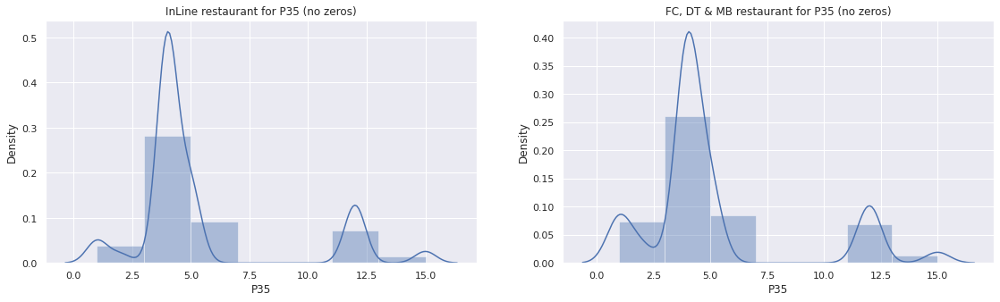

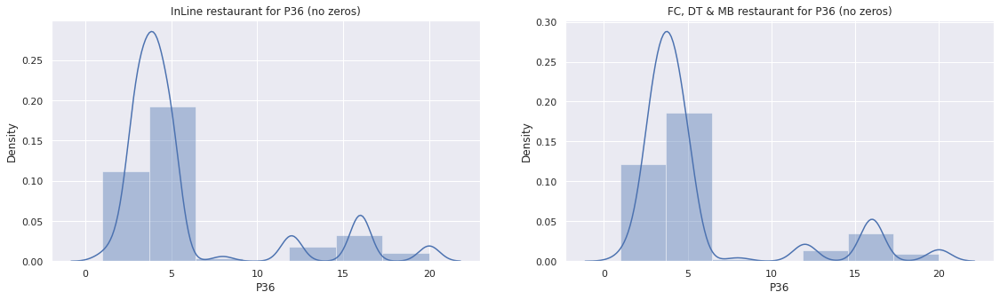

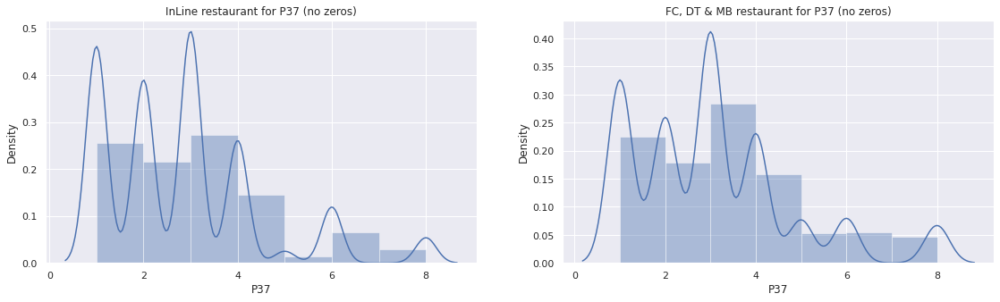

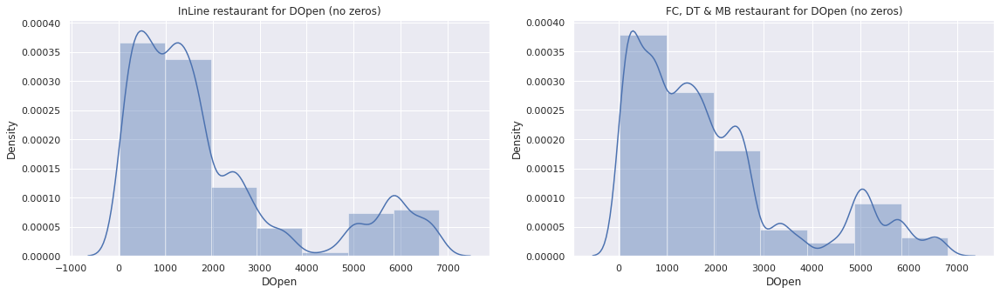

In [54]:
for i in cols_num:
    fig, ax = plt.subplots(1,2, figsize=(19, 5))
    g1 = sns.distplot(df_merged[i][(df_merged['Type'] == 'IL') & (df_merged[i] != 0)], ax=ax[0], bins = 7).set(title='InLine restaurant for ' + i + ' (no zeros)')
    g2 = sns.distplot(df_merged[i][(df_merged['Type'] != 'IL') & (df_merged[i] != 0)], ax=ax[1], bins = 7).set(title='FC, DT & MB restaurant for ' + i + ' (no zeros)')
    fig.show()

Run the evaluation routine giving in class with the addition of KDE overlay, and add the ability to drop a value that represents nan's)

In [55]:
def hist_box(data, feature, figsize=(12, 7), drop = -99999):

    # Subplot canvas
    fig, (ax_box, ax_hist) = plt.subplots(nrows = 2, sharex = True, gridspec_kw = {"height_ratios": (0.25, 0.75)}, figsize = figsize)

    # Boxplot on top
    sns.boxplot(data = data[data[feature] != drop], x = feature, ax = ax_box, showmeans = True, color = "pink")  # boxplot will be created and a star will indicate the mean value of the column
    
    # Histogram on bottom
    sns.histplot(data = data[data[feature] != drop], x = feature, ax = ax_hist, kde = True) # histogram will be created and

    # Add mean and median to histogram
    ax_hist.axvline(data[feature][data[feature] != drop].mean(), color = "green") # mean
    ax_hist.axvline(data[feature][data[feature] != drop].median(), color = "orange") # median

    # Title
    fig.suptitle("Distribution of " + feature, fontsize=16)

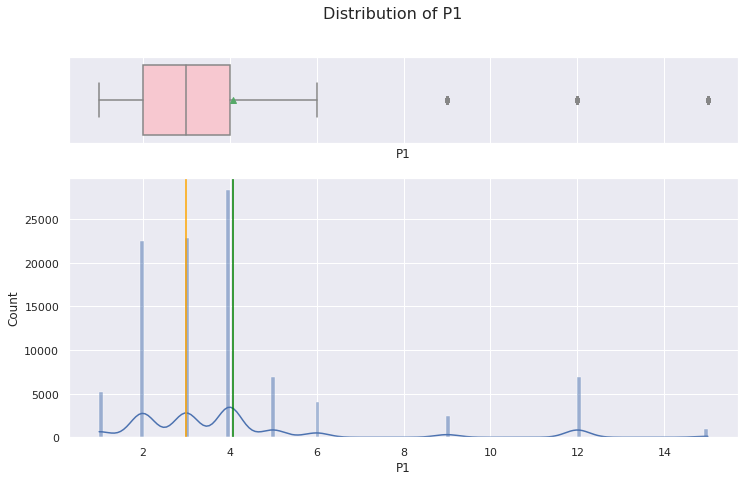

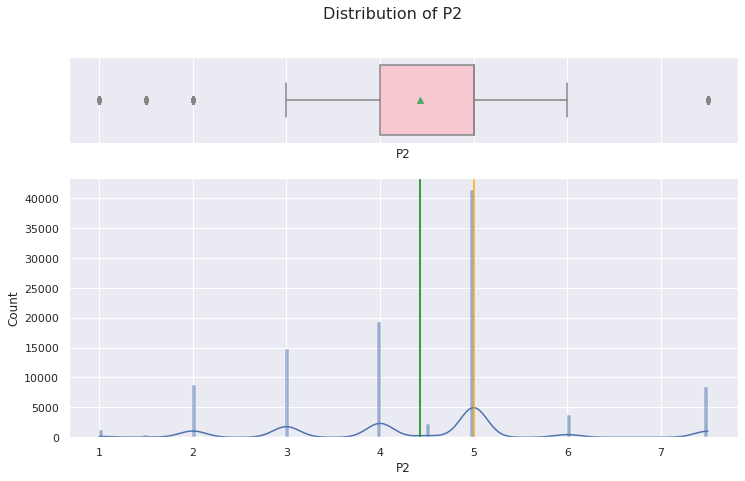

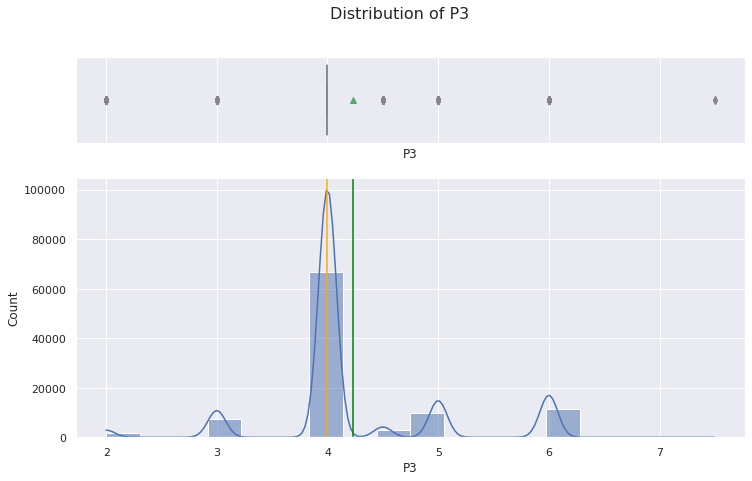

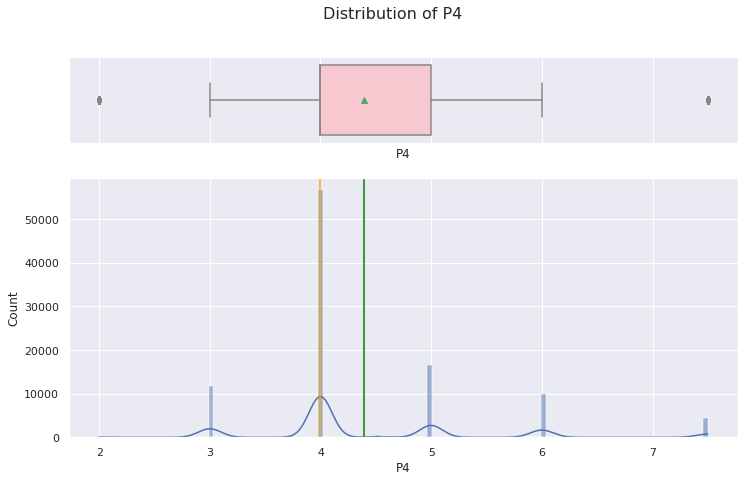

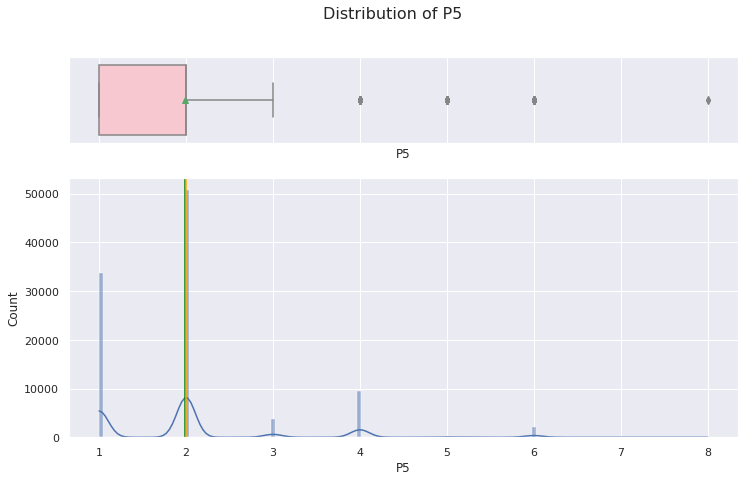

...

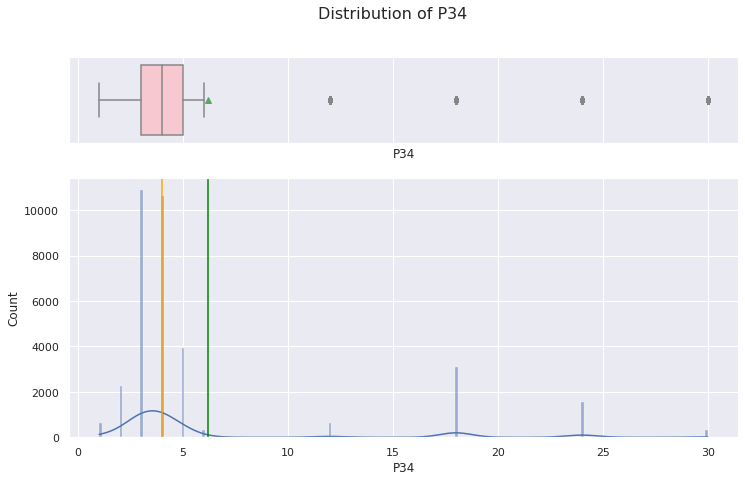

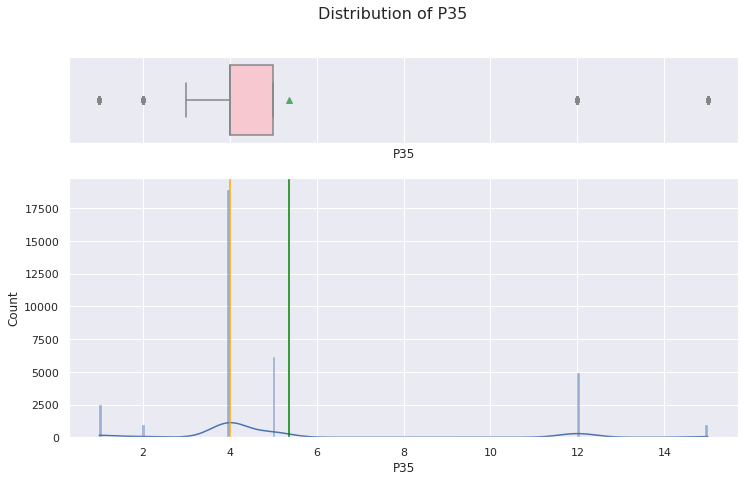

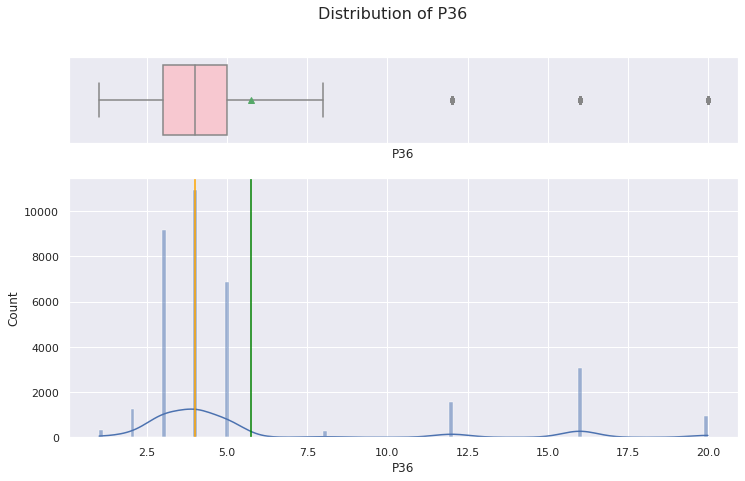

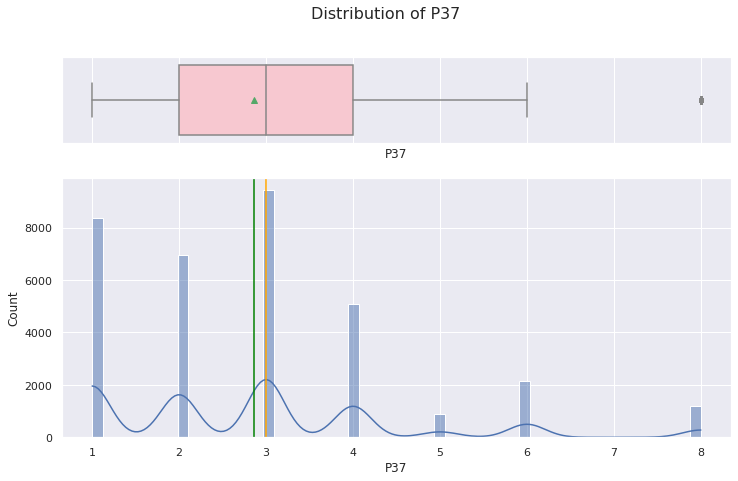

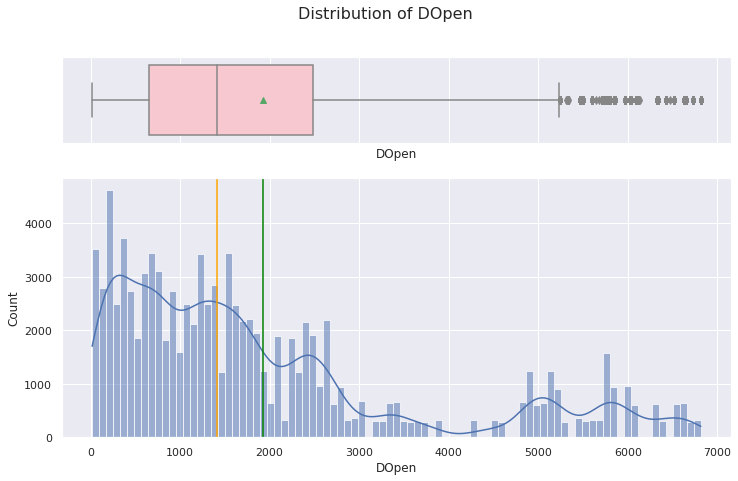

In [56]:
from IPython.core.pylabtools import figsize
for i in cols_num:
  hist_box(df_merged,i, drop = 0)

Conclussion is zero needs to be dropped and log normalization is unlikely to significantly aid the regression analysis.

# Z-scaling

The zero Ps (P14-P18, P24-P27 and P30-37) but only appear to be important for the IL restaurants.   

In [57]:
for i in PsZeros:
  df_merged[i][df_merged[i] == 0] = np.nan

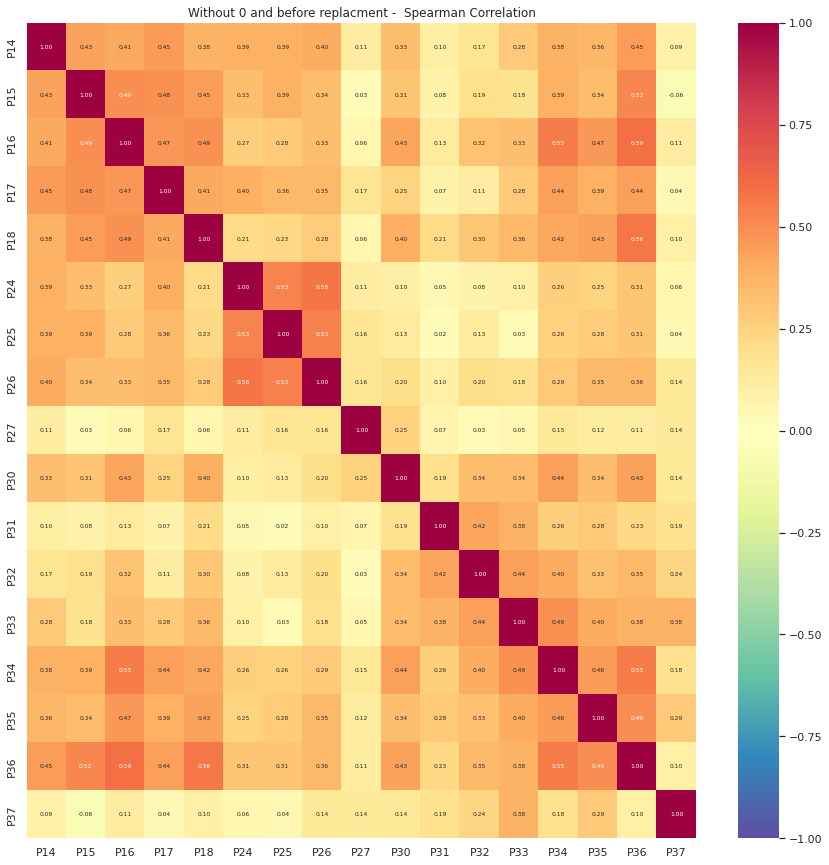

In [58]:
plt.figure(figsize=(15,15))
sns.heatmap(data = df_merged[PsZeros][df_merged["Type"] == "IL"].corr(method = "spearman"), vmin = -1, vmax = 1, 
            annot = True, cmap ='Spectral_r', annot_kws={"size":6},fmt = ".2f").set(title='Without 0 and before replacment -  Spearman Correlation');

The Ps column with zero appears not to be co-related.

In [59]:
z_mean = df_merged[PsZeros][df_merged['Type'] == 'IL'].mean()
z_mean

P14    3.798133
P15    3.840323
P16    5.200834
P17    3.404802
P18    5.036327
P24    3.604858
P25    3.579174
P26    3.734913
P27    3.381076
P30    6.194776
P31    3.569678
P32    5.766413
P33    2.900051
P34    6.194480
P35    5.451445
P36    5.779656
P37    2.791606
dtype: float64

Scale the Ps column

In [60]:
from sklearn.preprocessing import StandardScaler
# Z-score
scalerZ = StandardScaler()
cols_num.append('City_Pop_log')
df_merged[cols_num] = scalerZ.fit_transform(df_merged[cols_num])

After scaling replace the nan's with 0

In [61]:
df_merged[PsZeros] = df_merged[PsZeros].fillna(0)

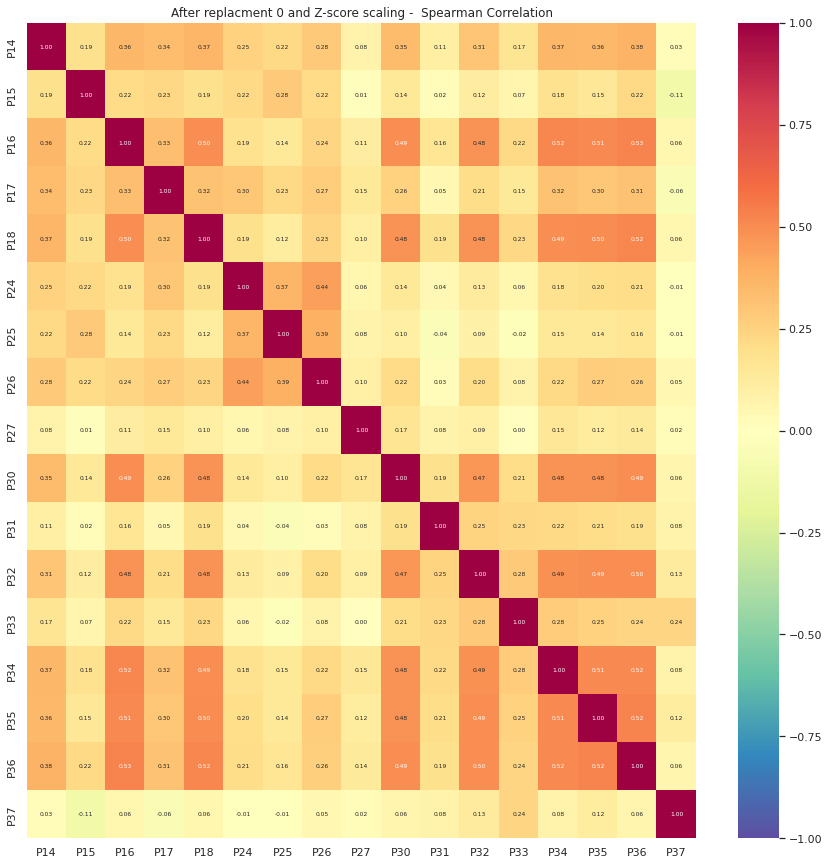

In [62]:
plt.figure(figsize=(15,15))
sns.heatmap(data = df_merged[PsZeros][df_merged["Type"] == "IL"].corr(method = "spearman"), vmin = -1, vmax = 1, 
            annot = True, cmap ='Spectral_r', annot_kws={"size":6},fmt = ".2f").set(title='After replacment 0 and Z-score scaling -  Spearman Correlation');

After scaling the independence of the column appear to be compromised but this is likely the results of replacing the nan's with 0.  

In [63]:
df_merged.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,100137.0,4.993119e+04,2.890688e+04,0.000000e+00,2.489700e+04,4.993100e+04,7.496500e+04,9.999900e+04
P1,100137.0,6.506763e-17,1.000005e+00,-1.097708e+00,-7.422244e-01,-3.867409e-01,-3.125749e-02,3.879060e+00
P2,100137.0,1.915841e-16,1.000005e+00,-2.398969e+00,-2.995571e-01,4.002469e-01,4.002469e-01,2.149757e+00
P3,100137.0,7.840755e-17,1.000005e+00,-5.003827e+00,-2.557603e-01,-2.557603e-01,-2.557603e-01,3.898798e+00
P4,100137.0,2.860989e-16,1.000005e+00,-2.313201e+00,-3.823093e-01,-3.823093e-01,5.831365e-01,2.996751e+00
P5,100137.0,-7.862043e-17,1.000005e+00,-9.287684e-01,-9.287684e-01,9.747209e-03,9.747209e-03,5.640841e+00
P6,100137.0,5.279205e-17,1.000005e+00,-1.228423e+00,-5.758917e-01,-5.758917e-01,7.291701e-01,4.644355e+00
P7,100137.0,-9.494055e-17,1.000005e+00,-1.973940e+00,-1.380062e-01,-1.380062e-01,-1.380062e-01,2.156911e+00
P8,100137.0,1.941740e-16,1.000005e+00,-2.287383e+00,-5.418684e-01,3.996990e-02,3.996990e-02,2.949161e+00
P9,100137.0,1.870251e-16,1.000005e+00,-7.350439e-01,-7.350439e-01,-1.477817e-01,-1.477817e-01,2.788529e+00


Ps Column after Z-score scaling

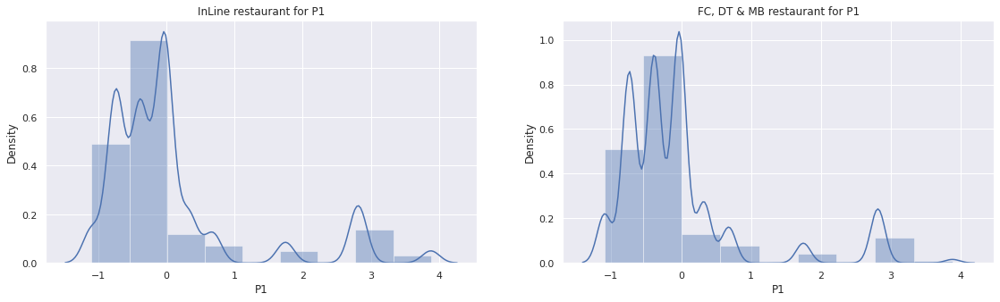

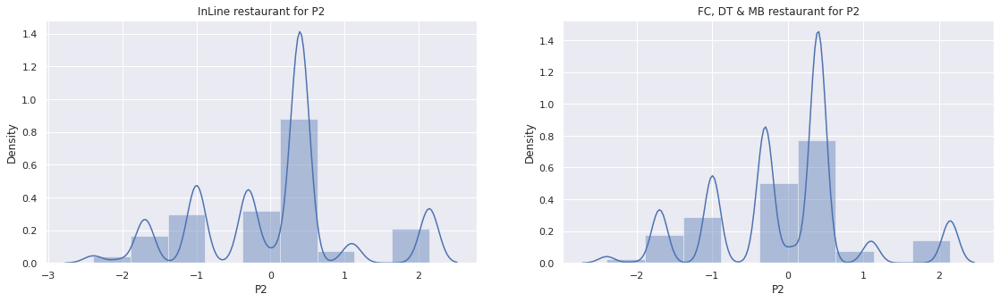

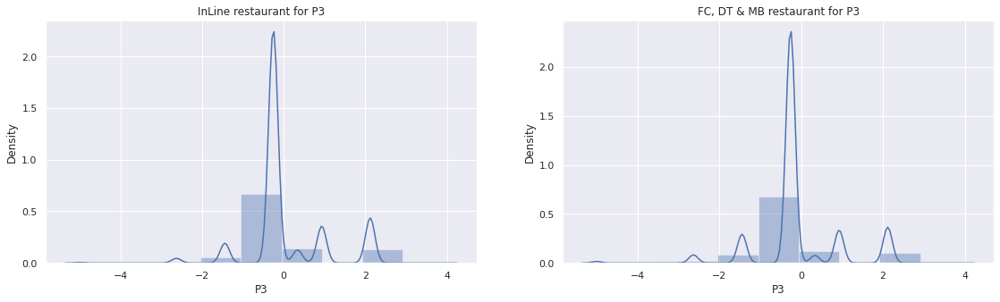

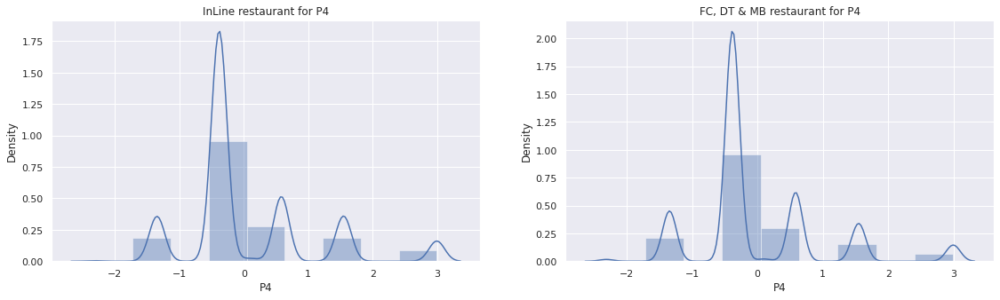

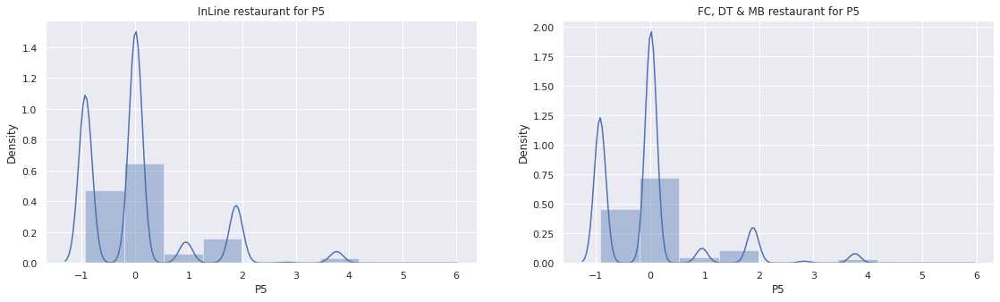

...

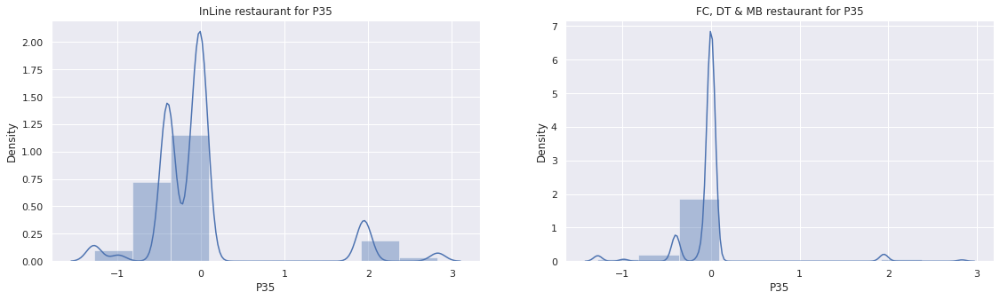

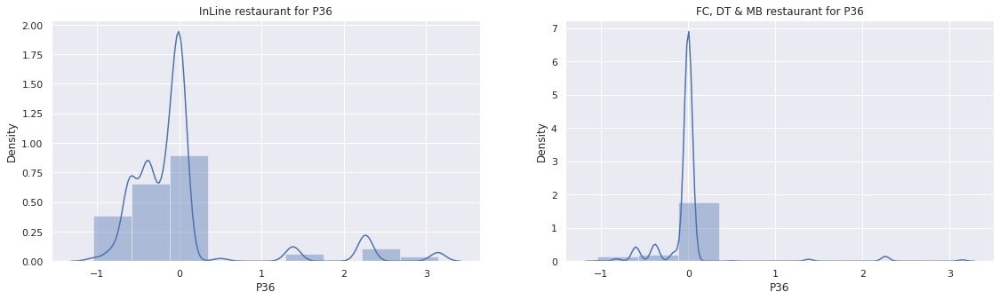

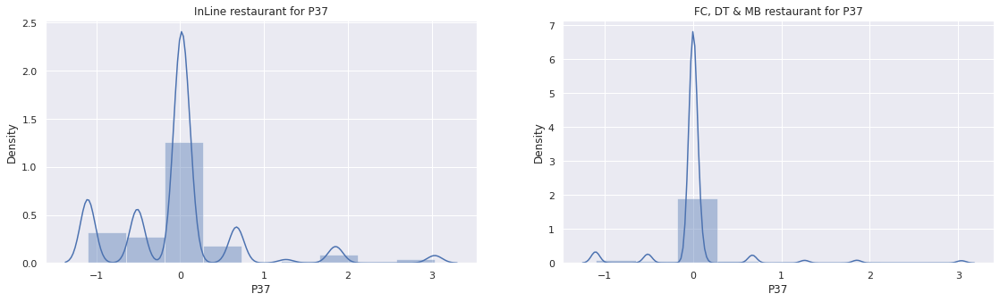

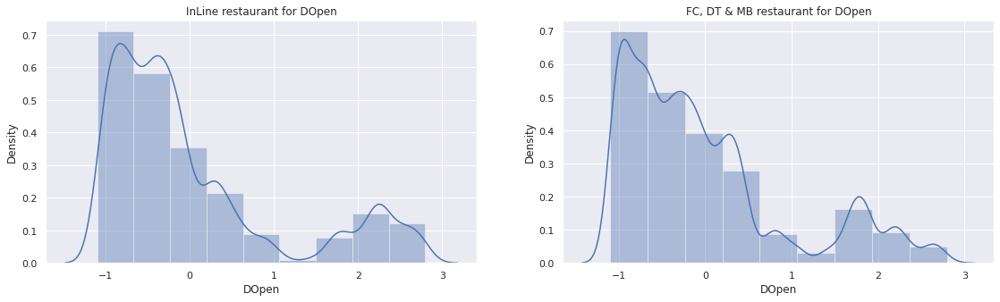

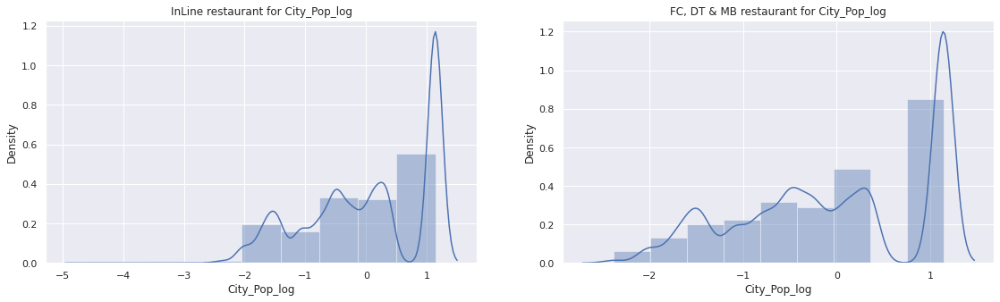

In [64]:
for i in cols_num:
    fig, ax = plt.subplots(1,2, figsize=(19, 5))
    g1 = sns.distplot(df_merged[i][df_merged['Type'] == 'IL'], ax=ax[0], bins = 9).set(title='InLine restaurant for ' + i)
    g2 = sns.distplot(df_merged[i][df_merged['Type'] != 'IL'], ax=ax[1], bins = 9).set(title='FC, DT & MB restaurant for ' + i)
    fig.show()

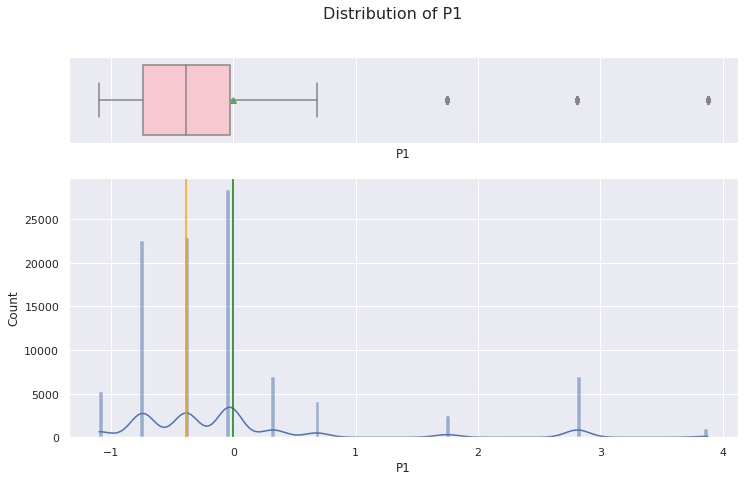

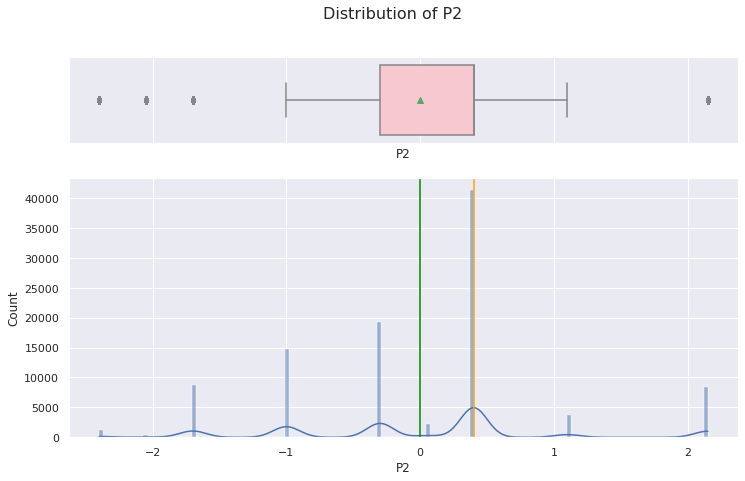

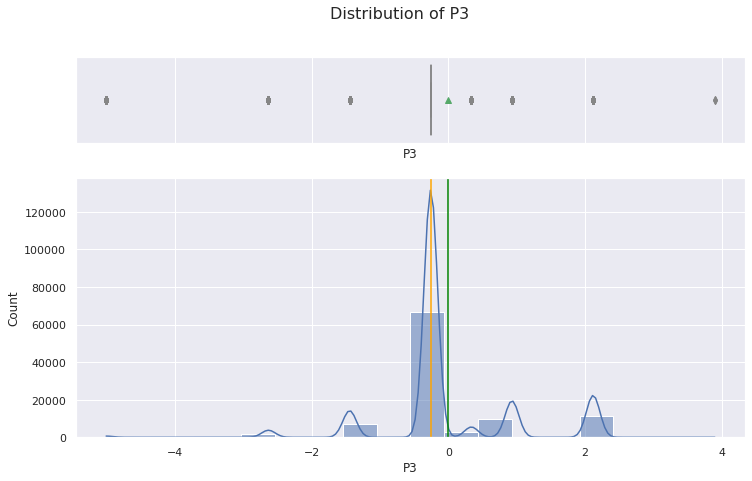

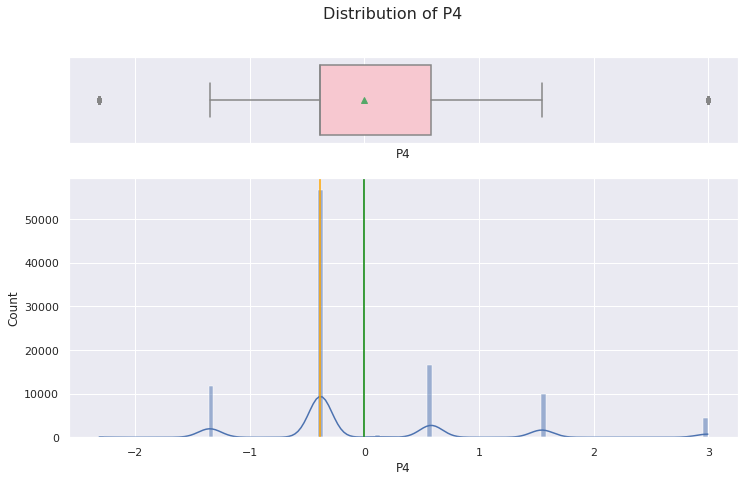

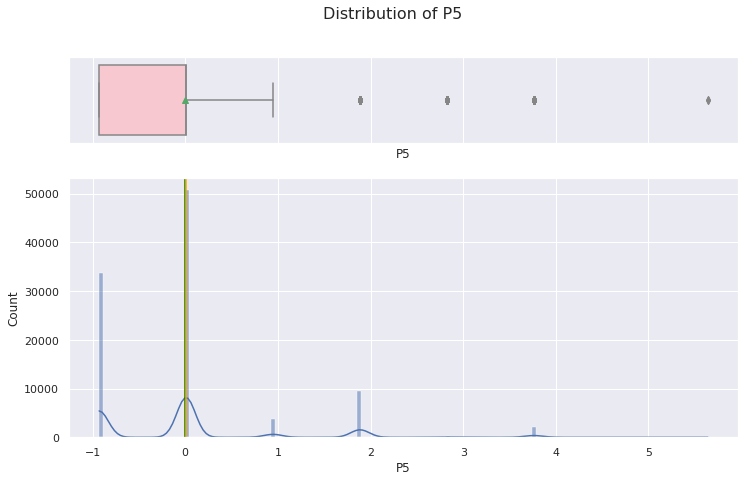

...

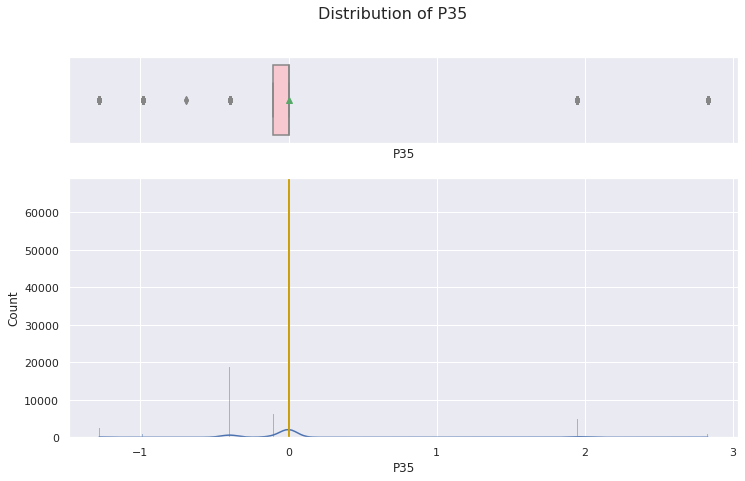

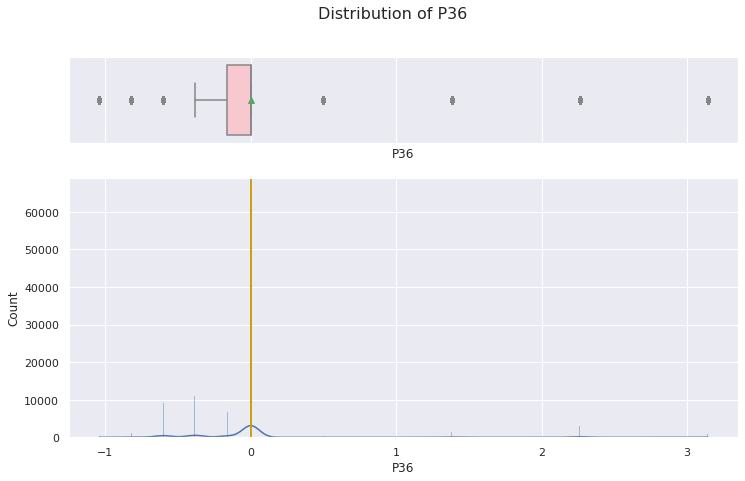

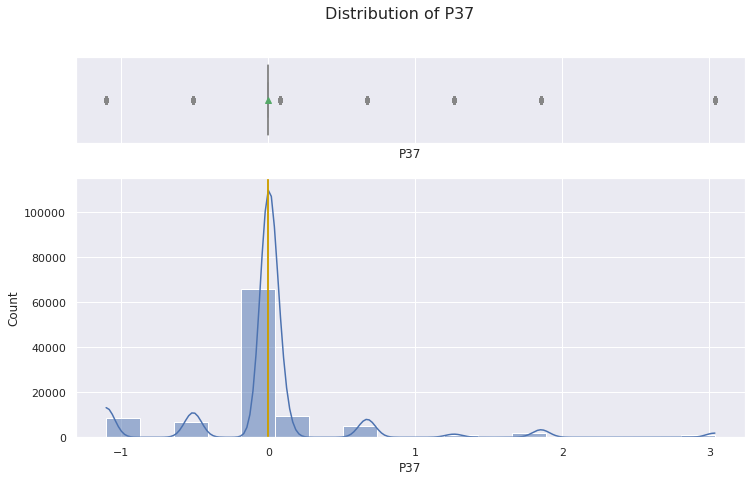

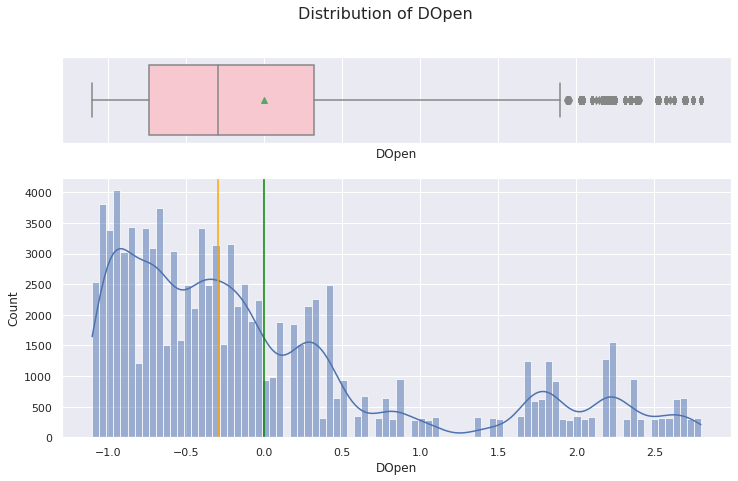

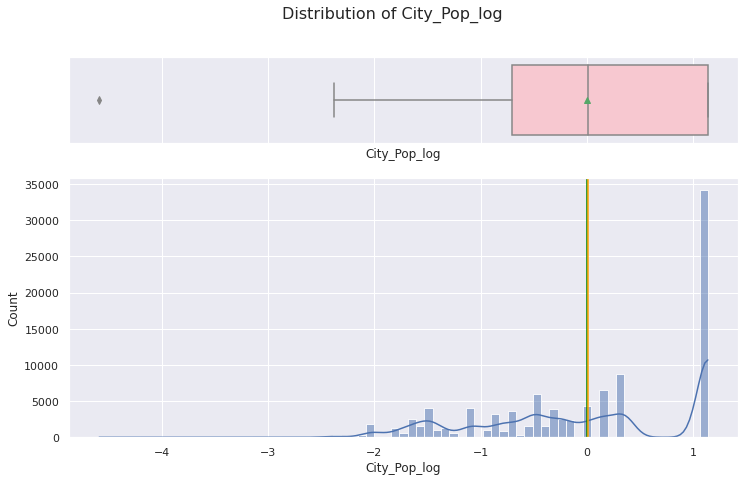

In [65]:
for i in cols_num:
  hist_box(df_merged,i)

## Pearson & Spearmen relationships

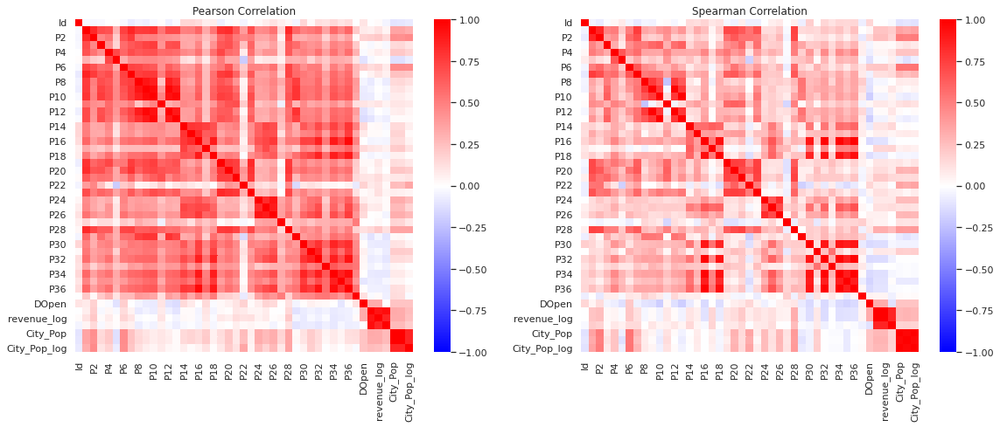

In [66]:
fig, ax = plt.subplots(1,2, figsize=(19, 7))
g1 = sns.heatmap(data = df_merged[df_merged['revenue'].notna()].corr(method = "pearson"), vmin = -1, vmax = 1, annot = False, cmap ='bwr', ax=ax[0]).set(title='Pearson Correlation');
g2 = sns.heatmap(data = df_merged[df_merged['revenue'].notna()].corr(method = "spearman"), vmin = -1, vmax = 1, annot = False, cmap ='bwr', ax=ax[1]).set(title='Spearman Correlation');
fig.show()

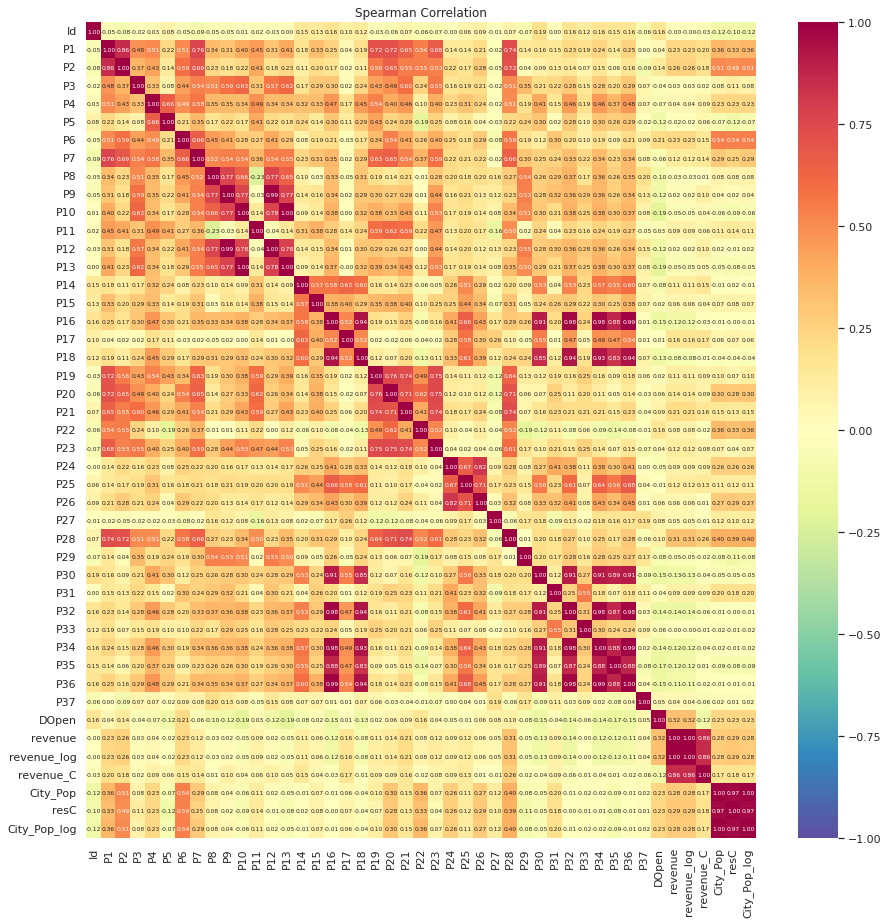

In [67]:
plt.figure(figsize=(15,15))
sns.heatmap(data = df_merged[df_merged['revenue'].notna()].corr(method = "spearman"), vmin = -1, vmax = 1, 
            annot = True, cmap ='Spectral_r', annot_kws={"size":6},fmt = ".2f").set(title='Spearman Correlation');

The Ps attributes have a degree of intra-dependents (P9 with P12, P10 with P13) but while P16, P18, P32, P34 appear to match with P36 these are all fields with significant zeros. Before doing additional analysis create categorical data from object columns.

In [68]:
df_merged['P9-12'] = (df_merged['P9'] + df_merged['P12'])/2
df_merged['P10-13'] = (df_merged['P10'] + df_merged['P13'])/2
df_merged.drop(columns=['P9','P10','P12','P13','City_Pop','resC'],inplace=True)

In [69]:
cols_cat

['City', 'City Group', 'Type']

In [70]:
df_merged['Group_cat'] = 0
df_merged['Group_cat'][df_merged['City Group'] == "Big Cities"] = 1
df_merged['Group_cat'] = df_merged['Group_cat'].astype("int64")
df_merged['Type_cat'] = 0
df_merged['Type_cat'][df_merged['Type'] == "IL"] = 1
df_merged['Type_cat'] = df_merged['Type_cat'].astype("int64")

Alternative is [OneHotEncoding](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OneHotEncoder.html) or [LabelEncoder](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.LabelEncoder.html)

In [71]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder

# integer encode
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(df_merged['City Group'])
print(integer_encoded)

# integer encode
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(df_merged['Type'])
print(integer_encoded)

[1 1 0 ... 1 0 0]
[1 2 1 ... 1 1 1]


Create features for analysis

In [72]:
features = list(df_merged.drop(columns = ["Id","revenue","revenue_log","revenue_C"]).select_dtypes(include = ["int64", "float64"]))
features

['P1',
 'P2',
 'P3',
 'P4',
 'P5',
 'P6',
 'P7',
 'P8',
 'P11',
 'P14',
 'P15',
 'P16',
 'P17',
 'P18',
 'P19',
 'P20',
 'P21',
 'P22',
 'P23',
 'P24',
 'P25',
 'P26',
 'P27',
 'P28',
 'P29',
 'P30',
 'P31',
 'P32',
 'P33',
 'P34',
 'P35',
 'P36',
 'P37',
 'DOpen',
 'City_Pop_log',
 'P9-12',
 'P10-13',
 'Group_cat',
 'Type_cat']

# Regression analysis

## Split the data back into training & testing datasets

In [73]:
df_training = df_merged[df_merged['revenue'].notna()].copy()
df_testing = df_merged[df_merged['revenue'].isna()].copy()

##Correlation plot with Revenue

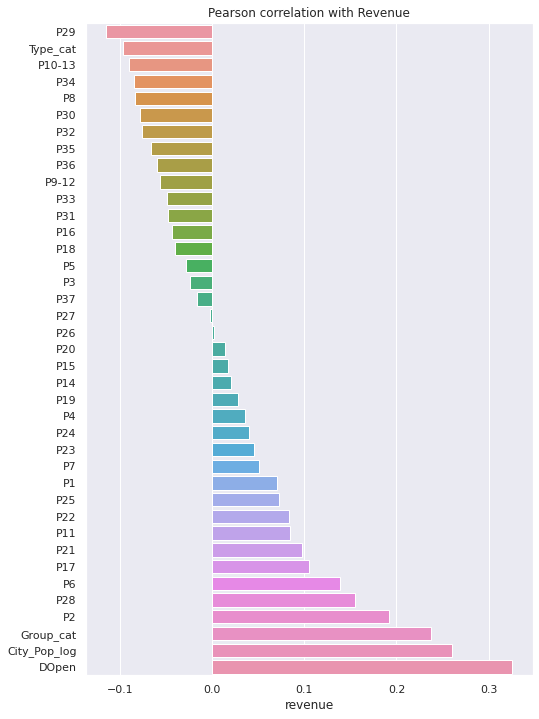

In [74]:
# Creating a plot for the correlation of features to the target variable
cols_attr = list(df_training.drop(columns = ["Id","revenue_log","revenue_C"]).select_dtypes(include = ["int64", "float64"]))

fig = plt.figure(figsize=(8,12))
target_corr = df_training[cols_attr].corr(method='pearson')['revenue']
order_corr = target_corr.sort_values()
y = pd.DataFrame(order_corr).index[:-1]
x = pd.DataFrame(order_corr).revenue[:-1]
sns.barplot(x, y, orient='h').set(title='Pearson correlation with Revenue')
plt.show()

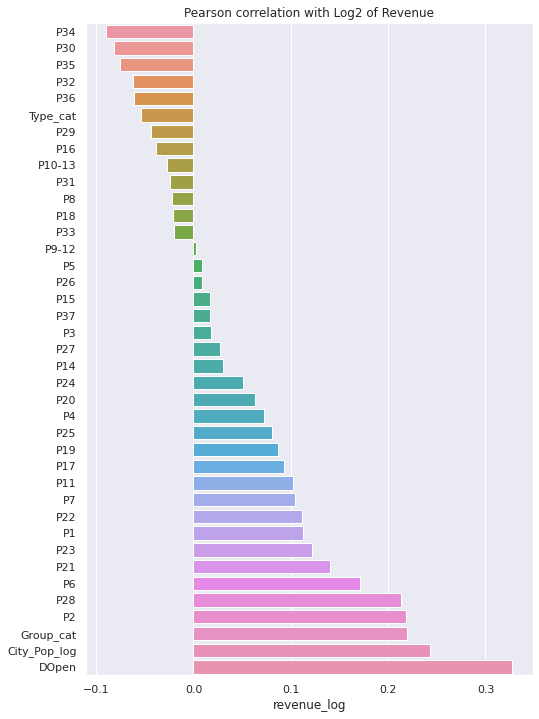

In [75]:
# Creating a plot for the correlation of features to the target variable
cols_attr = list(df_training.drop(columns = ["Id","revenue","revenue_C"]).select_dtypes(include = ["int64", "float64"]))

fig = plt.figure(figsize=(8,12))
target_corr = df_training[cols_attr].corr(method='pearson')['revenue_log']
order_corr = target_corr.sort_values()
y = pd.DataFrame(order_corr).index[:-1]
x = pd.DataFrame(order_corr).revenue_log[:-1]
sns.barplot(x, y, orient='h').set(title='Pearson correlation with Log2 of Revenue')
plt.show()

Correlation between the target (revenue_log) and the attributes would indicate P1 & P6 should have played a role while P37 should not. 

Create training and validation set

In [76]:
from sklearn.model_selection import train_test_split
X = df_training[features]
y = df_training['revenue_log']
X_train, X_validate, y_train, y_validate = train_test_split(X, y, test_size=0.2, random_state=42)

In [77]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 109 entries, 100010 to 100102
Data columns (total 39 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   P1            109 non-null    float64
 1   P2            109 non-null    float64
 2   P3            109 non-null    float64
 3   P4            109 non-null    float64
 4   P5            109 non-null    float64
 5   P6            109 non-null    float64
 6   P7            109 non-null    float64
 7   P8            109 non-null    float64
 8   P11           109 non-null    float64
 9   P14           109 non-null    float64
 10  P15           109 non-null    float64
 11  P16           109 non-null    float64
 12  P17           109 non-null    float64
 13  P18           109 non-null    float64
 14  P19           109 non-null    float64
 15  P20           109 non-null    float64
 16  P21           109 non-null    float64
 17  P22           109 non-null    float64
 18  P23           109 non-

##[Linear Regression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html) estimation

In [78]:
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression()

In [79]:
print(regressor.intercept_)

21.93323002522482


In [80]:
pd.DataFrame(regressor.coef_, index = features, columns=["Coef:"])

,Coef:
P1,0.055206
P2,-0.021994
P3,-0.011053
P4,0.044149
P5,-0.062928
P6,0.025665
P7,-0.034341
P8,-0.572834
P11,-0.128656
P14,-0.093888


City group category doesn't appear to have any effect, while restaurant type has a positive on revenue

In [81]:
# Metrics
from sklearn.metrics import r2_score, mean_squared_error, explained_variance_score, accuracy_score

# Calculating predictions
pred = regressor.predict(X_train[features])

# Metrics
print('Linear Regression')
print('Metrics for training')
print("R2 Score:", r2_score(y_train, pred))
print("Expl. Var.:", explained_variance_score(y_train, pred))
print("MSE:", mean_squared_error(y_train, pred))
print("-"*30)

# Calculating predictions
predT = regressor.predict(X_validate[features])

# Metrics
print('Linear Regression')
print('Metrics for validation data')
print("R2 Score:", r2_score(y_validate, predT))
print("Expl. Var.:", explained_variance_score(y_validate, predT))
print("MSE:", mean_squared_error(y_validate, predT))

Linear Regression
Metrics for training
R2 Score: 0.5115148626565653
Expl. Var.: 0.5115148626565651
MSE: 0.21519247266544206
------------------------------
Linear Regression
Metrics for validation data
R2 Score: -1.257010467592055
Expl. Var.: -1.070390145101102
MSE: 1.4005523032769926


Very over trained with an extremely poor result.  LASSO regression can help determine which features to drop.

##[LASSO Regression with CV](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LassoCV.html?highlight=lasso#sklearn.linear_model.LassoCV)

In [82]:
from sklearn.linear_model import LassoCV

model_LassoCV = LassoCV()

model_LassoCV.fit(X_train, y_train)

important_features = pd.DataFrame(model_LassoCV.coef_, index = features, columns=["Coef:"])
important_features.loc[(important_features!=0).any(axis=1)]

,Coef:
P28,0.079571
P30,-0.069196
P32,-0.008989
DOpen,0.106244
City_Pop_log,0.074643


In [83]:
# Metrics
print('LASSO Regression')
print('Metrics for training')
print("R2 Score:", r2_score(y_train, pred))
print("Expl. Var.:", explained_variance_score(y_train, pred))
print("MSE:", mean_squared_error(y_train, pred))
print("-"*30)

# Calculating predictions
predT = regressor.predict(X_validate[features])

# Metrics
print('LASSO Regression')
print('Metrics for validation data')
print("R2 Score:", r2_score(y_validate, predT))
print("Expl. Var.:", explained_variance_score(y_validate, predT))
print("MSE:", mean_squared_error(y_validate, predT))

LASSO Regression
Metrics for training
R2 Score: 0.5115148626565653
Expl. Var.: 0.5115148626565651
MSE: 0.21519247266544206
------------------------------
LASSO Regression
Metrics for validation data
R2 Score: -1.257010467592055
Expl. Var.: -1.070390145101102
MSE: 1.4005523032769926


While the results are poor the analysis also indicates only 3 of the P column along with DOpen and City population appears to have any impact on the revenue and the results on the validation set extremely poor

##[RIDGE](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.RidgeCV.html) regression CV

In [84]:
from sklearn.linear_model import RidgeCV

model_RidgeCV = RidgeCV()

model_RidgeCV.fit(X_train, y_train)

important_features = pd.DataFrame(model_RidgeCV.coef_, index = features, columns=["Coef:"])
important_features.loc[(important_features!=0).any(axis=1)]

,Coef:
P1,-0.001362
P2,0.023621
P3,-0.012319
P4,0.041451
P5,-0.026546
P6,-0.013860
P7,0.014329
P8,-0.140599
P11,-0.059832
P14,0.007276


In [85]:
# Metrics
print('RIDGE Regression')
print('Metrics for training')
print("R2 Score:", r2_score(y_train, pred))
print("Expl. Var.:", explained_variance_score(y_train, pred))
print("MSE:", mean_squared_error(y_train, pred))
print("-"*30)

# Calculating predictions
predT = regressor.predict(X_validate[features])

# Metrics
print('RIDGE Regression')
print('Metrics for validation data')
print("R2 Score:", r2_score(y_validate, predT))
print("Expl. Var.:", explained_variance_score(y_validate, predT))
print("MSE:", mean_squared_error(y_validate, predT))

RIDGE Regression
Metrics for training
R2 Score: 0.5115148626565653
Expl. Var.: 0.5115148626565651
MSE: 0.21519247266544206
------------------------------
RIDGE Regression
Metrics for validation data
R2 Score: -1.257010467592055
Expl. Var.: -1.070390145101102
MSE: 1.4005523032769926


RIDGE regression appears to have the same problem as LASSO and Linear

#Testing for the best Regression Method

In [86]:
# Analysis can either be done with the full feature or a trimed dataset
features2 = list(df_merged.drop(columns = ["Id","revenue","revenue_log","revenue_C"]).select_dtypes(include = ["int64", "float64"]))
features = [e for e in features2 if e not in PsZeros]
X = df_training[features]
target = 'revenue_log'
y = df_training[target]  #choose are 'revenue', 'revenue_log'
X_train, X_validate, y_train, y_validate = train_test_split(X, y, test_size=0.2, random_state=42)

from sklearn.linear_model import LinearRegression
#from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV
from sklearn.svm import LinearSVR
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from xgboost import XGBRegressor,plot_importance
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.model_selection import cross_val_score

regressors = [
    ('Linear Regression' , LinearRegression(fit_intercept=True)),
    ('RIDGE Regression' , RidgeCV(fit_intercept=True)),
    ('LASSO Regression' , LassoCV(fit_intercept=True)),
    ('Linear SVR',LinearSVR(fit_intercept=True)),
    ('Support Vector Machines' , SVR()),
    ('Ada Boost Regression' , AdaBoostRegressor()),
    ('Decision Tree' , DecisionTreeRegressor()),
    ('Random Forest' , RandomForestRegressor()),
    ('K-nearest Neighbors' , KNeighborsRegressor()),
    ('SKlearn HistGBoost', HistGradientBoostingRegressor()),
    ('XGBoost' , XGBRegressor())
]
results=pd.DataFrame(columns=['MAE','MSE','R2-score'])
for method,func in regressors:
  #print(func)
  model = func.fit(X_train, y_train)
  pred = model.predict(X_validate)
  results.loc[method]= [mean_absolute_error(y_validate,pred),
                          mean_squared_error(y_validate,pred),
                          round(r2_score(y_validate,pred),2)
                         ]
print('Results not using Features with significant zeros')
results

[21:16:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Results not using Features with significant zeros


,MAE,MSE,R2-score
Linear Regression,0.687109,0.693155,-0.12
RIDGE Regression,0.611569,0.563570,0.09
LASSO Regression,0.579908,0.546921,0.12
Linear SVR,0.936457,1.288935,-1.08
Support Vector Machines,0.589108,0.532261,0.14
Ada Boost Regression,0.527118,0.452990,0.27
Decision Tree,0.598354,0.575326,0.07
Random Forest,0.557585,0.471431,0.24
K-nearest Neighbors,0.576386,0.526137,0.15
SKlearn HistGBoost,0.547537,0.455697,0.27


Results are poor with no solution having R2 over 0.65 with all the methods having R2 > 0.3

In [87]:
# Repeat with all the features
features = list(df_merged.drop(columns = ["Id","revenue","revenue_log","revenue_C"]).select_dtypes(include = ["int64", "float64"]))
X = df_training[features]
target = 'revenue_log'
y = df_training[target]  #choose are 'revenue', 'revenue_log'
X_train, X_validate, y_train, y_validate = train_test_split(X, y, test_size=0.2, random_state=42)

from sklearn.linear_model import LinearRegression
#from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV
from sklearn.svm import LinearSVR
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from xgboost import XGBRegressor,plot_importance
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.model_selection import cross_val_score

regressors = [
    ('Linear Regression' , LinearRegression(fit_intercept=True)),
    ('RIDGE Regression' , RidgeCV(fit_intercept=True)),
    ('LASSO Regression' , LassoCV(fit_intercept=True)),
    ('Linear SVR',LinearSVR(fit_intercept=True)),
    ('Support Vector Machines' , SVR()),
    ('Ada Boost Regression' , AdaBoostRegressor()),
    ('Decision Tree' , DecisionTreeRegressor()),
    ('Random Forest' , RandomForestRegressor()),
    ('K-nearest Neighbors' , KNeighborsRegressor()),
    ('SKlearn HistGBoost', HistGradientBoostingRegressor()),
    ('XGBoost' , XGBRegressor())
]
results=pd.DataFrame(columns=['MAE','MSE','R2-score'])
for method,func in regressors:
  #print(func)
  model = func.fit(X_train, y_train)
  pred = model.predict(X_validate)
  results.loc[method]= [mean_absolute_error(y_validate,pred),
                          mean_squared_error(y_validate,pred),
                          round(r2_score(y_validate,pred),2)
                         ]
print('Results all the Features')
results

[21:16:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Results all the Features


,MAE,MSE,R2-score
Linear Regression,0.858552,1.400552,-1.26
RIDGE Regression,0.662180,0.633465,-0.02
LASSO Regression,0.583384,0.542663,0.13
Linear SVR,1.020485,1.708823,-1.75
Support Vector Machines,0.569027,0.508047,0.18
Ada Boost Regression,0.522371,0.455931,0.27
Decision Tree,0.643936,0.615934,0.01
Random Forest,0.531872,0.441435,0.29
K-nearest Neighbors,0.580063,0.542178,0.13
SKlearn HistGBoost,0.556817,0.490025,0.21


The methods that appears to be most stable are: SVM, Ada Boost, Random Forest & GBoost

In [88]:
# Repeat Analysis with a different randon state number
X = df_training[features]
target = 'revenue_log'
y = df_training[target]  #choose are 'revenue', 'revenue_log'
X_train, X_validate, y_train, y_validate = train_test_split(X, y, test_size=0.2, random_state=123)

regressors = [
    ('Linear Regression' , LinearRegression(fit_intercept=True)),
    ('RIDGE Regression' , RidgeCV(fit_intercept=True)),
    ('LASSO Regression' , LassoCV(fit_intercept=True)),
    ('Linear SVR',LinearSVR(fit_intercept=True)),
    ('Support Vector Machines' , SVR()),
    ('Ada Boost Regression' , AdaBoostRegressor()),
    ('Decision Tree' , DecisionTreeRegressor()),
    ('Random Forest' , RandomForestRegressor()),
    ('K-nearest Neighbors' , KNeighborsRegressor()),
    ('SKlearn HistGBoost', HistGradientBoostingRegressor()),
    ('XGBoost' , XGBRegressor())
]
results=pd.DataFrame(columns=['MAE','MSE','R2-score'])
for method,func in regressors:
  #print(func)
  model = func.fit(X_train, y_train)
  pred = model.predict(X_validate)
  results.loc[method]= [mean_absolute_error(y_validate,pred),
                          mean_squared_error(y_validate,pred),
                          round(r2_score(y_validate,pred),2)
                         ]
print('Results using a new random number')
results

[21:16:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Results using a new random number


,MAE,MSE,R2-score
Linear Regression,0.648933,0.563946,-0.10
RIDGE Regression,0.572132,0.493552,0.04
LASSO Regression,0.565339,0.494957,0.04
Linear SVR,0.824160,0.990046,-0.93
Support Vector Machines,0.504303,0.378522,0.26
Ada Boost Regression,0.539147,0.479091,0.07
Decision Tree,0.712624,0.776852,-0.51
Random Forest,0.520542,0.435417,0.15
K-nearest Neighbors,0.563229,0.474358,0.08
SKlearn HistGBoost,0.577509,0.523368,-0.02


Repeating the analysis with a different random number produces significantly different results.  The SVM, ADA & RF still have positive results but DT & one of the GB flip to negative.

In [89]:
# Repeat Analysis with a different randon state number
X = df_training[features]
target = 'revenue_log'
y = df_training[target]  #choose are 'revenue', 'revenue_log'
X_train, X_validate, y_train, y_validate = train_test_split(X, y, test_size=0.2, random_state=777)

regressors = [
    ('Linear Regression' , LinearRegression(fit_intercept=True)),
    ('RIDGE Regression' , RidgeCV(fit_intercept=True)),
    ('LASSO Regression' , LassoCV(fit_intercept=True)),
    ('Linear SVR',LinearSVR(fit_intercept=True)),
    ('Support Vector Machines' , SVR()),
    ('Ada Boost Regression' , AdaBoostRegressor()),
    ('Decision Tree' , DecisionTreeRegressor()),
    ('Random Forest' , RandomForestRegressor()),
    ('K-nearest Neighbors' , KNeighborsRegressor()),
    ('SKlearn HistGBoost', HistGradientBoostingRegressor()),
    ('XGBoost' , XGBRegressor())
]
results=pd.DataFrame(columns=['MAE','MSE','R2-score'])
for method,func in regressors:
  #print(func)
  model = func.fit(X_train, y_train)
  pred = model.predict(X_validate)
  results.loc[method]= [mean_absolute_error(y_validate,pred),
                          mean_squared_error(y_validate,pred),
                          round(r2_score(y_validate,pred),2)
                         ]
print('Results using again a new random number')
results

[21:16:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Results using again a new random number


,MAE,MSE,R2-score
Linear Regression,0.909583,1.398190,-1.54
RIDGE Regression,0.690903,0.665163,-0.21
LASSO Regression,0.624440,0.570958,-0.04
Linear SVR,1.094002,2.007708,-2.65
Support Vector Machines,0.584791,0.519678,0.06
Ada Boost Regression,0.507285,0.409824,0.26
Decision Tree,0.583899,0.558210,-0.01
Random Forest,0.493704,0.380413,0.31
K-nearest Neighbors,0.621964,0.532013,0.03
SKlearn HistGBoost,0.614588,0.550565,0.00


3rd run appear to show only RF & XGB are the only stable methods.

##[Support Vector](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVR.html#sklearn.svm.SVR)  
Another method to determine the important features to use in the modelling is [feature_selection](https://scikit-learn.org/stable/modules/feature_selection.html)

In [90]:
from sklearn.feature_selection import SequentialFeatureSelector as SFS
from sklearn.svm import SVR

modelSV = SVR().fit(X, y)

sfs2 = SFS(modelSV, n_features_to_select=5,
           direction = 'forward',
           scoring='r2',
           n_jobs=-1,
           cv=5)
sfs2 = sfs2.fit(X, y)

best_features = np.arange(X.shape[1])[sfs2.support_]

print('Support Vector - Feature Selection')
for i in best_features:
  print(features[i])

Support Vector - Feature Selection
P11
P17
P28
P30
DOpen


##[ADA Boost](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostRegressor.html#sklearn.ensemble.AdaBoostRegressor)

In [91]:
from sklearn.feature_selection import SequentialFeatureSelector as SFS
from sklearn.ensemble import AdaBoostRegressor

modelADA = AdaBoostRegressor().fit(X, y)

sfs2 = SFS(modelADA, n_features_to_select=5,
           direction = 'forward',
           scoring='r2',
           n_jobs=-1,
           cv=5)
sfs2 = sfs2.fit(X, y)

best_features = np.arange(X.shape[1])[sfs2.support_]

print('ADA Boost - Feature Selection')
for i in best_features:
  print(features[i])

ADA Boost - Feature Selection
P17
P34
P36
Group_cat
Type_cat


[Randomized Search]()

In [92]:
from sklearn.model_selection import RandomizedSearchCV

# Parameters to test
params = {
    "n_estimators": np.arange(50, 400, 50),
    "learning_rate": np.arange(0.02, 0.1, 0.02)
}

# Grid Search
grid_cv = RandomizedSearchCV(modelADA, params, scoring = "r2", cv = 5, n_iter = 10, verbose=1).fit(X_train, y_train)

# Best Model
print(f"Best parameters are {grid_cv.best_params_} with R2 score of {grid_cv.best_score_}!")

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters are {'n_estimators': 150, 'learning_rate': 0.06} with R2 score of 0.18514688259359388!


In [93]:
! pip install scikit-optimize

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


[BayesSearch](https://scikit-optimize.github.io/stable/modules/generated/skopt.BayesSearchCV.html) for hyperparameters

In [94]:
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer

opt = BayesSearchCV(
    AdaBoostRegressor(),
    {    "n_estimators": Integer(50, 400),
    "learning_rate": Real(0.02, 0.1)
    },
    n_iter=32,
    random_state=0,
    cv=5
)

# executes bayesian optimization
_ = opt.fit(X_train, y_train)

# model can be saved, used for predictions or scoring
print(opt.score(X_validate, y_validate))
print(opt.best_params_)

0.148462098274717
OrderedDict([('learning_rate', 0.04952155534335534), ('n_estimators', 168)])


##[Random Forest](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html#sklearn.ensemble.RandomForestRegressor)

In [95]:
from sklearn.feature_selection import SequentialFeatureSelector as SFS
from sklearn.ensemble import RandomForestRegressor

modelRF = RandomForestRegressor(n_estimators=200,oob_score=True,max_features=0.7).fit(X, y)
important_features = pd.DataFrame(modelRF.feature_importances_, index = features, columns=["Weight"]).sort_values(by = ['Weight'],ascending = False)
print('Random Forest - Feature Importance')
print(important_features[:5])

sfs2 = SFS(modelRF, n_features_to_select=5,
           direction = 'forward',
           scoring='r2',
           n_jobs=-1,
           cv=5)
sfs2 = sfs2.fit(X, y)

best_features = np.arange(X.shape[1])[sfs2.support_]

print('Random Forest - Feature Selection')
for i in best_features:
  print(features[i])

Random Forest - Feature Importance
                Weight
DOpen         0.266943
City_Pop_log  0.093451
P28           0.067419
P29           0.059112
P1            0.040488
Random Forest - Feature Selection
P17
P21
P23
DOpen
Group_cat


In [96]:
from sklearn.model_selection import RandomizedSearchCV

# Parameters to test
params = {
    "n_estimators": np.arange(50, 400, 50),
    "max_depth": np.arange(3,7,2),
    "max_features": np.arange(0.5,0.9,0.1)
}

# Grid Search
grid_cv = RandomizedSearchCV(modelRF, params, scoring = "r2", cv = 5, n_iter = 10, verbose=1).fit(X_train, y_train)

# Best Model
print(f"Best parameters are {grid_cv.best_params_} with R2 score of {grid_cv.best_score_}!")

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters are {'n_estimators': 250, 'max_features': 0.7, 'max_depth': 3} with R2 score of 0.1852439691940328!


In [97]:
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer

opt = BayesSearchCV(
    RandomForestRegressor(),
    {    "n_estimators": Integer(50, 400),
    "max_features": Real(0.5, 1),
     "max_depth": Integer(3,7)
    },
    n_iter=32,
    random_state=0,
    cv=5
)

# executes bayesian optimization
_ = opt.fit(X_train, y_train)

# model can be saved, used for predictions or scoring
print(opt.score(X_validate, y_validate))
print(opt.best_params_)

0.23792043142343644
OrderedDict([('max_depth', 7), ('max_features', 0.6052293823744922), ('n_estimators', 56)])


##[KNeighbour](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsRegressor.html?highlight=kneighborsregressor#sklearn.neighbors.KNeighborsRegressor)

In [98]:
from sklearn.feature_selection import SequentialFeatureSelector as SFS
from sklearn.neighbors import KNeighborsRegressor

modelKN = KNeighborsRegressor().fit(X, y)

sfs2 = SFS(modelKN, n_features_to_select=5,
           direction = 'forward',
           scoring='r2',
           n_jobs=-1,
           cv=5)
sfs2 = sfs2.fit(X, y)

best_features = np.arange(X.shape[1])[sfs2.support_]

print('KNeighbour - Feature Selection')
for i in best_features:
  print(features[i])

KNeighbour - Feature Selection
P19
P20
P28
DOpen
City_Pop_log


In [99]:
from sklearn.model_selection import RandomizedSearchCV

# Parameters to test
params = {
    "n_neighbors": np.arange(3, 9, 2)
}

# Grid Search
grid_cv = RandomizedSearchCV(modelKN, params, scoring = "r2", cv = 5, n_iter = 10, verbose=1).fit(X_train, y_train)

# Best Model
print(f"Best parameters are {grid_cv.best_params_} with R2 score of {grid_cv.best_score_}!")

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Best parameters are {'n_neighbors': 7} with R2 score of 0.12089646467205495!


In [100]:
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer

opt = BayesSearchCV(
    KNeighborsRegressor(),
    {    "n_neighbors": Integer(3, 9),
    },
    n_iter=32,
    random_state=0,
    cv=5
)

# executes bayesian optimization
_ = opt.fit(X_train, y_train)

# model can be saved, used for predictions or scoring
print(opt.score(X_validate, y_validate))
print(opt.best_params_)

0.11267728186091341
OrderedDict([('n_neighbors', 8)])


##[Histogram Gradient Boosting](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.HistGradientBoostingRegressor.html?highlight=histgradientboostingregressor#sklearn.ensemble.HistGradientBoostingRegressor)

In [101]:
from sklearn.feature_selection import SequentialFeatureSelector as SFS
from sklearn.ensemble import HistGradientBoostingRegressor

modelHGB = HistGradientBoostingRegressor().fit(X, y)

sfs2 = SFS(modelHGB, n_features_to_select=5,
           direction = 'forward',
           scoring='r2',
           n_jobs=-1,
           cv=5)
sfs2 = sfs2.fit(X, y)

best_features = np.arange(X.shape[1])[sfs2.support_]

print('Hist GBoost - Feature Selection')
for i in best_features:
  print(features[i])

Hist GBoost - Feature Selection
P8
P14
P23
DOpen
City_Pop_log


In [102]:
from sklearn.model_selection import RandomizedSearchCV

# Parameters to test
params = {
    "max_iter": np.arange(50, 400, 50),
    "max_depth": np.arange(3,10,1),
    "learning_rate": np.arange(0.02, 0.1, 0.02)
}

# Grid Search
grid_cv = RandomizedSearchCV(modelHGB, params, scoring = "r2", cv = 5, n_iter = 10, verbose=1).fit(X_train, y_train)

# Best Model
print(f"Best parameters are {grid_cv.best_params_} with R2 score of {grid_cv.best_score_}!")

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters are {'max_iter': 50, 'max_depth': 3, 'learning_rate': 0.04} with R2 score of 0.15341940679792576!


In [103]:
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer

opt = BayesSearchCV(
    HistGradientBoostingRegressor(),
    {    "max_iter": Integer(50,400),
     "max_depth": Integer(3, 9),
     "learning_rate": Real(0.02,1)
    },
    n_iter=32,
    random_state=0,
    cv=5
)

# executes bayesian optimization
_ = opt.fit(X_train, y_train)

# model can be saved, used for predictions or scoring
print(opt.score(X_validate, y_validate))
print(opt.best_params_)

0.04692100784587094
OrderedDict([('learning_rate', 0.02), ('max_depth', 9), ('max_iter', 89)])


##[XGBoost](https://xgboost.readthedocs.io/en/stable/parameter.html#)

In [104]:
from sklearn.feature_selection import SequentialFeatureSelector as SFS
from xgboost import XGBRegressor,plot_importance

modelXGB = XGBRegressor().fit(X, y)
important_features = pd.DataFrame(modelXGB.feature_importances_, index = features, columns=["Weight"]).sort_values(by = ['Weight'],ascending = False)
print('XGBoost - Feature Importance')
print(important_features[:5])

sfs2 = SFS(modelXGB, n_features_to_select=5,
           direction = 'forward',
           scoring='r2',
           n_jobs=-1,
           cv=5)
sfs2 = sfs2.fit(X, y)

best_features = np.arange(X.shape[1])[sfs2.support_]

print('XGBoost - Feature Selection')
for i in best_features:
  print(features[i])

[21:27:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
XGBoost - Feature Importance
                Weight
P34           0.092488
P2            0.057913
P25           0.057877
P14           0.056329
City_Pop_log  0.050172
XGBoost - Feature Selection
P15
P17
P21
P23
Group_cat


In [105]:
from sklearn.model_selection import RandomizedSearchCV

# Parameters to test
params = {
    "max_depth": np.arange(4, 10, 2),
    "n_estimators": np.arange(50, 400, 50),
    "max_features": np.arange(0.5,0.9,0.2),
    "learning_rate": np.arange(0.02, 0.1, 0.02)
}

# Grid Search
grid_cv = RandomizedSearchCV(modelXGB, params, scoring = "r2", cv = 5, n_iter = 10, verbose=1).fit(X_train, y_train);

# Best Model
print(f"Best parameters are {grid_cv.best_params_} with R2 score of {grid_cv.best_score_}!")

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[21:27:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:27:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:27:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:27:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:27:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:27:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:27:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:27:46] WARNING: /workspace/src/objective/regre

In [106]:
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer

opt = BayesSearchCV(
    XGBRegressor(),
    {   
    "max_depth": Integer(4, 10),
    "n_estimators": Integer(50, 400),
    "max_features": Real(0.5,0.9),
    "learning_rate": Real(0.02, 0.1) 
    },
    n_iter=32,
    random_state=0,
    cv=5
)

# executes bayesian optimization
_ = opt.fit(X_train, y_train)

# model can be saved, used for predictions or scoring
print(opt.score(X_validate, y_validate))
print(opt.best_params_)

[21:27:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:27:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:27:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:27:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:27:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:27:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:27:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:27:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

#Feature Selection
The features appears multiple times: City_Pop_Log, DOpen, P28  
Twice: P2, P4, P6, P19, P29


Please note that the feature selection problems was run without the columns containing zeros (P14-P18, P24-P27 & P30-37).  

Resplit the training & test data out

In [107]:
df_training = df_merged[df_merged['revenue'] >= -100]
df_testing = df_merged[df_merged['revenue'].isna()].copy()

In [108]:
# Estimate using the SFS and average hyper-parameters
featuresLASSO = ['DOpen','P17','P26','P28','P30','P32','P34']
featuresRIDGE = ['P28','P36','P9-12','P25','P19','P24','P35','P10-13','P16','P34','P20','P8','P26']
featuresCORR = ['DOpen','P28','City_Pop_log','P1','P2','P6','P21']
featuresSFS = ['DOpen','City_Pop_log','Type_cat','P2','P17','P21','P23','P26','P28','P14','P15','P31','P32','P33','P34','P35','P36']
X = df_training[featuresSFS]
y = df_training['revenue_log']  #choose are 'revenue', 'revenue_log'
X_train, X_validate, y_train, y_validate = train_test_split(X, y, test_size=0.2, random_state=42)

regressors = [
    ('Support Vector Machines' , SVR()),
    ('AdaBoost Regressor' , AdaBoostRegressor(n_estimators= 200, learning_rate= 0.04)),
    ('Random Forest' , RandomForestRegressor(n_estimators=200, max_depth= 5,oob_score=True,max_features=0.7)),
    ('K-nearest Neighbors' , KNeighborsRegressor(n_neighbors= 7)),
    ('SKlearn HistGBoost', HistGradientBoostingRegressor(max_iter=200,max_depth=5,learning_rate=0.04)),
    ('XGBoost' , XGBRegressor(n_estimators= 200, max_depth= 5, learning_rate= 0.04,max_features=0.7))]

results=pd.DataFrame(columns=['MAE','MSE','R2-score'])
for method,func in regressors:
  #print(func)
  model = func.fit(X_train, y_train)
  pred = model.predict(X_validate)
  results.loc[method]= [mean_absolute_error(y_validate,pred),mean_squared_error(y_validate,pred),
                          round(r2_score(y_validate,pred)*100,1)]
print('Analysis using the trimed Features')
results

[21:28:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Analysis using the trimed Features


,MAE,MSE,R2-score
Support Vector Machines,0.569482,0.513354,17.3
AdaBoost Regressor,0.555718,0.501438,19.2
Random Forest,0.562958,0.483045,22.2
K-nearest Neighbors,0.592606,0.532308,14.2
SKlearn HistGBoost,0.563903,0.495765,20.1
XGBoost,0.583957,0.517176,16.7


# [VotingRegressor](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.VotingRegressor.html#sklearn.ensemble.VotingRegressor)  
Routine for using a soft voting method to derive the best result from a number of machine learning approaches

In [109]:
from sklearn.ensemble import VotingRegressor

# Train classifiers
reg1 = SVR()
reg2 = AdaBoostRegressor(n_estimators= 200, learning_rate= 0.04)
reg3 = RandomForestRegressor(n_estimators=200, max_depth= 5,oob_score=True,max_features=0.7)
reg4 = KNeighborsRegressor(n_neighbors= 7)
reg5 = HistGradientBoostingRegressor(max_iter=200,max_depth=5,learning_rate=0.04)
reg6 = XGBRegressor(n_estimators=200,max_depth=5,learning_rate=0.04,max_features=0.7)

reg1.fit(X_train, y_train)
reg2.fit(X_train, y_train)
reg3.fit(X_train, y_train)
reg4.fit(X_train, y_train)
reg5.fit(X_train, y_train)
reg6.fit(X_train, y_train)

ereg = VotingRegressor([("SVR", reg1), ("ADA", reg2), ("RF", reg3), ("KN", reg4), ("HGB", reg5), ("XGB", reg6)])
ereg.fit(X_train, y_train)

pred = ereg.predict(X_train[featuresSFS])
# Metrics
print('Voting Regression')
print('Metrics for training')
print("R2 Score:", r2_score(y_train, pred))
print("Expl. Var.:", explained_variance_score(y_train, pred))
print("MSE:", mean_squared_error(y_train, pred))
print("-"*30)

# Calculating predictions
predT = ereg.predict(X_validate[featuresSFS])
# Metrics
print('Voting Regression')
print('Metrics for validation data')
print("R2 Score:", r2_score(y_validate, predT))
print("Expl. Var.:", explained_variance_score(y_validate, predT))
print("MSE:", mean_squared_error(y_validate, predT))

[21:28:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:28:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Voting Regression
Metrics for training
R2 Score: 0.6837533419251764
Expl. Var.: 0.6838726074048029
MSE: 0.13931621480523743
------------------------------
Voting Regression
Metrics for validation data
R2 Score: 0.21844458747916407
Expl. Var.: 0.21892281747203413
MSE: 0.4849819036561522


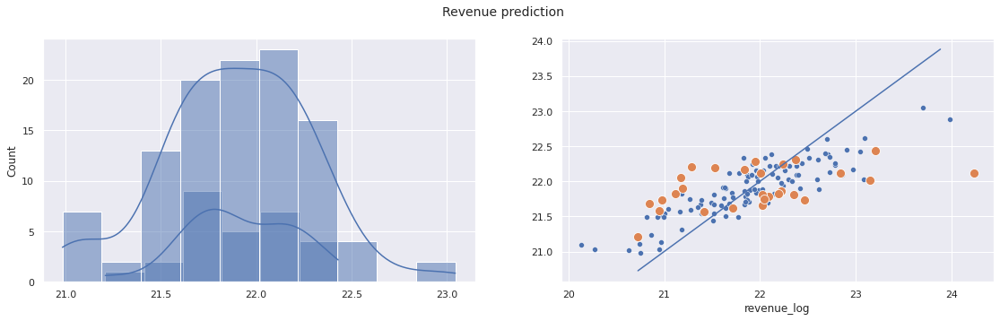

In [110]:
line = arange(np.min(y_validate),np.max(y_validate),(np.max(y_validate)-np.min(y_validate))/10)
fig, ax = plt.subplots(1,2, figsize=(19, 5))
g1 = sns.histplot(x=predT,kde=True, ax=ax[0])
g1 = sns.histplot(x=pred,kde=True, ax=ax[0])
g2 = sns.scatterplot(x=y_train,y=pred, ax=ax[1])
g2 = sns.scatterplot(x=y_validate,y=predT, s=100, ax=ax[1])
g2 = sns.lineplot(line,line, ax=ax[1])
plt.suptitle('Revenue prediction',fontsize=14)
fig.show();

Results always appear to have a rotated output between predicted and actual revenue

## Change the random number

In [111]:
# Analysis can either be done with the full feature or a trimed dataset
              
X = df_training[featuresSFS]
y = df_training['revenue_log']  #choose are 'revenue', 'revenue_log'
X_train, X_validate, y_train, y_validate = train_test_split(X, y, test_size=0.2, random_state=123)

results=pd.DataFrame(columns=['MAE','MSE','R2-score'])
for method,func in regressors:
  #print(func)
  model = func.fit(X_train, y_train)
  pred = model.predict(X_validate)
  results.loc[method]= [mean_absolute_error(y_validate,pred),
                          mean_squared_error(y_validate,pred),
                          round(r2_score(y_validate,pred)*100,1)
                         ]
print('Analysis using the trimed Features')
results


[21:28:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Analysis using the trimed Features


,MAE,MSE,R2-score
Support Vector Machines,0.450880,0.332004,35.4
AdaBoost Regressor,0.471691,0.390672,24.0
Random Forest,0.476671,0.382656,25.6
K-nearest Neighbors,0.514041,0.440492,14.3
SKlearn HistGBoost,0.479570,0.409674,20.3
XGBoost,0.496785,0.365026,29.0


Changing the random number for the training split continues to demonstrate a different R2 result

In [112]:
# Train classifiers

reg1.fit(X_train, y_train)
reg2.fit(X_train, y_train)
reg3.fit(X_train, y_train)
reg4.fit(X_train, y_train)
reg5.fit(X_train, y_train)
reg6.fit(X_train, y_train)

ereg = VotingRegressor([("SVR", reg1), ("ADA", reg2), ("RF", reg3), ("KN", reg4), ("HGB", reg5), ("XGB", reg6)])
ereg.fit(X_train, y_train)

pred = ereg.predict(X_train[featuresSFS])
# Metrics
print('Voting Regression')
print('Metrics for training')
print("R2 Score:", r2_score(y_train, pred))
print("Expl. Var.:", explained_variance_score(y_train, pred))
print("MSE:", mean_squared_error(y_train, pred))
print("-"*30)

# Calculating predictions
predT = ereg.predict(X_validate[featuresSFS])
# Metrics
print('Voting Regression')
print('Metrics for validation data')
print("R2 Score:", r2_score(y_validate, predT))
print("Expl. Var.:", explained_variance_score(y_validate, predT))
print("MSE:", mean_squared_error(y_validate, predT))

[21:28:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:28:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Voting Regression
Metrics for training
R2 Score: 0.6741692297958685
Expl. Var.: 0.6742469541425806
MSE: 0.15087307454796114
------------------------------
Voting Regression
Metrics for validation data
R2 Score: 0.290488819364628
Expl. Var.: 0.2921118572600051
MSE: 0.36485852649175393


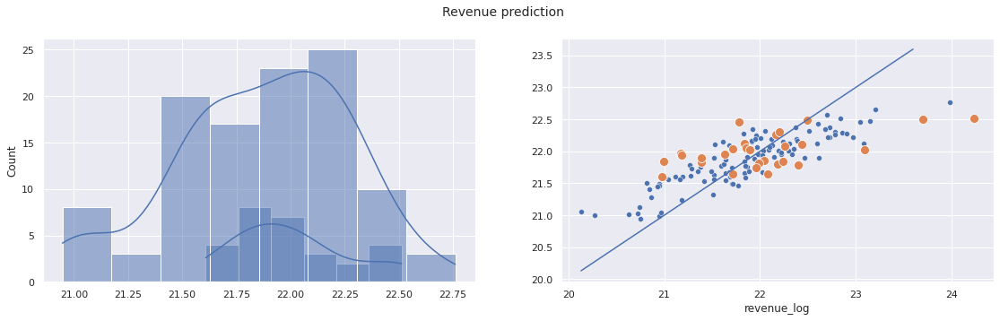

In [113]:
line = arange(np.min(y_train),np.max(y_train),(np.max(y_train)-np.min(y_train))/10)
fig, ax = plt.subplots(1,2, figsize=(19, 5))
g1 = sns.histplot(x=predT,kde=True, ax=ax[0])
g1 = sns.histplot(x=pred,kde=True, ax=ax[0])
g2 = sns.scatterplot(x=y_train,y=pred, ax=ax[1])
g2 = sns.scatterplot(x=y_validate,y=predT, s=100, ax=ax[1])
g2 = sns.lineplot(line,line, ax=ax[1])
plt.suptitle('Revenue prediction',fontsize=14)
fig.show();

The results are highly dependent on the training and test data split.

##Stack Estimation

Using 100% of training data to provide an estimate on the overall test data

In [114]:
X = df_training[featuresSFS]
y = df_training['revenue_log']

reg1.fit(X, y)
reg2.fit(X, y)
reg3.fit(X, y)
reg4.fit(X, y)
reg5.fit(X, y)
reg6.fit(X, y)

ereg = VotingRegressor([("SVR", reg1), ("ADA", reg2), ("RF", reg3), ("KN", reg4), ("HGB", reg5), ("XGB", reg6)])
ereg.fit(X, y)

pred = ereg.predict(X[featuresSFS])
# Metrics
print('Voting Regression')
print('Metrics for training')
print("R2 Score:", r2_score(y, pred))
print("Expl. Var.:", explained_variance_score(y, pred))
print("MSE:", mean_squared_error(y, pred))

[21:28:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:28:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Voting Regression
Metrics for training
R2 Score: 0.6688473156872218
Expl. Var.: 0.6690857462548963
MSE: 0.1581098983759088


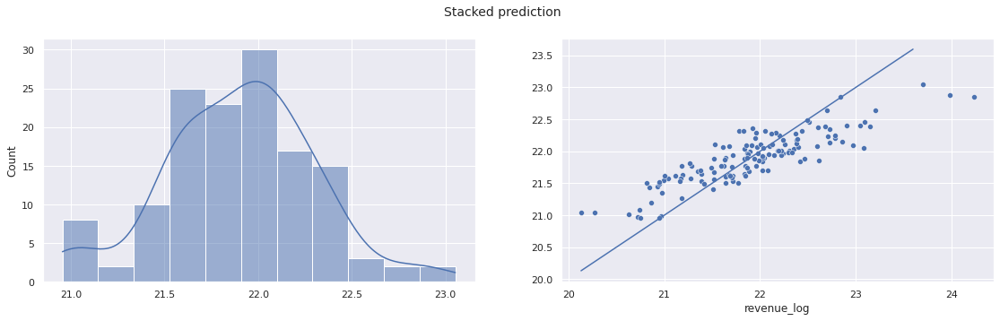

In [115]:
line = arange(np.min(y_train),np.max(y_train),(np.max(y_train)-np.min(y_train))/10)
fig, ax = plt.subplots(1,2, figsize=(19, 5))
g1 = sns.histplot(x=pred,kde=True, ax=ax[0])
g2 = sns.scatterplot(x=y,y=pred, ax=ax[1])
g2 = sns.lineplot(line,line, ax=ax[1])
plt.suptitle('Stacked prediction',fontsize=14)
fig.show();

##Correcting of estimate to match the actual target

In [116]:
from sklearn.linear_model import LinearRegression

# Creating the model
model_lr = LinearRegression(fit_intercept=False)

meanY = np.mean(y)

y_center = y.tolist() - meanY
p_center = pred - meanY

# Linear model on the train data
model_lr.fit(p_center.reshape(-1,1), y_center)
revInt = model_lr.intercept_
revSlope = model_lr.coef_
slope = revSlope[0]

print('Intercept is ', revInt,' +', slope,'x days open')

Intercept is  0.0  + 1.4886096155688042 x days open


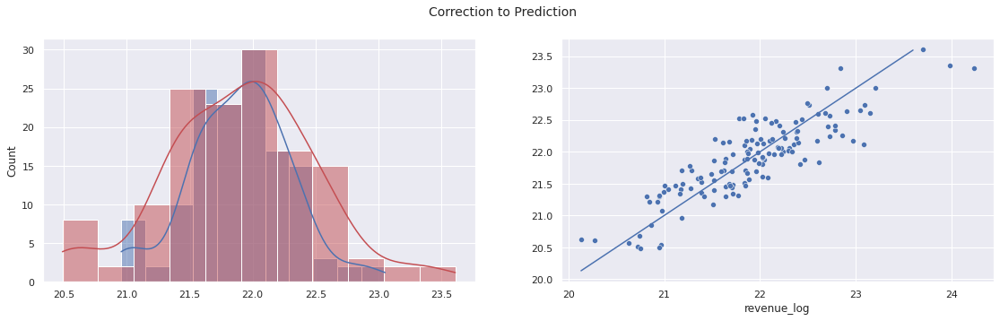

In [117]:
predC = p_center*slope + meanY
fig, ax = plt.subplots(1,2, figsize=(19, 5))
g1 = sns.histplot(x=pred,kde=True, ax=ax[0])
g1 = sns.histplot(x=predC,kde=True, color='r',ax=ax[0])
g2 = sns.scatterplot(x=y,y=predC, ax=ax[1])
g2 = sns.lineplot(line,line, ax=ax[1])
plt.suptitle('Correction to Prediction',fontsize=14)
fig.show();

#Estimation on Test Data

In [118]:
df_test['Prediction'] = ereg.predict(df_testing[featuresSFS])
df_test['PredictionR'] = revInt + slope * (df_test['Prediction']-meanY) + meanY

df_test['Prediction'] = np.power(2,df_test['Prediction'])
df_test['PredictionR'] = np.power(2,df_test['PredictionR'])

# Export initial results

In [119]:
# Export results for submission
print('data saved to directory')
outputFeature = ['Id','Prediction']
df = pd.DataFrame(df_test[outputFeature])
df.to_csv(filepath + '/CDSsubmission.csv', sep=',', index=False)

data saved to directory


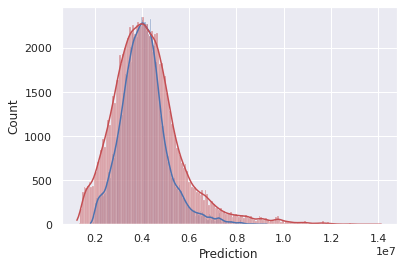

In [120]:
sns.histplot(x=df['Prediction'],kde=True)
sns.histplot(x=df_test['PredictionR'],kde=True,color='r')

[Text(0.5, 1.0, 'Training Revenue for comparison')]

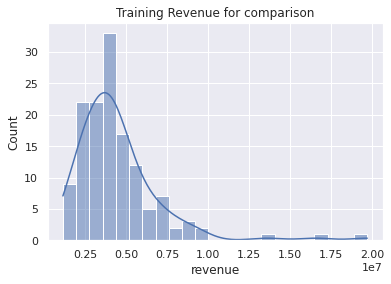

In [121]:
sns.histplot(x=df_train['revenue'],kde=True).set(title='Training Revenue for comparison')

#Estimate for IL  
The prediction so far has not used the columns with the zeros. As these column appear only to correlate with the IL type a second run will be performed and merged with the first.

In [122]:
# Analysis can either be done with the full feature 
features = list(df_merged.drop(columns = ["Id","revenue","revenue_log","revenue_C","Type_cat"]).select_dtypes(include = ["int64", "float64"]))
X = df_training[features][df_training['Type_cat'] == 1]
target = 'revenue_log'
y = df_training[target][df_training['Type_cat'] == 1]  
X_train, X_validate, y_train, y_validate = train_test_split(X, y, test_size=0.2, random_state=42)

In [123]:
X.describe().T

,count,mean,std,min,25%,50%,75%,max
P1,60.0,0.193882,1.172569,-1.097708,-0.475612,-0.031257,0.057613,2.812610
P2,60.0,0.155316,1.143925,-2.398969,-0.299557,0.400247,0.400247,2.149757
P3,60.0,0.387207,1.232866,-2.629793,-0.255760,-0.255760,0.931256,3.898798
P4,60.0,0.052141,1.144058,-1.347755,-0.382309,-0.382309,0.583137,2.996751
P5,60.0,0.072315,1.207916,-0.928768,-0.928768,0.009747,0.009747,5.640841
P6,60.0,0.533411,1.501999,-1.228423,-0.575892,0.076639,1.381701,4.644355
P7,60.0,0.282729,1.122023,-1.973940,-0.138006,-0.138006,-0.138006,2.156911
P8,60.0,0.282403,1.236781,-2.287383,-0.541868,0.039970,0.039970,2.949161
P11,60.0,0.074962,1.016976,-1.117879,-0.634294,-0.150710,0.453770,3.234378
P14,60.0,0.063287,0.988024,-0.910949,-0.578007,-0.122533,0.087876,3.750231


In [124]:
results=pd.DataFrame(columns=['MAE','MSE','R2-score'])
for method,func in regressors:
  model = func.fit(X_train, y_train)
  pred = model.predict(X_validate)
  results.loc[method]= [mean_absolute_error(y_validate,pred),
                          mean_squared_error(y_validate,pred),
                          round(r2_score(y_validate,pred),2)
                         ]
print('Results using only the Features without significant zeros')
results

[21:29:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Results using only the Features without significant zeros


,MAE,MSE,R2-score
Support Vector Machines,0.457330,0.363639,0.30
AdaBoost Regressor,0.516712,0.396582,0.24
Random Forest,0.522713,0.414965,0.20
K-nearest Neighbors,0.483527,0.412872,0.21
SKlearn HistGBoost,0.538804,0.496841,0.05
XGBoost,0.546399,0.486404,0.07


In [125]:
modelRF = RandomForestRegressor(n_estimators=200,oob_score=True,max_features=0.8,max_depth=5).fit(X, y)
important_features = pd.DataFrame(modelRF.feature_importances_, index = features, columns=["Weight"]).sort_values(by = ['Weight'],ascending = False)
print('Random Forest - Feature Importance')
print(important_features[:8])

sfs2 = SFS(modelRF, n_features_to_select=7,
           direction = 'forward',
           scoring='r2',
           n_jobs=-1,
           cv=5)
sfs2 = sfs2.fit(X, y)

best_features = np.arange(X.shape[1])[sfs2.support_]

print('Random Forest - Feature Selection')
for i in best_features:
  print(features[i])

Random Forest - Feature Importance
         Weight
P17    0.149068
DOpen  0.102216
P25    0.044335
P28    0.038743
P3     0.038384
P29    0.036090
P37    0.035924
P31    0.033809
Random Forest - Feature Selection
P3
P7
P17
P23
P25
P30
P32


In [126]:
featuresIL = ['DOpen','City_Pop_log','P3','P4','P7','P17','P23','P25','P30','P36','P37']
X = df_training[featuresIL][df_training['Type_cat'] == 1]
y = df_training['revenue_log'][df_training['Type_cat'] == 1]  #choose are 'revenue', 'revenue_log'
X_train, X_validate, y_train, y_validate = train_test_split(X, y, test_size=0.2, random_state=42)


# Parameters to test
params = {
    "n_estimators": np.arange(50, 400, 50),
    "max_depth": np.arange(3,7,2),
    "max_features": np.arange(0.5,0.9,0.1)
}

# Grid Search
grid_cv = RandomizedSearchCV(modelRF, params, scoring = "r2", cv = 5, n_iter = 20, verbose=1).fit(X_train, y_train)

# Best Model
print(f"Best parameters are {grid_cv.best_params_} with R2 score of {grid_cv.best_score_}!")

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best parameters are {'n_estimators': 350, 'max_features': 0.5, 'max_depth': 5} with R2 score of 0.13145820076264647!


In [127]:
# Train classifiers
reg1 = SVR()
reg2 = AdaBoostRegressor(n_estimators= 200, learning_rate= 0.04)
reg3 = RandomForestRegressor(n_estimators=200, max_depth= 5,oob_score=True,max_features=0.7)
reg4 = KNeighborsRegressor(n_neighbors= 7)
reg5 = HistGradientBoostingRegressor(max_iter=200,max_depth=5,learning_rate=0.04)
reg6 = XGBRegressor(n_estimators=200,max_depth=5,learning_rate=0.04,max_features=0.7)

reg1.fit(X_train, y_train)
reg2.fit(X_train, y_train)
reg3.fit(X_train, y_train)
reg4.fit(X_train, y_train)
reg5.fit(X_train, y_train)
reg6.fit(X_train, y_train)

ereg = VotingRegressor([("SVR", reg1), ("ADA", reg2), ("RF", reg3), ("KN", reg4), ("HGB", reg5), ("XGB", reg6)])
ereg.fit(X_train, y_train)

pred = ereg.predict(X_train[featuresIL])
# Metrics
print('Voting Regression')
print('Metrics for training')
print("R2 Score:", r2_score(y_train, pred))
print("Expl. Var.:", explained_variance_score(y_train, pred))
print("MSE:", mean_squared_error(y_train, pred))
print("-"*30)

# Calculating predictions
predT = ereg.predict(X_validate[featuresIL])
# Metrics
print('Metrics for validation data')
print("R2 Score:", r2_score(y_validate, predT))
print("Expl. Var.:", explained_variance_score(y_validate, predT))
print("MSE:", mean_squared_error(y_validate, predT))


[21:34:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:34:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Voting Regression
Metrics for training
R2 Score: 0.7076774543701037
Expl. Var.: 0.7082908094623288
MSE: 0.08832531957825511
------------------------------
Metrics for validation data
R2 Score: 0.2676195275619492
Expl. Var.: 0.2726056669942868
MSE: 0.3812330159150074


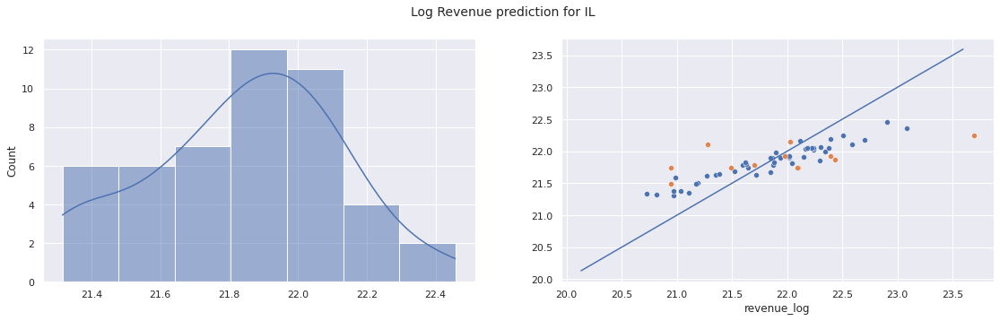

In [128]:
fig, ax = plt.subplots(1,2, figsize=(19, 5))
g1 = sns.histplot(x=pred,kde=True, ax=ax[0])
g2 = sns.scatterplot(x=y_train,y=pred, ax=ax[1])
g2 = sns.scatterplot(x=y_validate,y=predT, ax=ax[1])
g2 = sns.lineplot(line,line, ax=ax[1])
plt.suptitle('Log Revenue prediction for IL',fontsize=14)
fig.show();

In [129]:
df_test['PredictionIL'] = ereg.predict(df_testing[featuresIL])
df_test['PredictionIL'] = np.power(2,df_test['PredictionIL'])

In [130]:
df_test['Prediction1'] = df_test['Prediction']
df_test['Prediction'][df_test['Type'] == 'IL'] = df_test['PredictionIL']

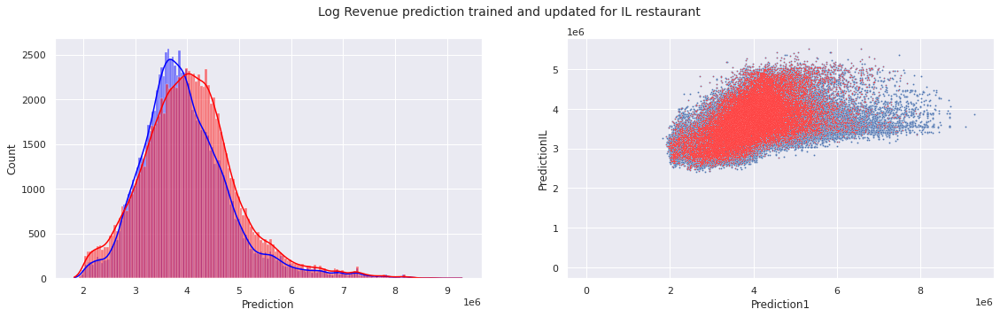

In [131]:
fig, ax = plt.subplots(1,2, figsize=(19, 5))
g1 = sns.histplot(x=df_test['Prediction'],kde=True, ax=ax[0], color='blue')
g1 = sns.histplot(x=df_test['Prediction1'],kde=True, ax=ax[0], color='red')
g2 = sns.scatterplot(x=df_test['Prediction1'],y=df_test['PredictionIL'], ax=ax[1],s=4)
g2 = sns.scatterplot(x=df_test['Prediction1'][df_test['Type'] == 'IL'],y=df_test['PredictionIL'][df_test['Type'] == 'IL'], color='red', ax=ax[1], s=1)
g2 = sns.lineplot(line,line, ax=ax[1])
plt.suptitle('Log Revenue prediction trained and updated for IL restaurant',fontsize=14)
fig.show();

In [132]:
# Export results for submission
print('data saved to directory')
outputFeature = ['Id','Prediction']
df = pd.DataFrame(df_test[outputFeature])
df.to_csv(filepath + '/CDSsubmissionIL.csv', sep=',', index=False)

data saved to directory
